## 1. Configuración

---


### Instalación de las librerias unthermal y unmotor

Ejecute los siguientes comandos en la terminal (bash) de visual studio code para reinstalar las librerias del motor y del sistema térmico. __Asegúrese de instalar  [Git](https://git-scm.com/download/win/ "Git").__

`pip install --ignore-installed  git+https://github.com/nebisman/UNThermal.git@main#subdirectory=code/python_code`

`pip install --ignore-installed  git+https://github.com/nebisman/UNDCMotor.git@main#subdirectory=code/python_code`


Si la instalación reporta algún error de permisos del sistema operativo, use esta opción:


`pip install --ignore-installed --user git+https://github.com/nebisman/UNThermal.git@main#subdirectory=code/python_code`

`pip install --ignore-installed --user git+https://github.com/nebisman/UNDCMotor.git@main#subdirectory=code/python_code`


### Importación de comandos de la libreria unthermal y unmotor

A continuación importamos los comandos básicos que usaremos de la libreria `unthermal` y `unmotor` y la libreria `Matplotlib` para las figuras. 

In [4]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import unthermal as temp
import unmotor as motor



### Ayuda de las funciones del software

Aqui está  [la ayuda de las funciones de software](https://nebisman.github.io/UNThermal/index.html)


### Definición de los sistemas en el IoT

Lo primero que necesitamos es definir tanto el sistema térmico como el motor como sistemas  IoT.

In [5]:
#mi_termico = temp.ThermalSystemIoT(plant_number = "PC-T-12" , broker_address = "192.168.1.100", port=1883)
mi_motor = motor.MotorSystemIoT(plant_number = "PC-M-16" , broker_address = "192.168.1.100", port=1883) 


## Sintonía por métodos algebraicos de un controlador PI para el motor

___

### Obtención de un modelo refinado con una onda PRBS


Una forma de experimento más refinado para obtener el modelo lineal de un sistema en torno de un punto de operación es mediante el uso de **secuencias binarias pseudoaleatorias**. Este tipo de secuencias tienen una mayor riqueza espectral que los simples escalones y, por consiguiente, permiten obtener mejores modelos lineales de un sistema en torno de un punto de operación.

El Motor DC puede ser descrito aproximadamente por  [la siguiente función de transferencia de primer orden](https://github.com/nebisman/UNDCMotor/blob/main/docs/modelo_matematico_unmotor.pdf):

$$G_1(s)= \frac{\alpha}{\tau\, s + 1}.$$

La función `get_models_prbs(system, yop = desired_speed)` (*get models by using a PRBS Pseudo Random Binary Sequence input*) permite obtener la respuesta a una entrada de tipo PRBS y encuentra los modelos de primer y segundo orden que mejor ajustan los datos en el punto de operación `yop`.

#### Experimento con PRBS

+ Encuentre los modelos del motor DC usando la función `get_models_prbs()` para la velocidad de operación de $y_{OP}=360^o/s$.  

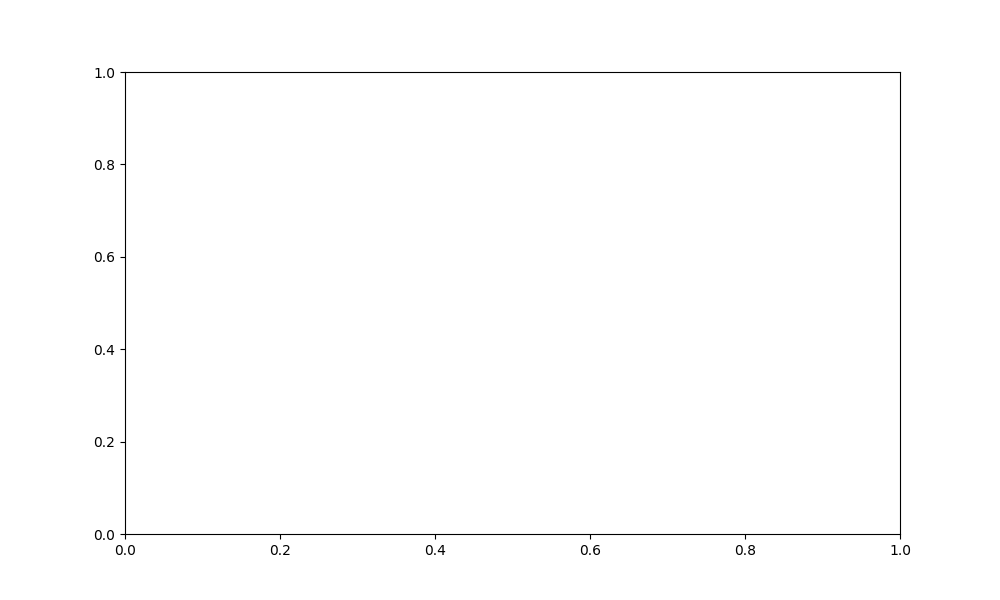

Connected successfully to MQTT Broker!
Subscribed:  1   (2,)
Connected successfully to MQTT Broker!
Subscribed:  5   (2,)


In [ ]:
motor.get_static_model(mi_motor)
plt.savefig("static_model.pdf", format="pdf", bbox_inches="tight") # la figura se guarda en el archivo que ud desee
plt.show() # esta linea es para que la figura se mantenga al guardar el notebook

Starting experiment, please wait...
Connected successfully to MQTT Broker!
Subscribed:  62   (2,)


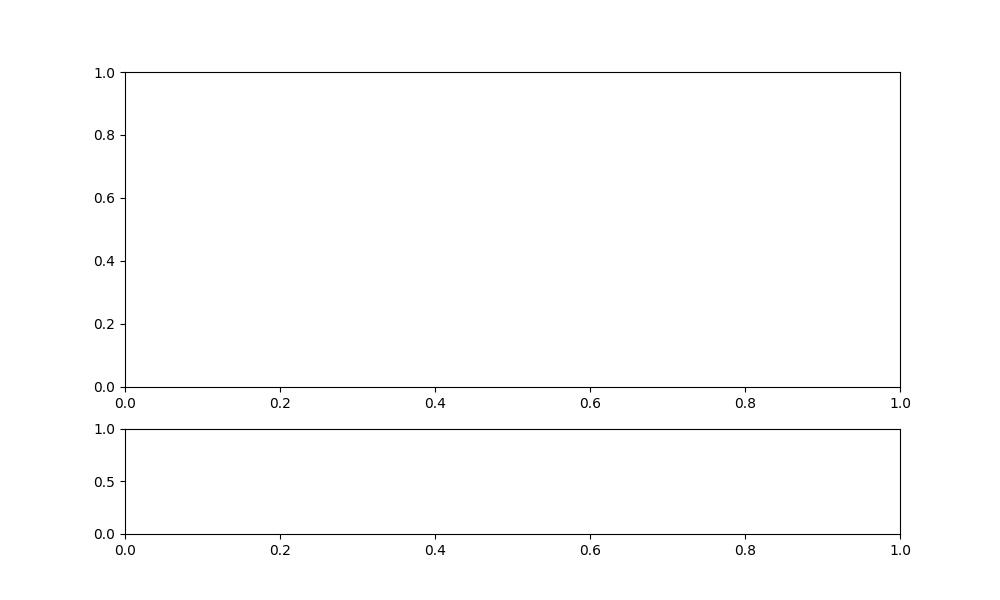

Starting optimization for first order model...
	 Initial cost function: 654.14
	 Final cost function: 622.53
alpha=466.30 	 tau1=0.211


Starting optimization for second order model...
	 Initial cost function: 693.10
	 Final cost function: 584.48
alpha=436.09 	 tau1=0.169 	 tau2=0.021


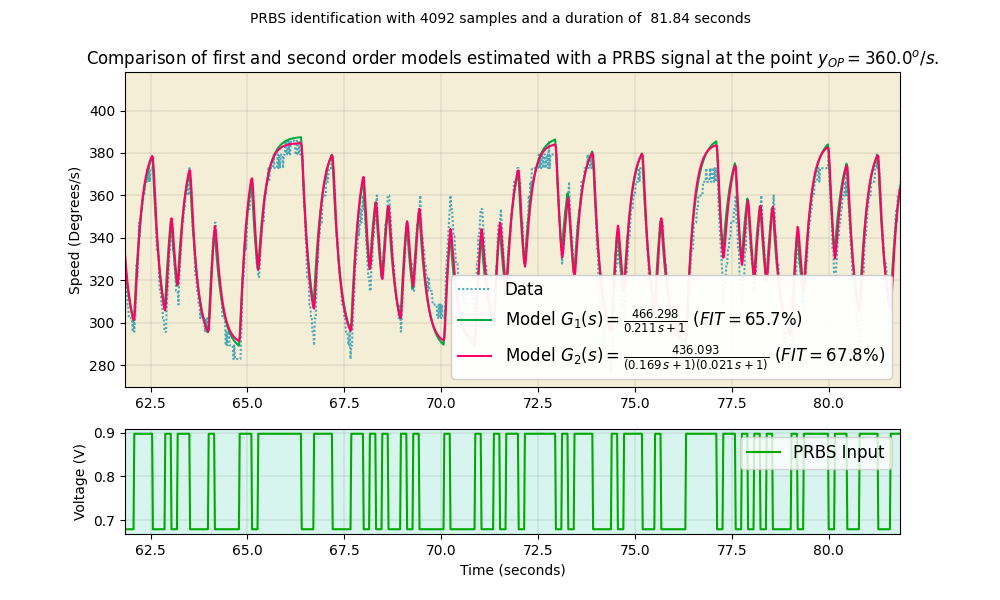

In [ ]:
motor.get_models_prbs(mi_motor, yop=360)
plt.savefig("prbs_model.pdf", format="pdf", bbox_inches="tight") # la figura se guarda en el archivo que ud desee
plt.show() # esta linea es para que la figura se mantenga al guardar el notebook

### Sintonía algebraica de PI para el motor

Antes de comenzar esta guia, revise cuidadosamente y comprenda el [material sobre sintonía algebraica de un  PI para un sistema de primer orden de este documento.](https://github.com/nebisman/UNThermal/blob/main/docs/metodo_sintonia_algebraico_PI_PID.pdf).

Una vez realizada esta revisión realice el siguiente trabajo experimental.


#### Experimento de sintonización de controladores

1. Use el método de sintonía algebraica descrito en el documento para obtener 4 controladores PI de la velocidad angular del motor,  de acuerdo con la siguiente tabla de especificaciones:

| Controlador | $t_{ee}$ (tiempo de establecimiento) | $t_r$ (tiempo de subida) | $SP$ (sobrepico) |
|-------------|-----------|-------|------|
| PI-VEL-1        | $\leq\, 1.5 s$     | $\leq\, 0.8 s$ | $=10\%$  |
| PI-VEL-2        | $\leq\, 1.5 s$     | $\leq\, 0.8 s$ | $=5\%$  |
| PI-VEL-3        | $\leq\, 1.5 s$     | $\leq\, 0.8 s$ | $=0\%$  |
| PI-VEL-4        | $\leq\, 0.2 s$     | $\leq\, 0.1 s$ | $=10\%$  |

In [1]:
#Datos obtenidos de la grafica

#Alpha -> alpha
alpha = 466.298

#Tau -> tau
tau = 0.211

# Te
Te = 0.02

In [6]:

def draw_specifications(tee,tr, SP):
    import mplcursors
    fig=plt.gcf()
    ay, au = fig.get_axes()
    delta_r = r1 - r0

    # tee specification
    ay.axvline(tee+t0, color='#0080668F', linestyle='--', linewidth=1.25)
    ay.text(t0 +tee + t1/50 , r0 + 0.1*delta_r, "$t_{ee}=$", fontsize=14, color='#008066FF')

    # tr specification
    ay.plot([t0, t0+ tr, t0+ tr], [r0 + 0.9*delta_r, r0 + 0.9*delta_r, r0 - 0.1*delta_r],  color='#917c6fff', linestyle='--',linewidth=1.25)
    ay.text(t0 + tr + t1/50 , r0 + 0.1*delta_r, "$t_{r}$", fontsize=14,  color='#917c6fff')

    # SP specification
    ay.axhline(r1 + SP * delta_r /100, color='#d42affff', linestyle='--', linewidth=1.25)
    ay.text(0.8* t0 , r1 + (SP/100 + 0.025 ) * delta_r, "$SP$", fontsize=14, color='#d42affff')

    # pick in the graphic for returning values
    mplcursors.cursor(ay.lines) 
    return ay, au
    


#Definimos las salidas que queremos en objetos 
class Vel:
    def __init__(self, zeta, wn, kp, ki):
        self.zeta = zeta
        self.wn = wn
        self.kp = kp
        self.ki = ki
    def __str__(self):
        return (f"Vel(zeta={self.zeta}, wn={self.wn}, "
                f"kp={self.kp}, ki={self.ki})")


def Zeta(SP):
    ln_val = np.log(SP / 100)
    numerador = abs(ln_val)
    denominador = np.sqrt(np.pi**2 + ln_val**2)
    zeta = numerador / denominador
    return zeta

def Wn(zeta, tau, tee, tr):
    a = 1 / (2 * zeta * tau )
    b = 4.5 / (zeta * tee)
    c = 2.5 / (tr)      
    wn = max(a, b, c)
    return wn


def Kp(wn, alpha, tau, zeta):
    a = 2 * tau * wn * zeta
    kp = (a - 1)/ alpha
    ki = (tau * (wn ** 2)) / alpha 
    return kp

def Ki(wn, alpha, tau):
    ki = (tau * (wn ** 2)) / alpha 
    return ki

def Medio(SP, tee, tr, tau, alpha):
    zeta = Zeta(SP)
    wn = Wn(zeta, tau, tee, tr)
    kp = Kp(wn, alpha, tau, zeta)
    ki = Ki (wn, alpha, tau)
    return zeta, wn ,kp, ki 

def reiterativoWn(wn, zeta, alpha, tau,Te):
    wn += ((0.25/Te)-wn) * 0.5
    kp = Kp(wn, alpha, tau, zeta)
    ki = Ki (wn, alpha, tau)
    return  wn, zeta , kp , ki


def retirativoZeta(wn, zeta, alpha, tau):

    zeta += (1-zeta) * 0.1
    kp = Kp(wn, alpha, tau, zeta)
    ki = Ki (wn, alpha, tau)
    return zeta  , kp , ki



In [7]:
t0 = 0.5
t1 = 2
r0 = 0
r1 = 360

## Notas importantes:

1. El modelo usado para estos diseños es el modelo de primer orden obtenido con la función `get_models_prbs(.)` en el punto de operación de $360^o$.

2. Para el motor DC puede asumir que el tiempo de retraso no modelado es el tiempo de muestreo del controlador digital, esto es: 

$$T_{e}=0.02\,s$$

3. Se tiene también  la restricción de tensión que debemos (y podemos) aplicar al motor, dada por 
$$
|u(t)| \leq 5\,V
$$ 

4. Haga las iteraciones manualmente siguiendo el método, para ganar una comprensión intuitiva. Puede hacer los pasos 1-2 en una celda y en otra celda hacer los pasos 3-8, cambiando convenientemente los parámetros de diseño $\omega_n$ y $\zeta$. 

5. Use un cambio en la referencia de $0$ a $360^o/s$


6. Para todos los experimentos use la función `set_pid()` parametrizada con `beta=0` (para un PI de dos GDL) y con `output=speed` para el control de velocidad, como en el siguiente ejemplo. Puede usar la función `draw_specifications` dada a continuación para revisar los requerimientos de diseño. No tiene que definirla sino una vez.

## CASO 1

In [8]:
###Caso Vel1
tee = 0.8
tr = 1.5
SP = 10
zeta, wn, kp, ki = Medio(SP, tee, tr, tau, alpha)
vel1 = Vel(zeta, wn, kp, ki)


### Primera prueba sin iteracion

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  2   (2,)


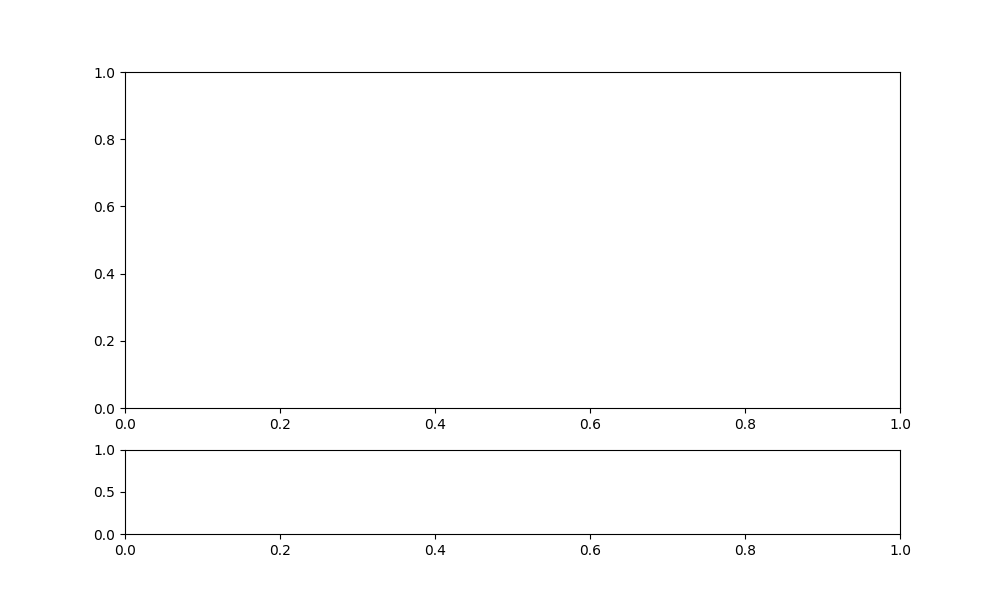

Connected successfully to MQTT Broker!


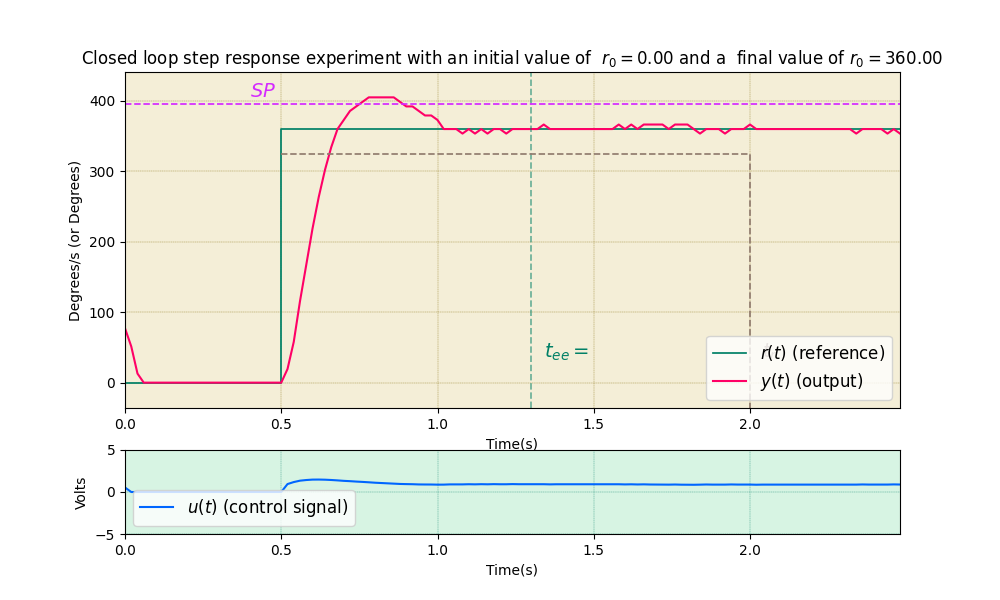

12.500008477105034
0.5911550337988976


In [9]:
motor.set_pid(mi_motor,kp=vel1.kp,ki=vel1.ki,kd=0,beta=1, output="speed")
t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
motor.set_reference(mi_motor,0)
draw_specifications(tee, tr, SP)
plt.savefig("SintoniaAlgbraica_vel_1.png", format="png", bbox_inches="tight") # para salvar la figura
plt.show() # para congelarla en el notebook


SPreal = ((max(y)-r1)/(r1-r0)*100)
print(SPreal)
print(zeta)


In [10]:
resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]
print(resultado)

contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

print(f"Valores mayores que 10: {contador}")



[-78.57142766316731, -85.71428510877821, -96.42857127719455, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -94.64285691579182, -83.92857127719455, -67.8571425543891, -53.57142554389106, -39.28570641411675, -26.785702175564236, -16.071421305338543, -7.142851087782118, 8.477105034722223e-06, 3.5714382595486107, 7.142868041992187, 8.928578694661459, 10.714289347330729, 12.500008477105034, 12.500008477105034, 12.500008477105034, 12.500008477105034, 12.500008477105034, 10.714289347330729, 8.928578694661459, 8.928578694661459, 7.142868041992187, 5.357148912217882, 5.357148912217882, 3.5714382595486107, 8.477105034722223e-06, 8.477105034722223e-06, 8.477105034722223e-06, -1.7857106526692708, 8.477105034722223e-06, -1.7857106526692708, 8.477105034722223e-06, -1.7857106526692708, 8.477105034722223e-06, 8.477105034722223e-06, -1.7857106526692708, 8.47710503472

### Pruebas con iteracion

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  6   (2,)


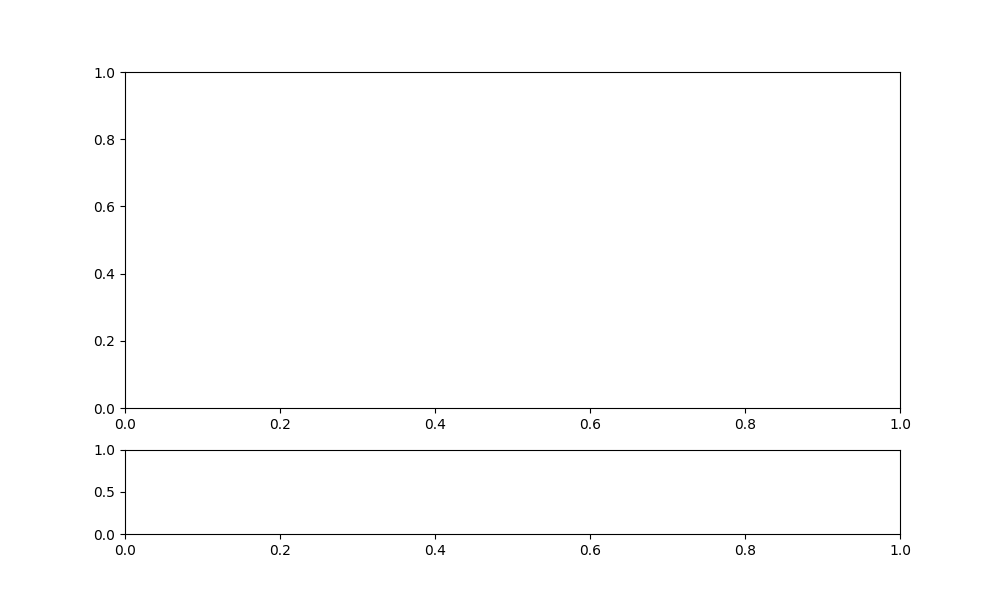

Connected successfully to MQTT Broker!


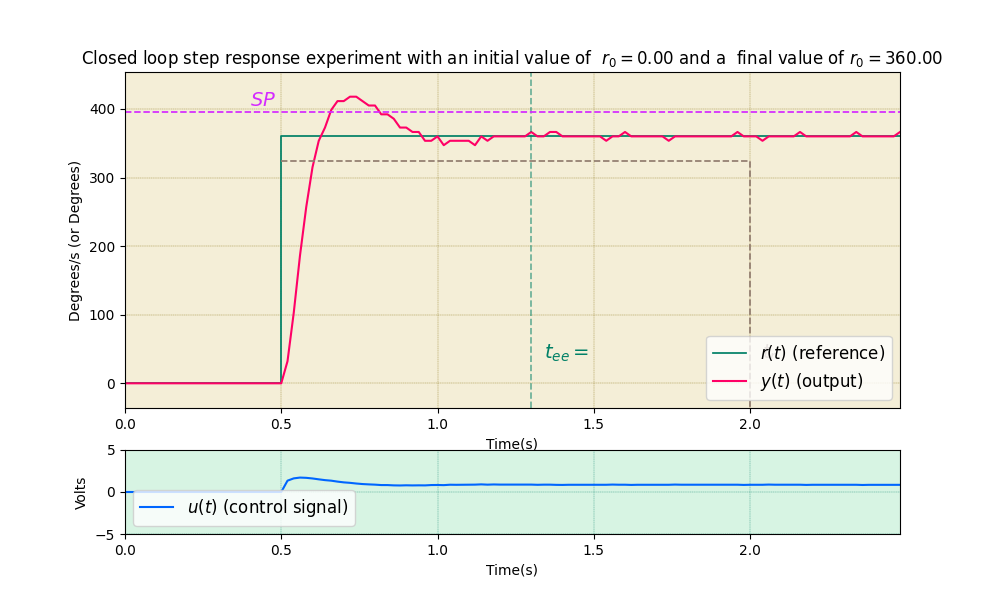

Sobre impulso:  16.07143825954861 %
Kp: 0.0037444861475807154  Ki: 0.05482857511480452  wn: 11.007635204298662
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  10   (2,)


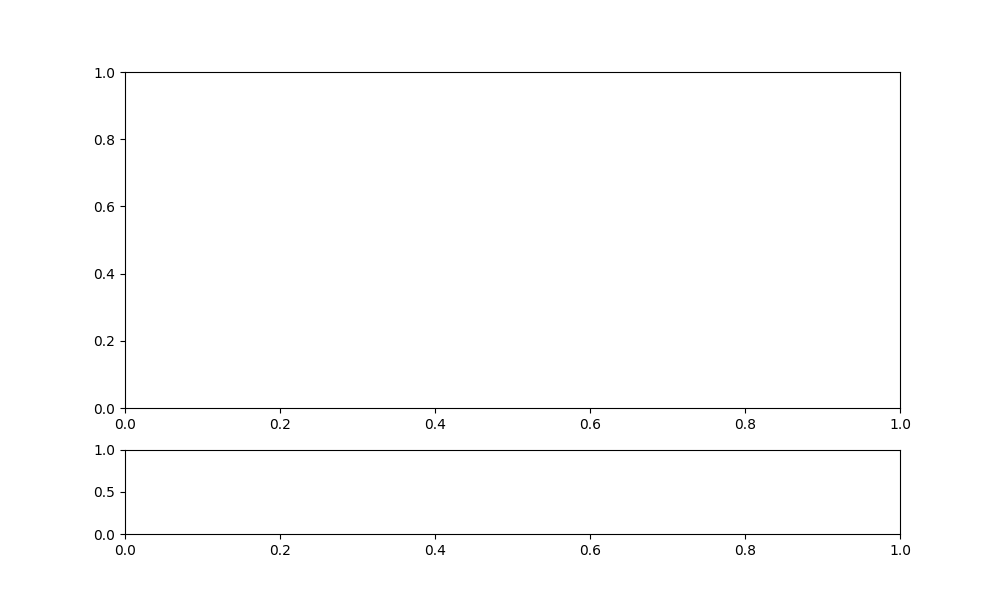

Connected successfully to MQTT Broker!


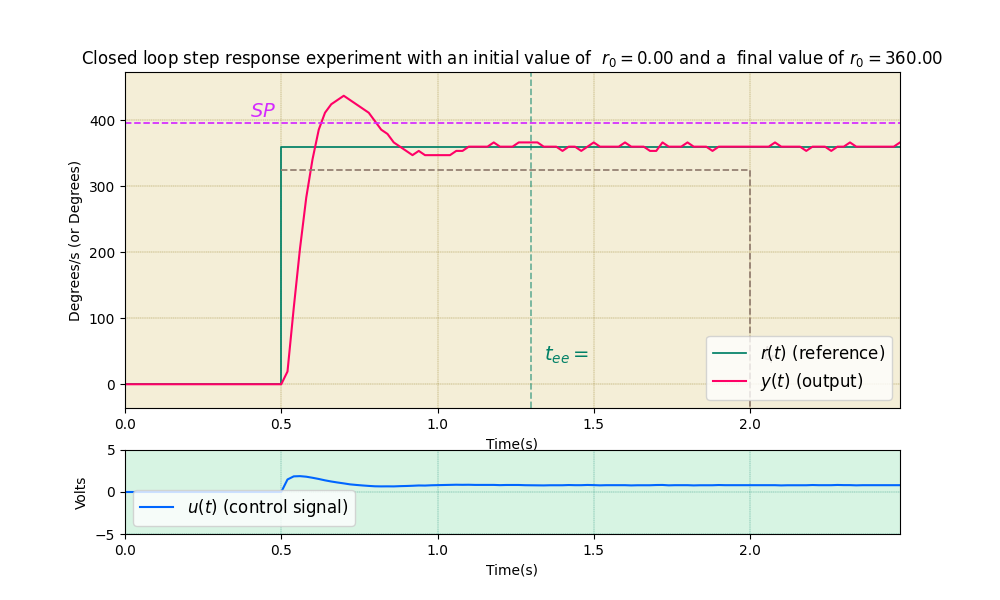

Sobre impulso:  21.428587171766495 %
Kp: 0.00414369052079762  Ki: 0.06251392919418407  wn: 11.753817602149331
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  14   (2,)


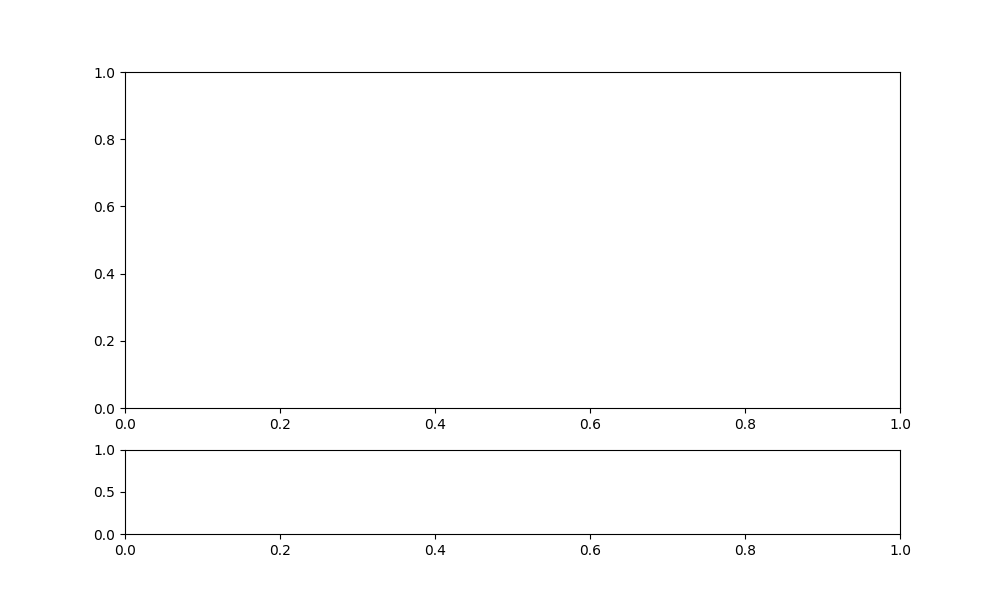

Connected successfully to MQTT Broker!


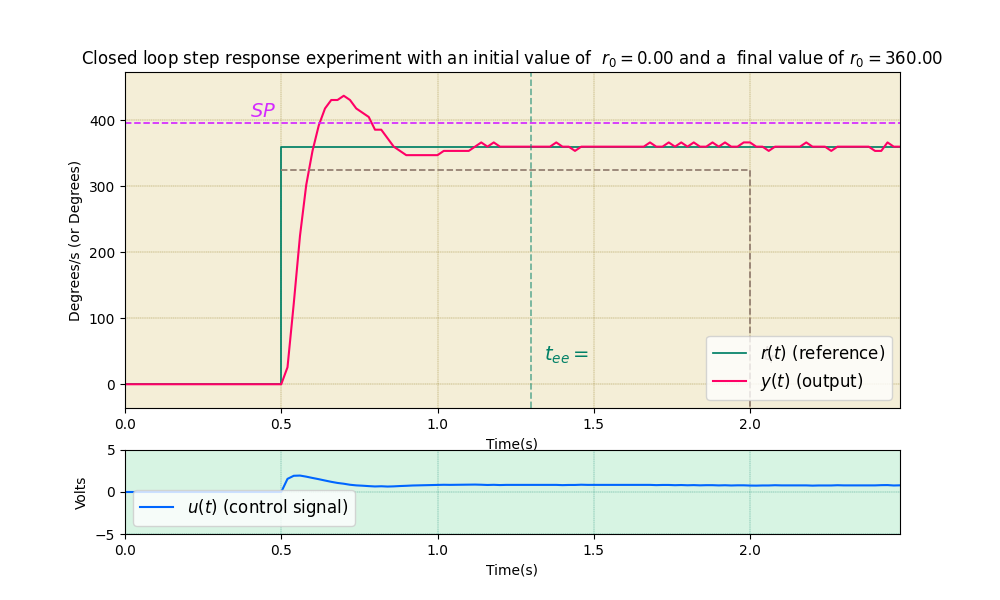

Sobre impulso:  21.428587171766495 %
Kp: 0.004343292707406072  Ki: 0.06654556635816976  wn: 12.126908801074666
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  18   (2,)


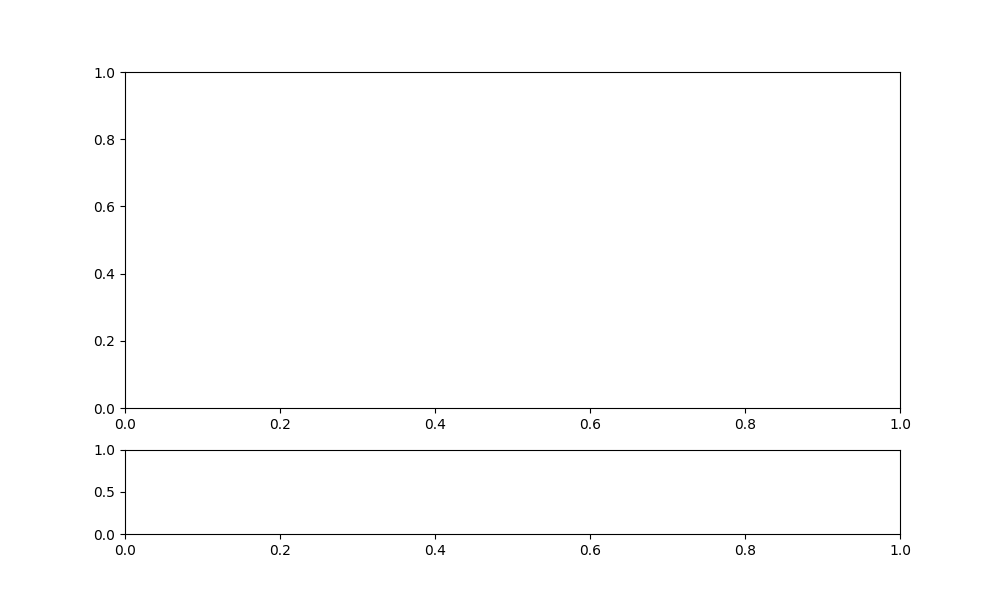

Connected successfully to MQTT Broker!


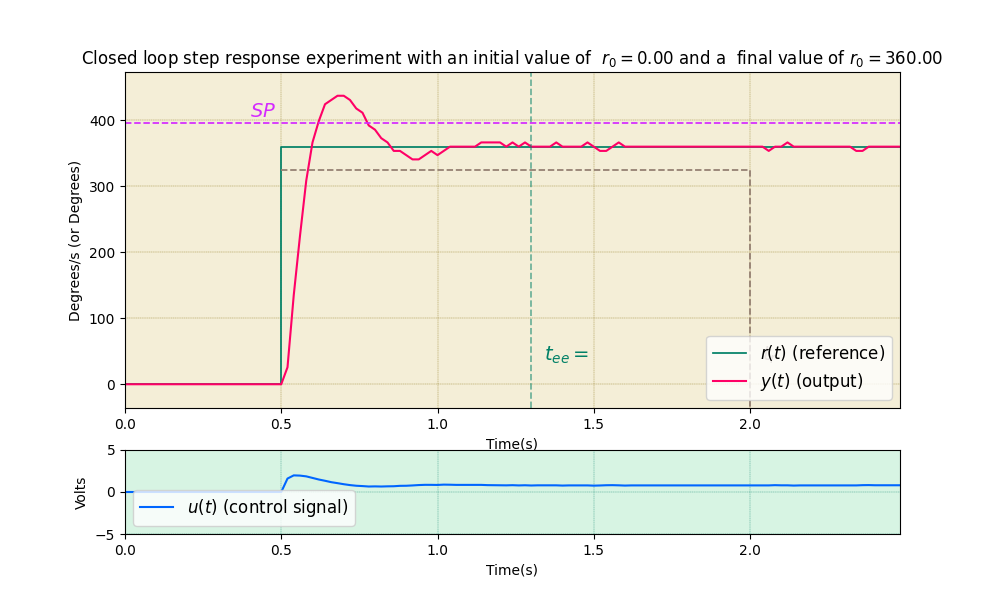

Sobre impulso:  21.428587171766495 %
Kp: 0.004443093800710298  Ki: 0.06860862497123658  wn: 12.313454400537333
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  22   (2,)


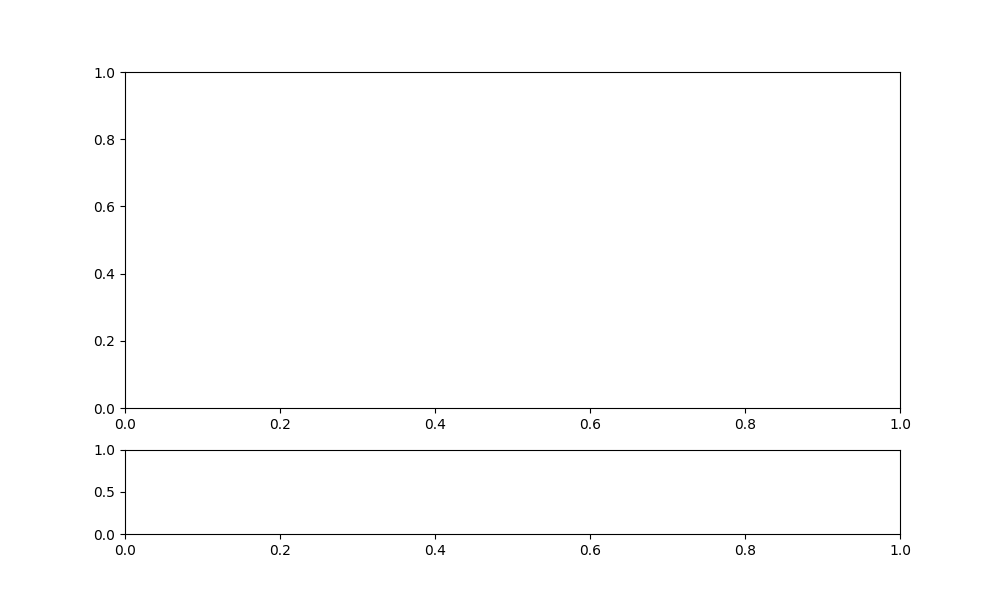

Connected successfully to MQTT Broker!


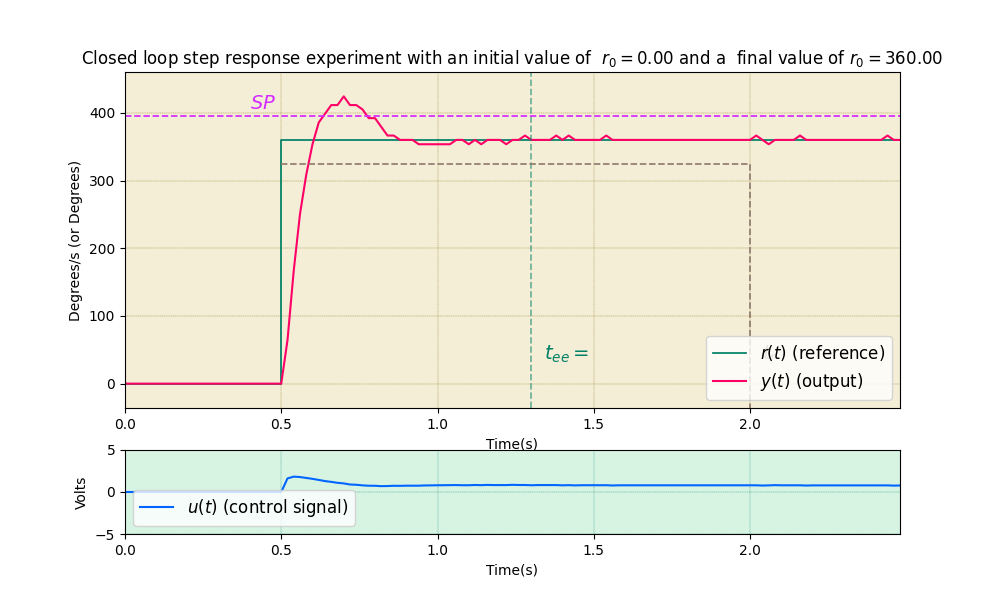

Sobre impulso:  17.857157389322918 %
Kp: 0.004492994347362411  Ki: 0.06965196428553846  wn: 12.406727200268666
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  26   (2,)


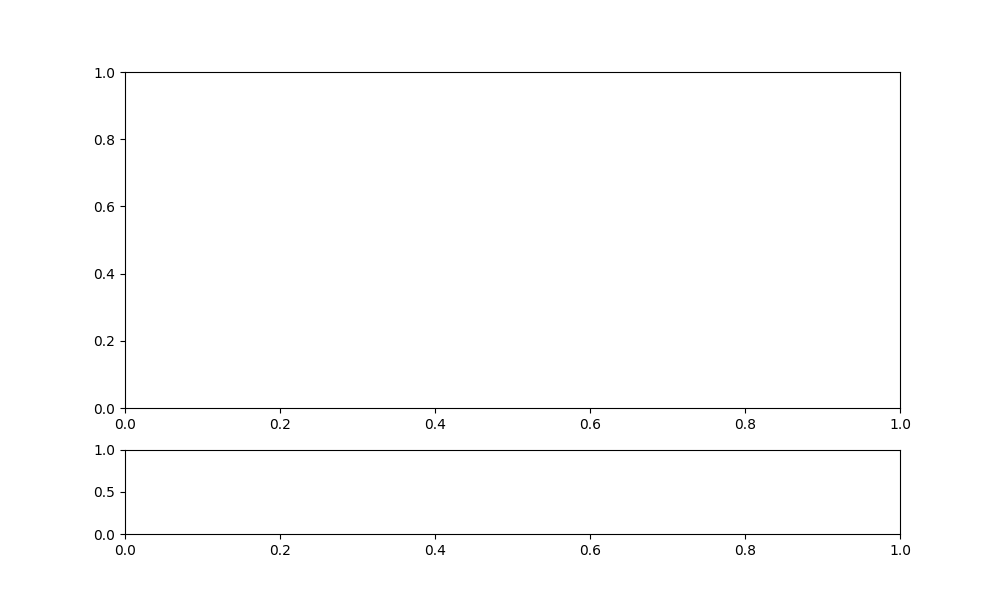

Connected successfully to MQTT Broker!


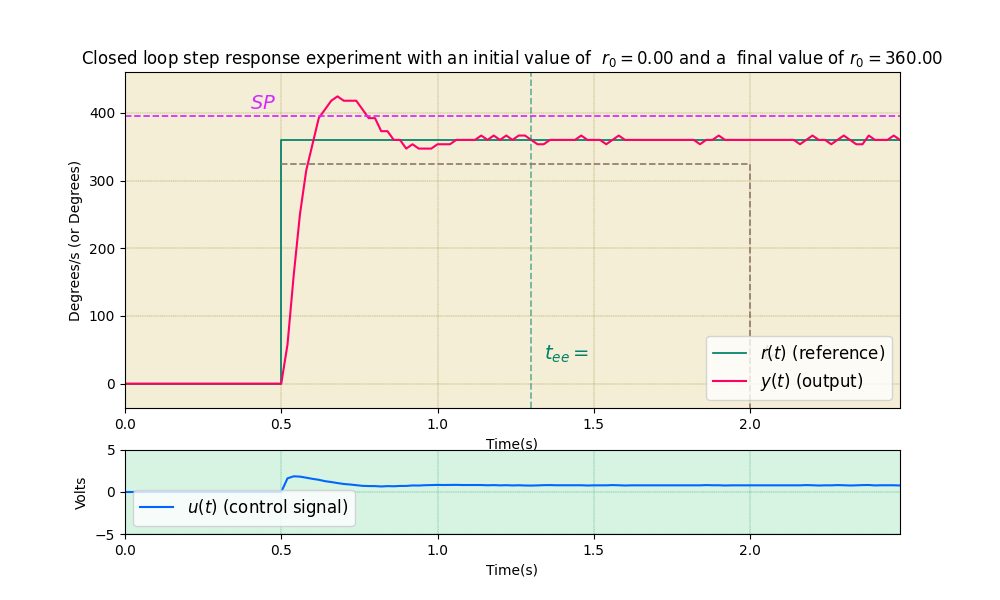

Sobre impulso:  17.857157389322918 %
Kp: 0.004517944620688467  Ki: 0.07017658644463157  wn: 12.453363600134333
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  30   (2,)


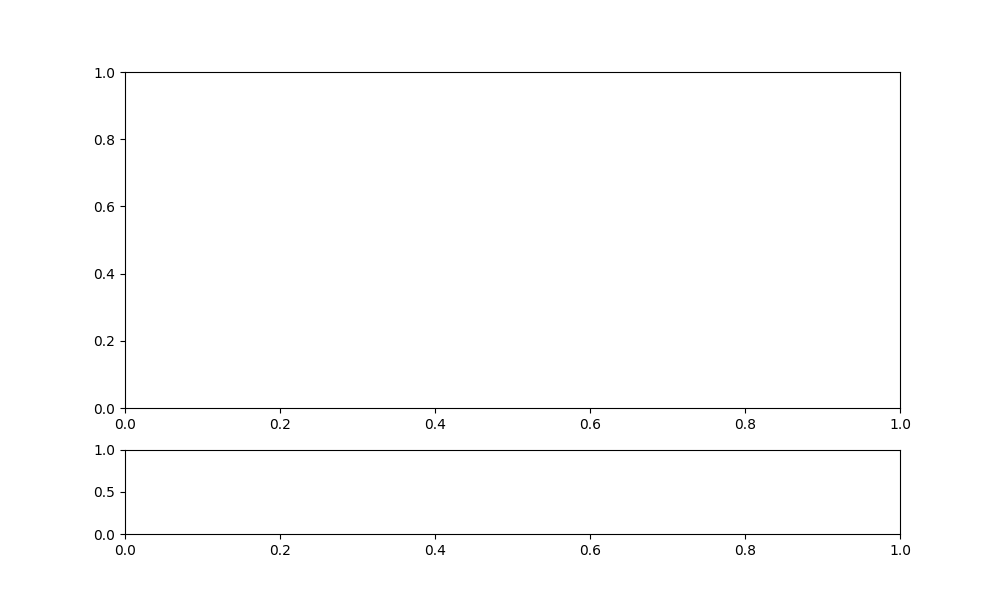

Connected successfully to MQTT Broker!


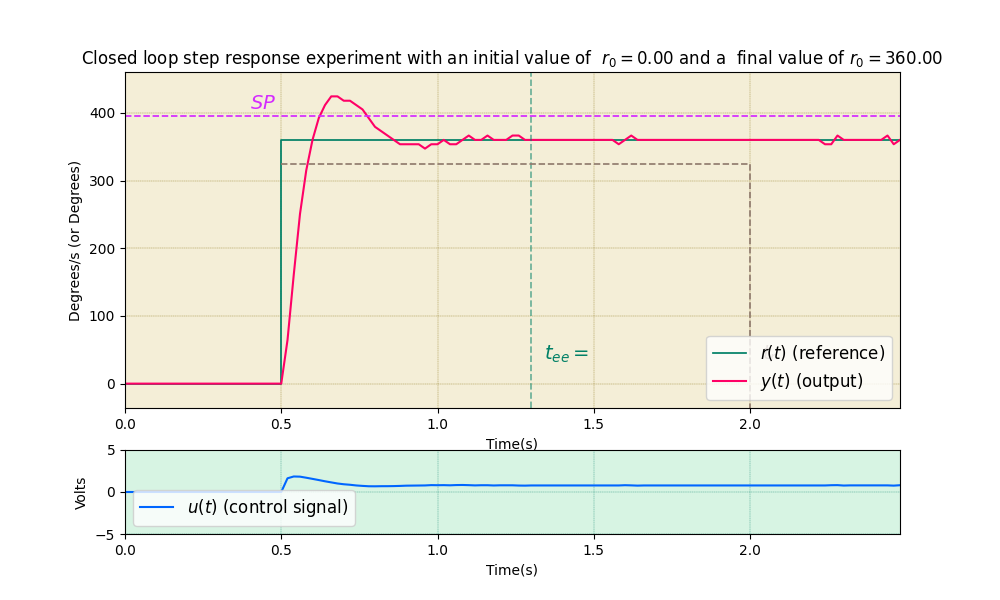

Sobre impulso:  17.857157389322918 %
Kp: 0.004530419757351495  Ki: 0.07043963564966363  wn: 12.476681800067166
Valores mayores que son SP estable: 2


In [11]:
Te = 0.02
i = 1
while contador <= 5 | i <= 8 :
    wn, zeta , kp , ki,  = reiterativoWn(wn, zeta, alpha, tau,Te)
    velwn = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velwn.kp,ki=velwn.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)

    
    plt.savefig(f"SintoniaVel_1_DelWn_{i}.png", format="png", bbox_inches="tight") # para salvar la figura

    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velwn.kp," Ki:", velwn.ki," wn:" , velwn.wn)
    resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]

    contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

    print(f"Valores mayores que son SP estable: {contador}")
    i = i+1



Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  34   (2,)


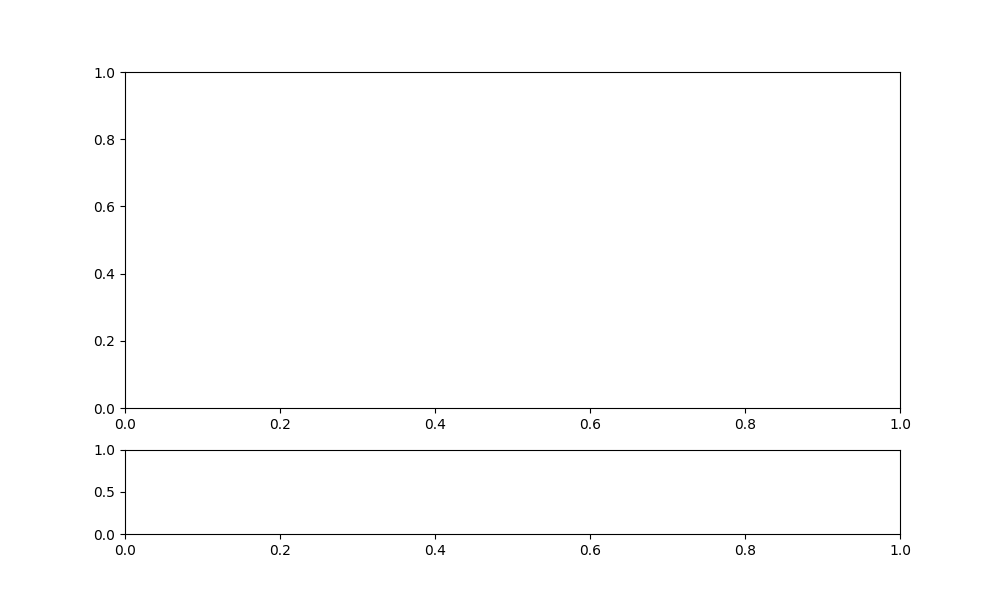

Connected successfully to MQTT Broker!


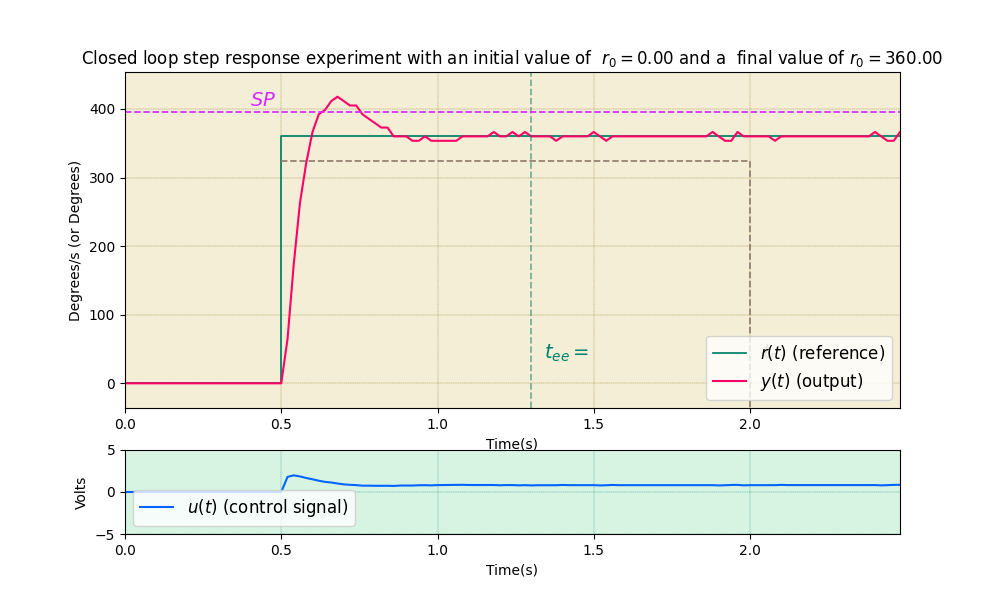

Zeta:  0.6320395304190078
Sobre impulso:  16.07143825954861 %
Kp: 0.004992063180144399  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  38   (2,)


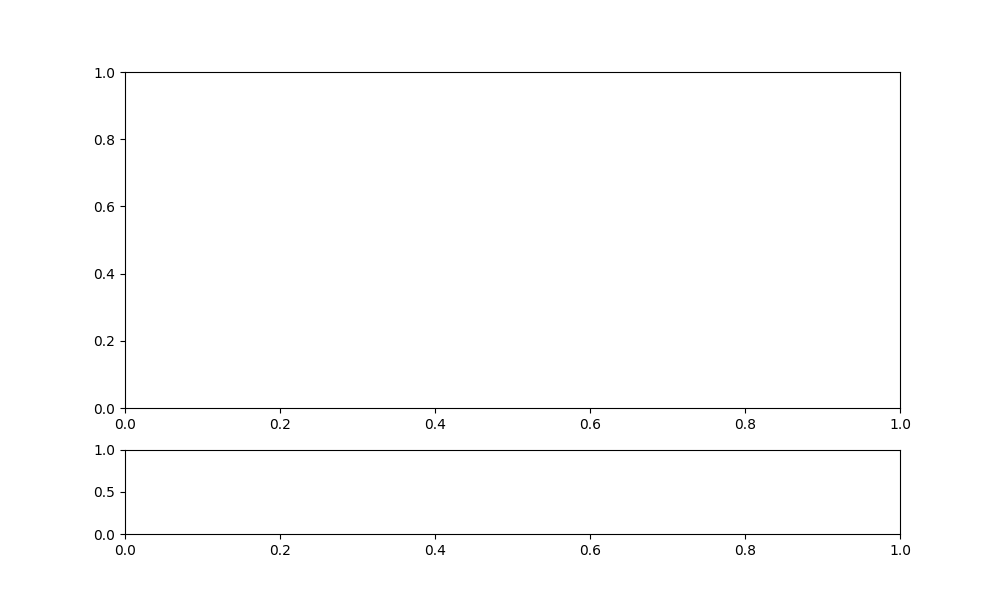

Connected successfully to MQTT Broker!


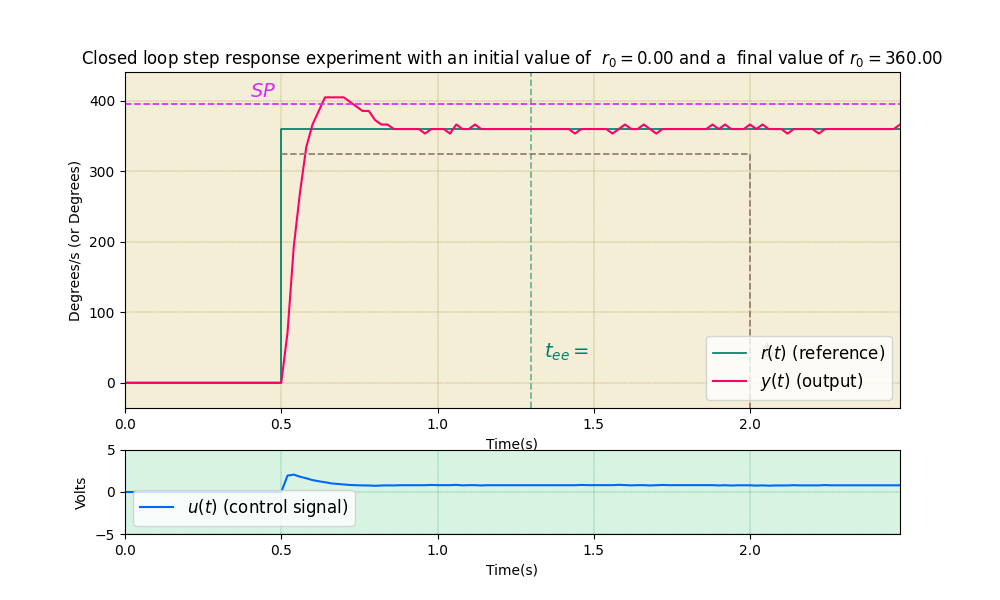

Zeta:  0.6688355773771071
Sobre impulso:  12.500008477105034 %
Kp: 0.005407542260658013  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  42   (2,)


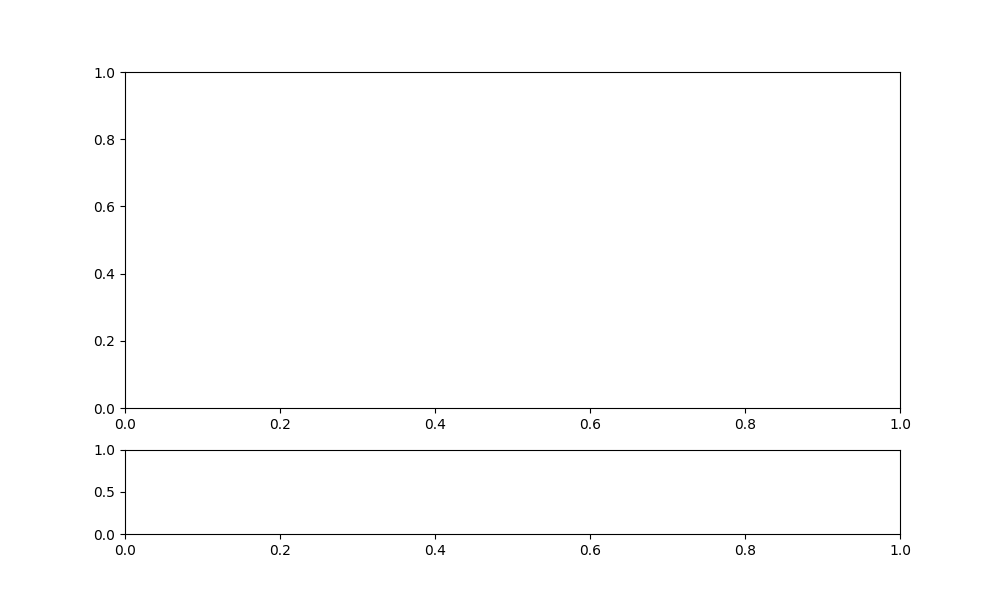

Connected successfully to MQTT Broker!


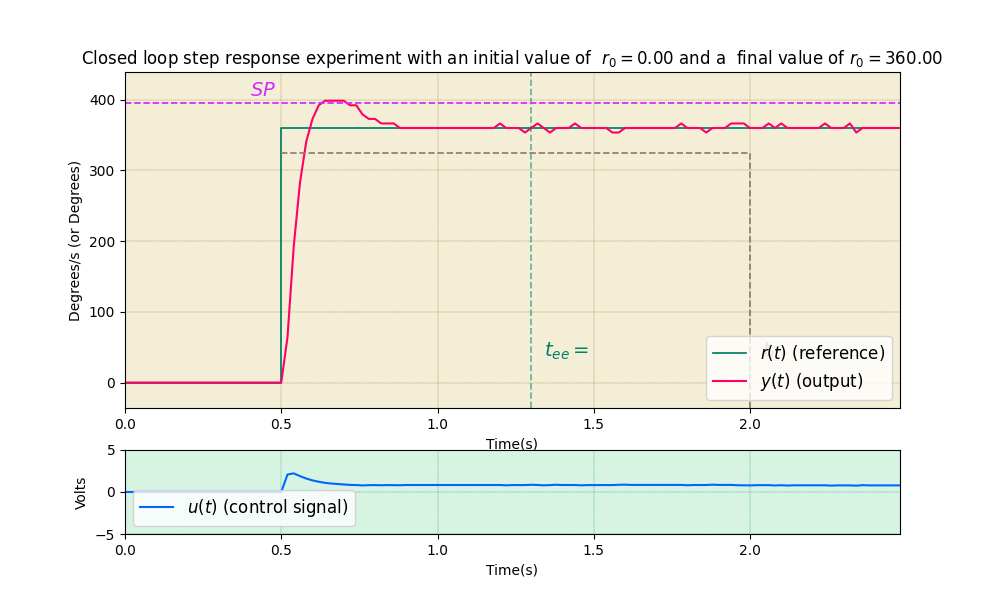

Zeta:  0.7019520196393964
Sobre impulso:  10.714289347330729 %
Kp: 0.005781473433120266  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  46   (2,)


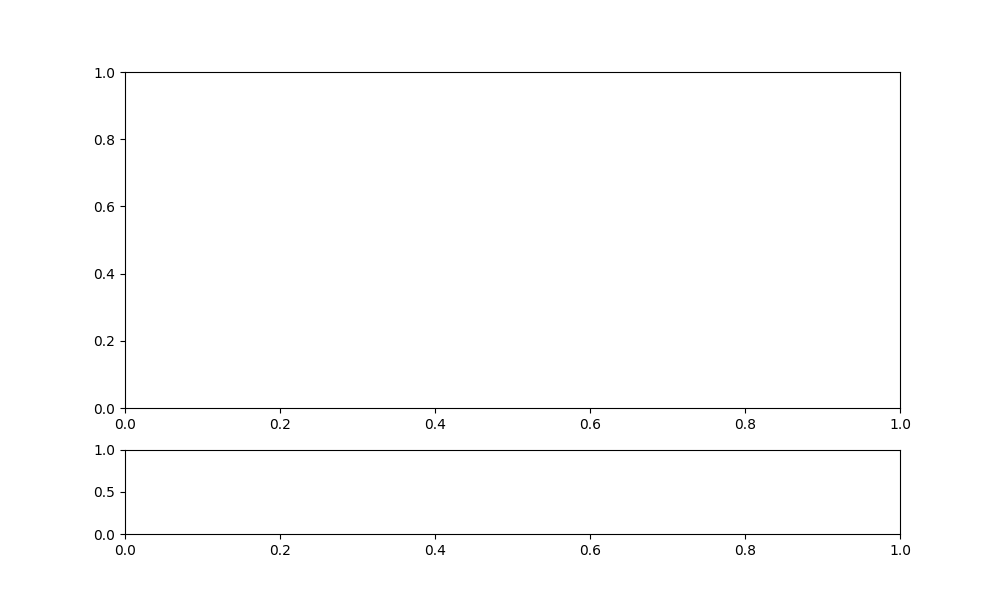

Connected successfully to MQTT Broker!


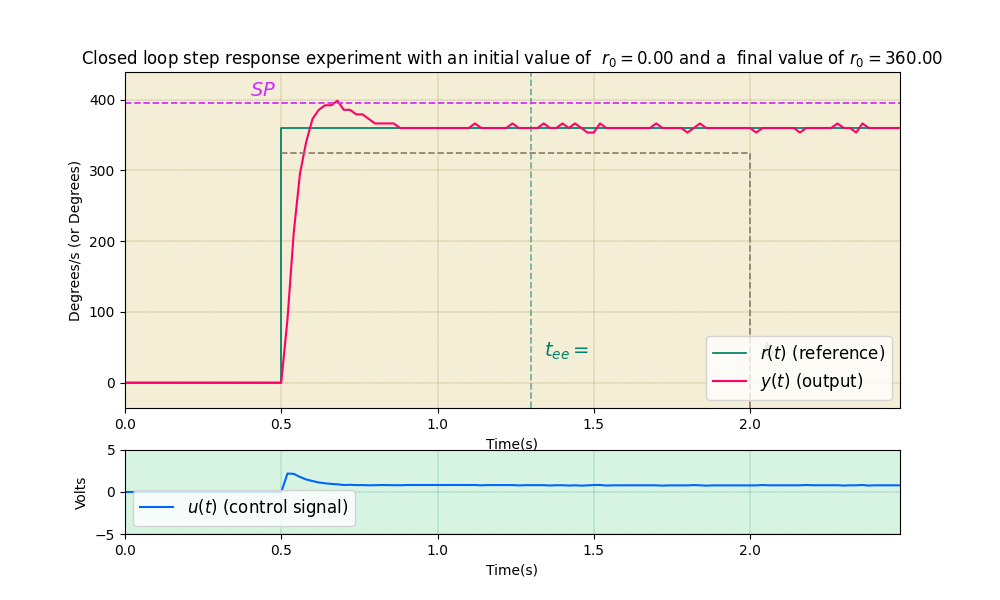

Zeta:  0.7317568176754567
Sobre impulso:  10.714289347330729 %
Kp: 0.006118011488336293  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  50   (2,)


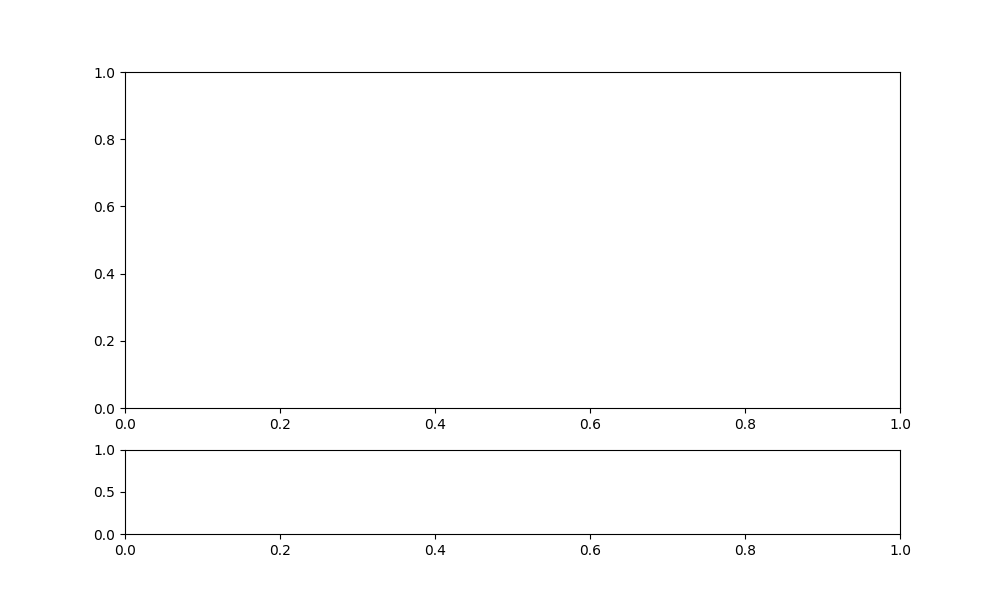

Connected successfully to MQTT Broker!


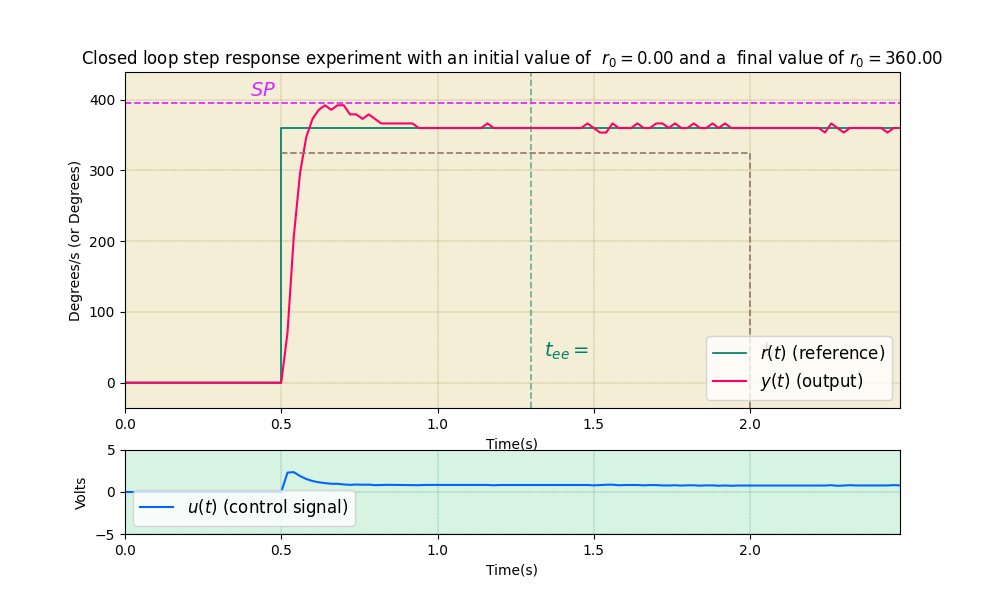

Zeta:  0.7585811359079111
Sobre impulso:  8.928578694661459 %
Kp: 0.0064208957380307175  Ki: 0.07043963564966363


In [12]:
i = 1
while SPreal > 10:
    zeta , kp , ki = retirativoZeta(wn, zeta, alpha, tau)
    velf1 = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velf1.kp,ki=velf1.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)

    plt.savefig(f"SintoniaVel_1_DelZeta_{i}.png", format="png", bbox_inches="tight") # para salvar la figura
    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Zeta: ",zeta)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velf1.kp," Ki:", velf1.ki)

    i = i+1

## CASO 2



In [45]:
###Caso Vel2
tee = 0.8
tr = 1.5
SP = 5
zeta, wn, kp, ki = Medio(SP, tee, tr, tau, alpha)
vel2 = Vel(zeta, wn, kp, ki)

### Primera pruebas sin iteracion 

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  126   (2,)


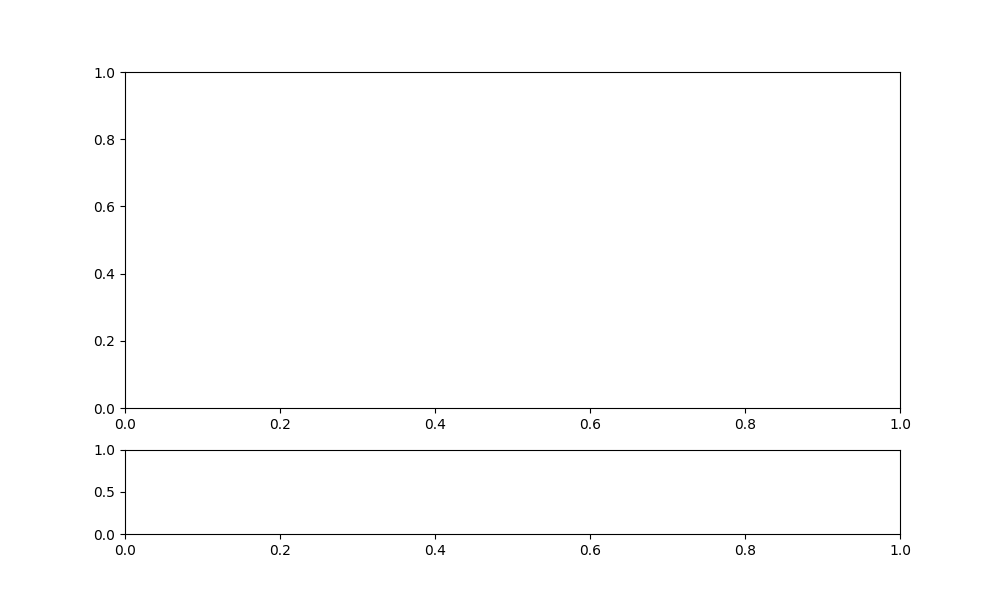

Connected successfully to MQTT Broker!


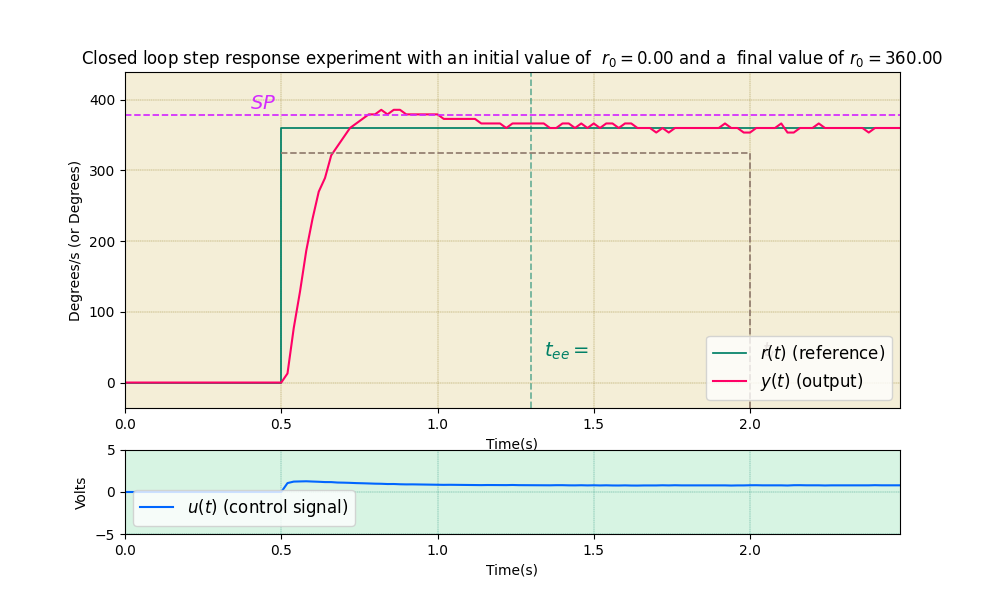

7.142868041992187
0.6901067305598217


In [46]:
motor.set_pid(mi_motor,kp=vel2.kp,ki=vel2.ki,kd=0,beta=1, output="speed")
t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
motor.set_reference(mi_motor,0)
draw_specifications(tee, tr, SP)
plt.savefig("SintoniaAlgbraica_vel_2.png", format="png", bbox_inches="tight") # para salvar la figura
plt.show() # para congelarla en el notebook

SPreal = ((max(y)-r1)/(r1-r0)*100)
print(SPreal)
print(zeta)

In [47]:
resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]
print(resultado)

contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.01))

print(f"Valores mayores que 10: {contador}")



[-100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -96.42857127719455, -78.57142766316731, -64.28571065266927, -48.21428087022569, -35.71428510877821, -25.0, -19.642851087782116, -10.714280870225695, -7.142851087782118, -3.5714213053385415, 8.477105034722223e-06, 1.7857191297743054, 3.5714382595486107, 5.357148912217882, 5.357148912217882, 7.142868041992187, 5.357148912217882, 7.142868041992187, 7.142868041992187, 5.357148912217882, 5.357148912217882, 5.357148912217882, 5.357148912217882, 5.357148912217882, 5.357148912217882, 3.5714382595486107, 3.5714382595486107, 3.5714382595486107, 3.5714382595486107, 3.5714382595486107, 3.5714382595486107, 1.7857191297743054, 1.7857191297743054, 1.7857191297743054, 1.7857191297743054, 8.477105034722223e-06, 1.7857191297743054, 1.7857191297743054, 1.7857191297743054, 1.7857191297743054, 1.78571

### Pruebas con iteracion

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  130   (2,)


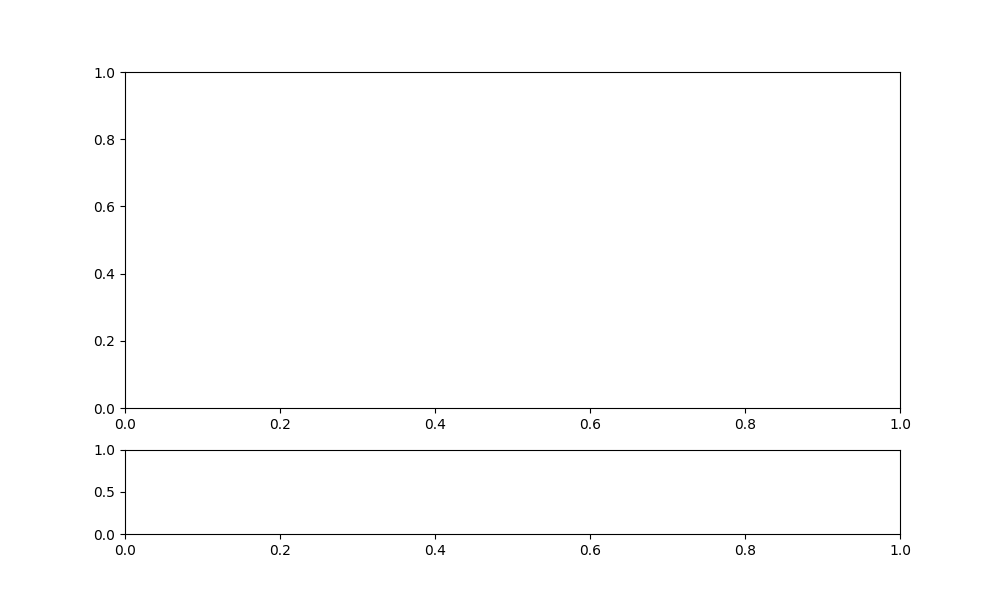

Connected successfully to MQTT Broker!


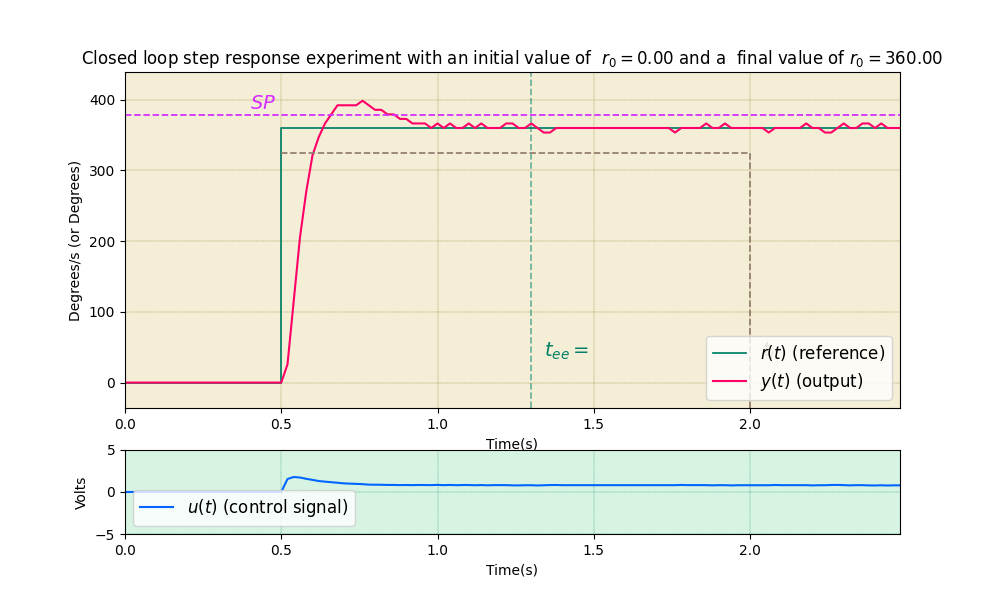

Sobre impulso:  10.714289347330729 %
Kp: 0.0043041820935357435  Ki: 0.04824334697070744  wn: 10.325456556869792
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  134   (2,)


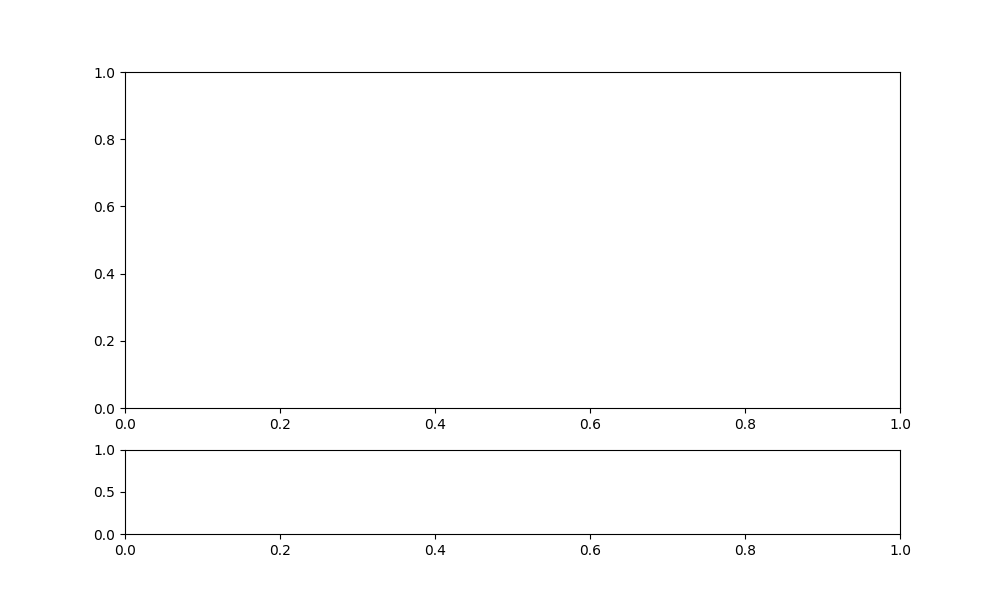

Connected successfully to MQTT Broker!


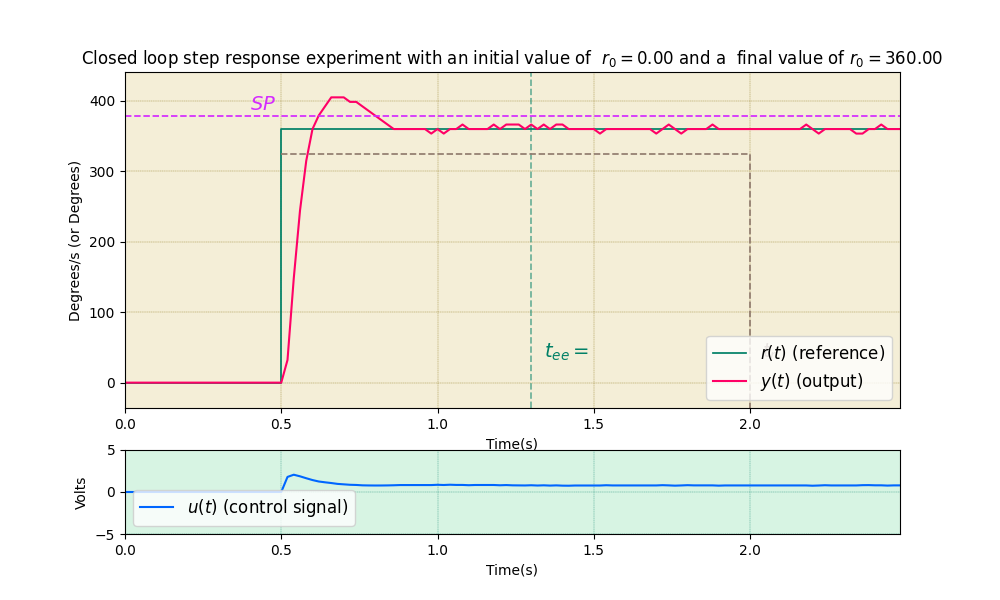

Sobre impulso:  12.500008477105034 %
Kp: 0.004983234439730161  Ki: 0.05893833425365061  wn: 11.412728278434896
Valores mayores que son SP estable: 3
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  138   (2,)


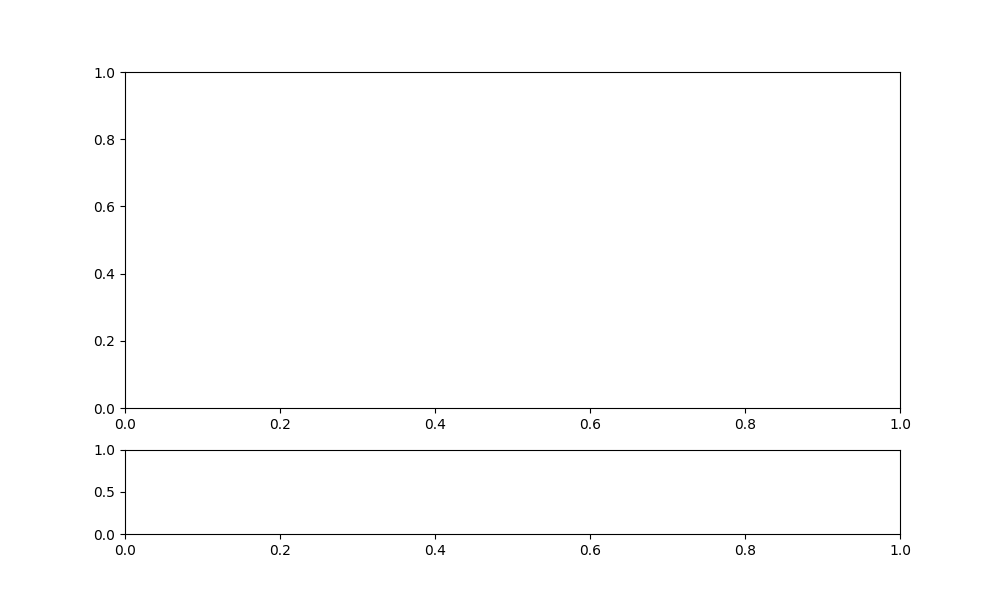

Connected successfully to MQTT Broker!


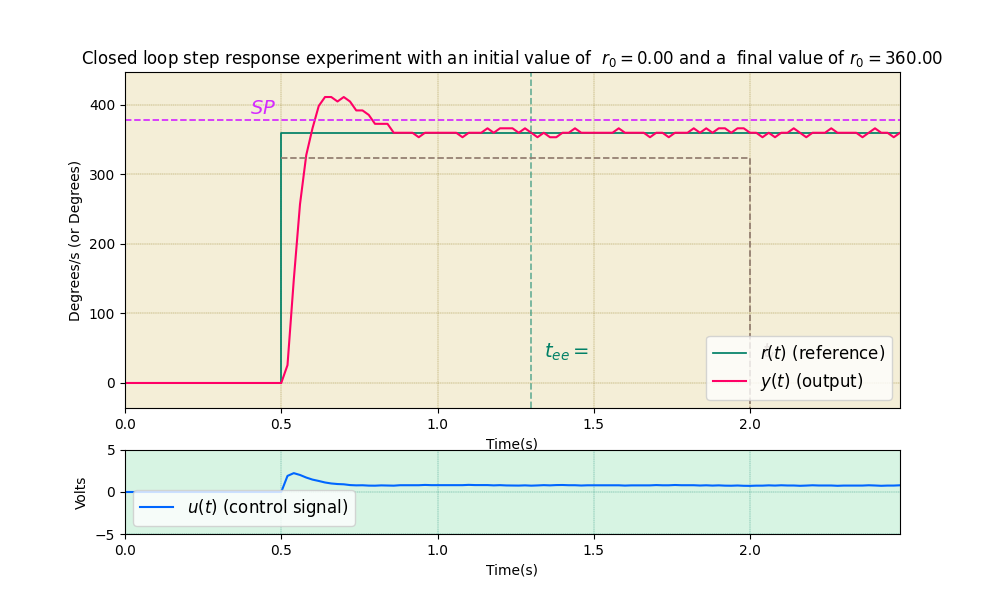

Sobre impulso:  14.285719129774305 %
Kp: 0.005322760612827371  Ki: 0.06468702367078182  wn: 11.956364139217449
Valores mayores que son SP estable: 3
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  142   (2,)


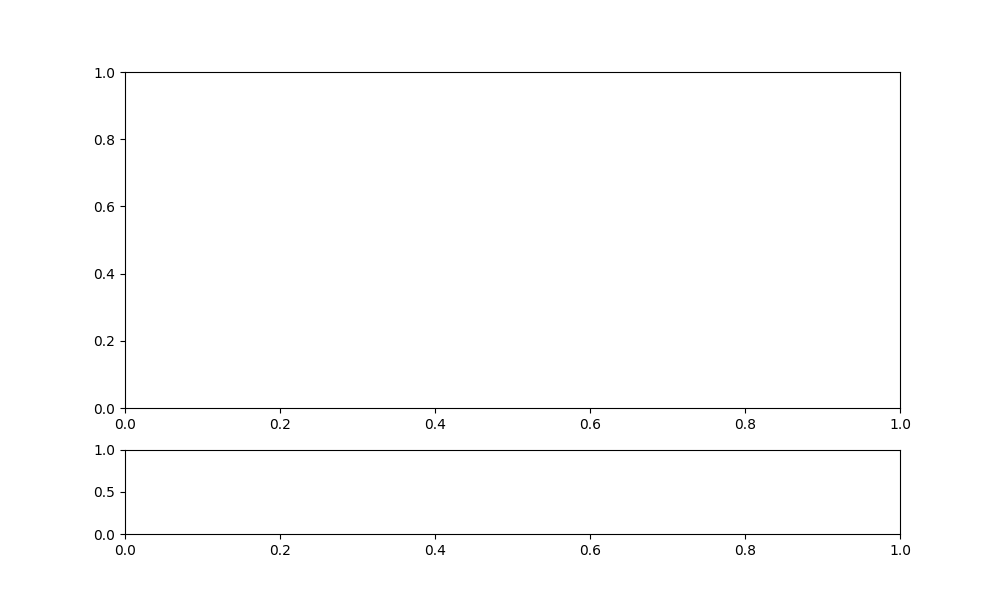

Connected successfully to MQTT Broker!


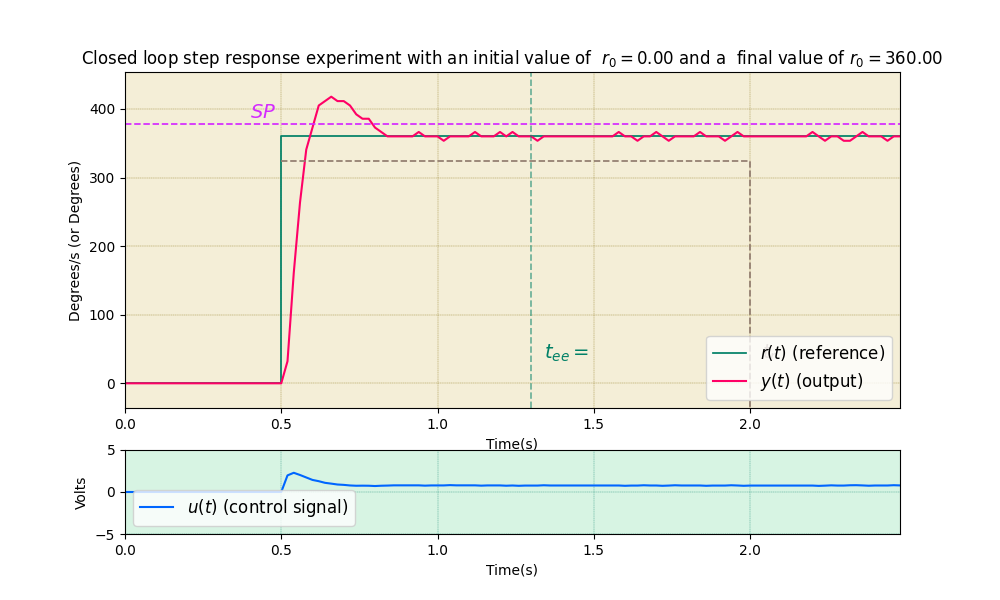

Sobre impulso:  16.07143825954861 %
Kp: 0.005492523699375975  Ki: 0.06766166732326231  wn: 12.228182069608724
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  146   (2,)


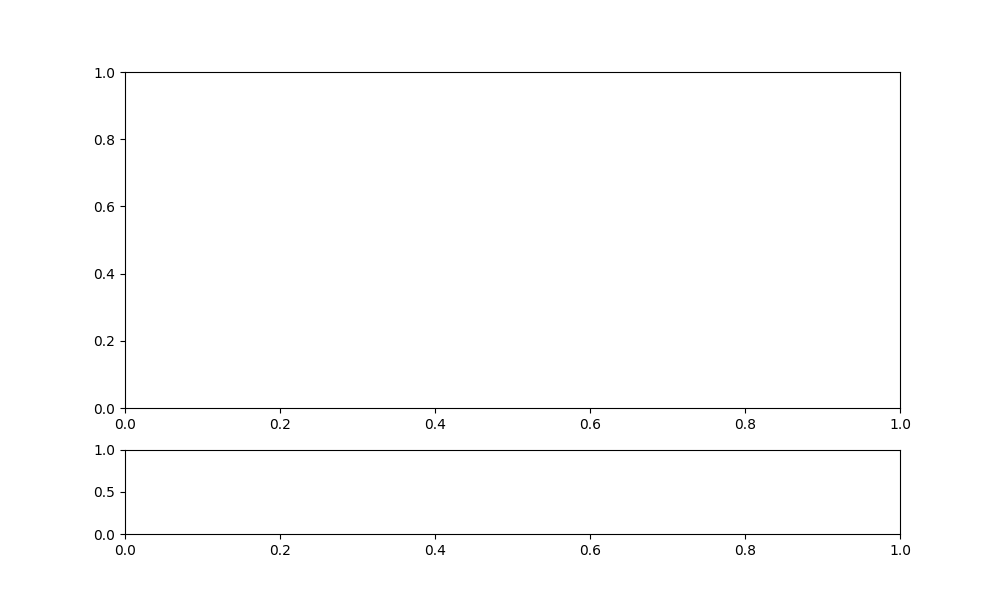

Connected successfully to MQTT Broker!


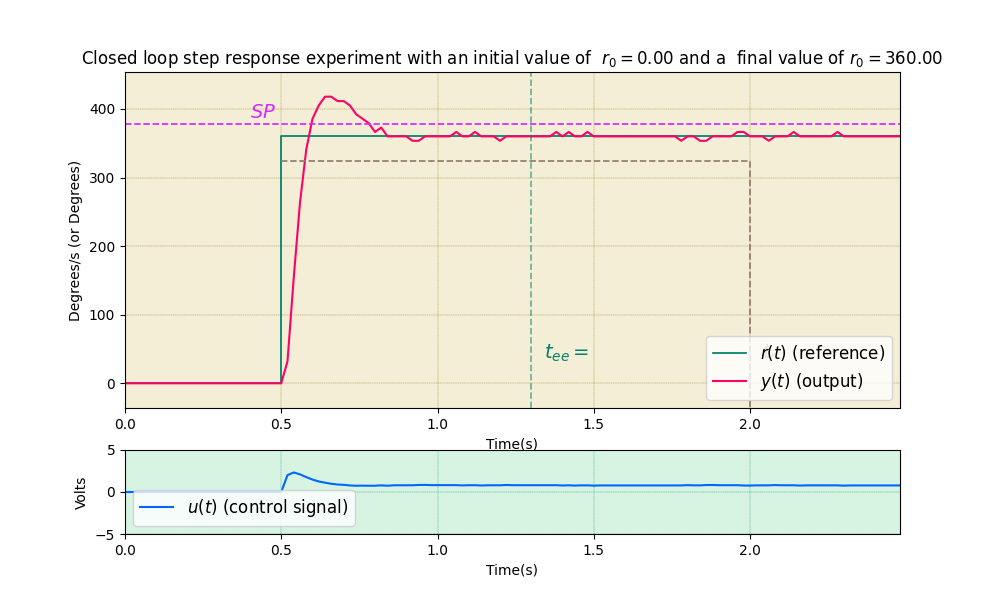

Sobre impulso:  16.07143825954861 %
Kp: 0.005577405242650276  Ki: 0.06917406388548127  wn: 12.364091034804362
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  150   (2,)


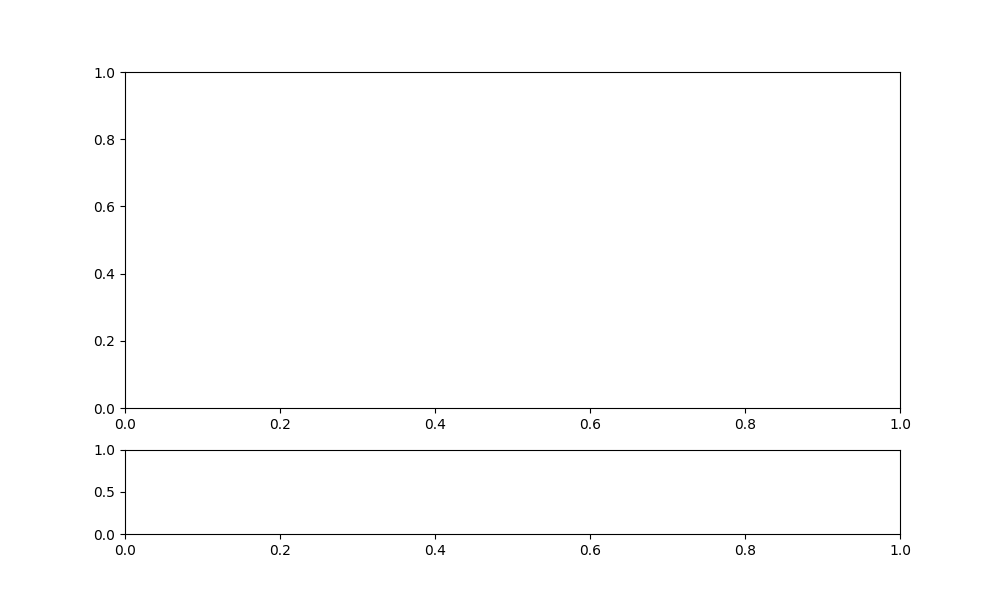

Connected successfully to MQTT Broker!


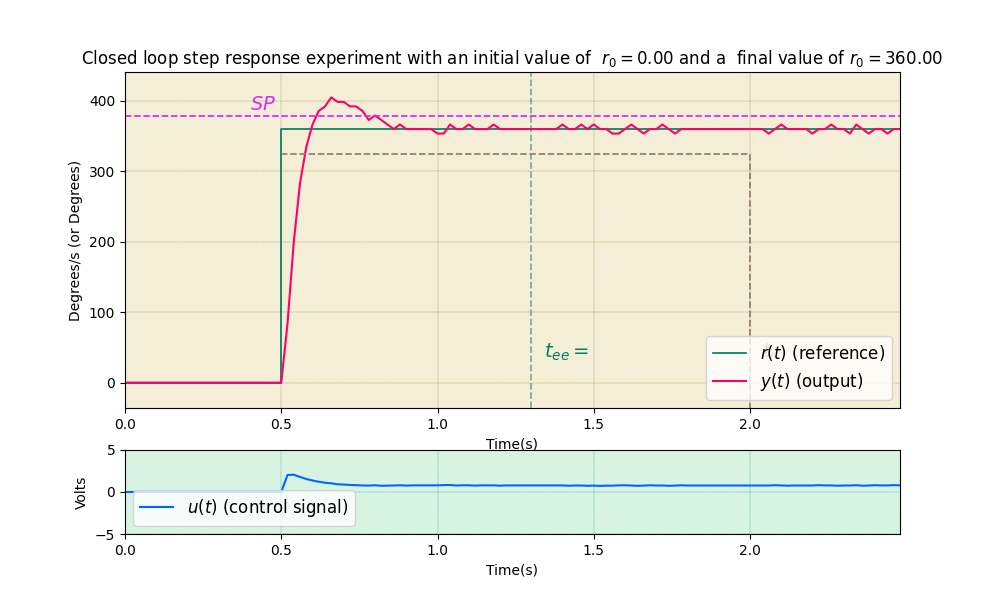

Sobre impulso:  12.500008477105034 %
Kp: 0.0056198460142874275  Ki: 0.06993653085058542  wn: 12.43204551740218
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  154   (2,)


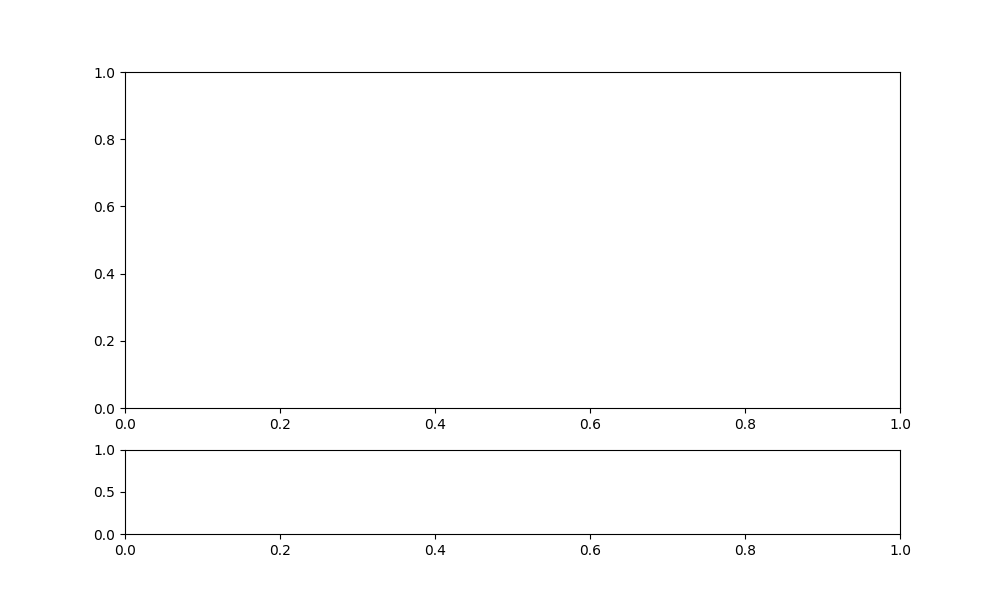

Connected successfully to MQTT Broker!


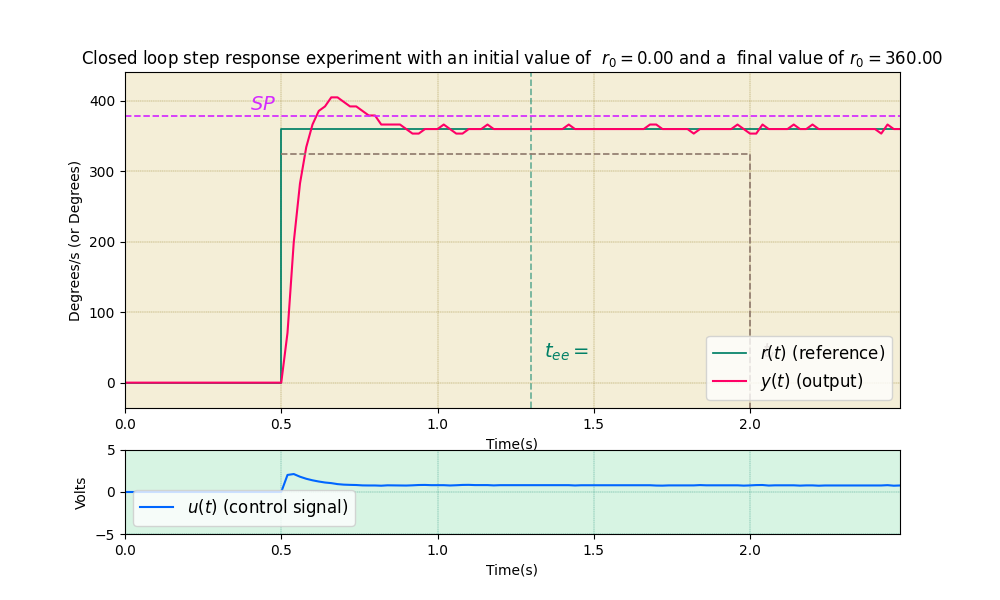

Sobre impulso:  12.500008477105034 %
Kp: 0.005641066400106003  Ki: 0.07031933150413619  wn: 12.46602275870109
Valores mayores que son SP estable: 2


In [48]:
Te = 0.02
i = 1
while contador <= 5 | i <= 8 :
    wn, zeta , kp , ki,  = reiterativoWn(wn, zeta, alpha, tau,Te)
    velwn = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velwn.kp,ki=velwn.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)

    plt.savefig(f"SintoniaVel_2_DelWn_{i}.png", format="png", bbox_inches="tight") # para salvar la figura

    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velwn.kp," Ki:", velwn.ki," wn:" , velwn.wn)
    resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]

    contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

    print(f"Valores mayores que son SP estable: {contador}")
    i = i+1



Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  158   (2,)


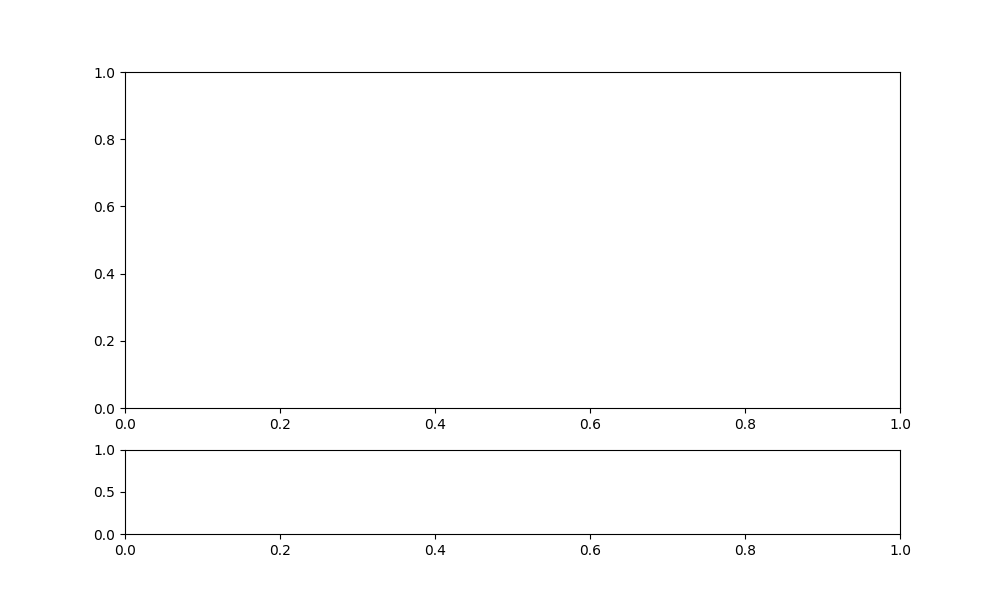

Connected successfully to MQTT Broker!


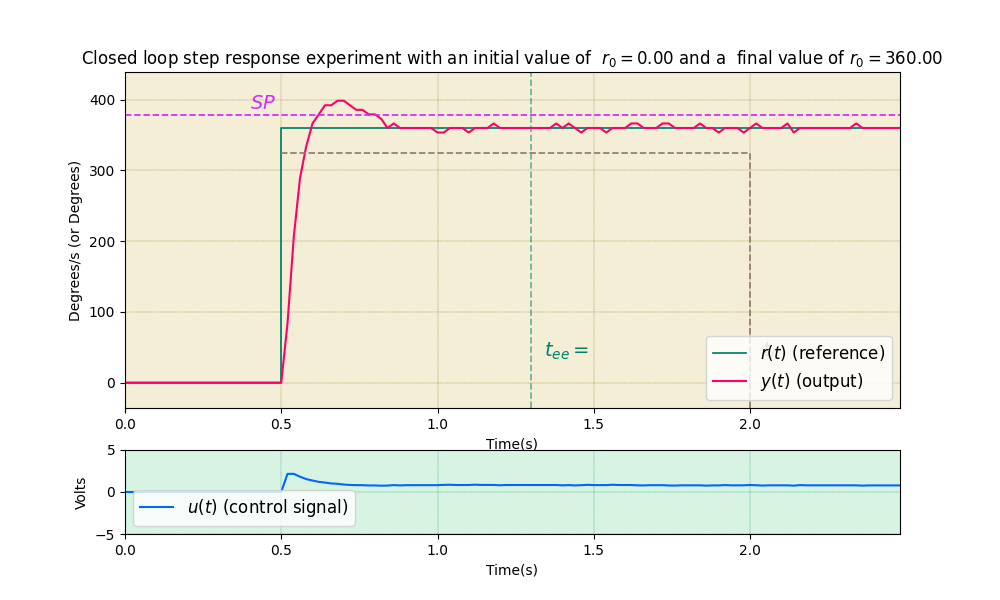

Zeta:  0.7210960575038395
Sobre impulso:  10.714289347330729 %
Kp: 0.005990680514671202  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  162   (2,)


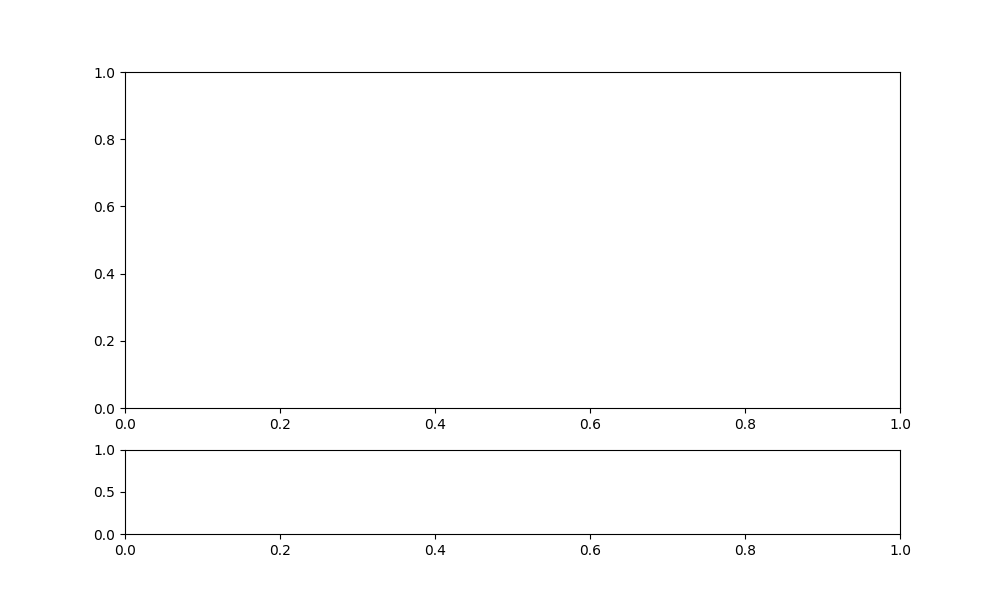

Connected successfully to MQTT Broker!


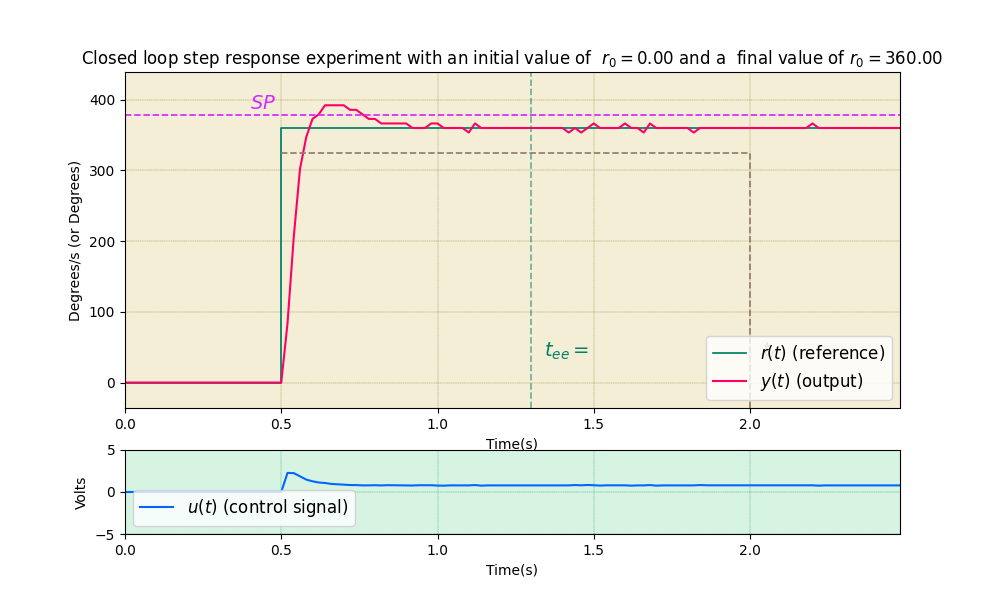

Zeta:  0.7489864517534556
Sobre impulso:  8.928578694661459 %
Kp: 0.006305333217779881  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  166   (2,)


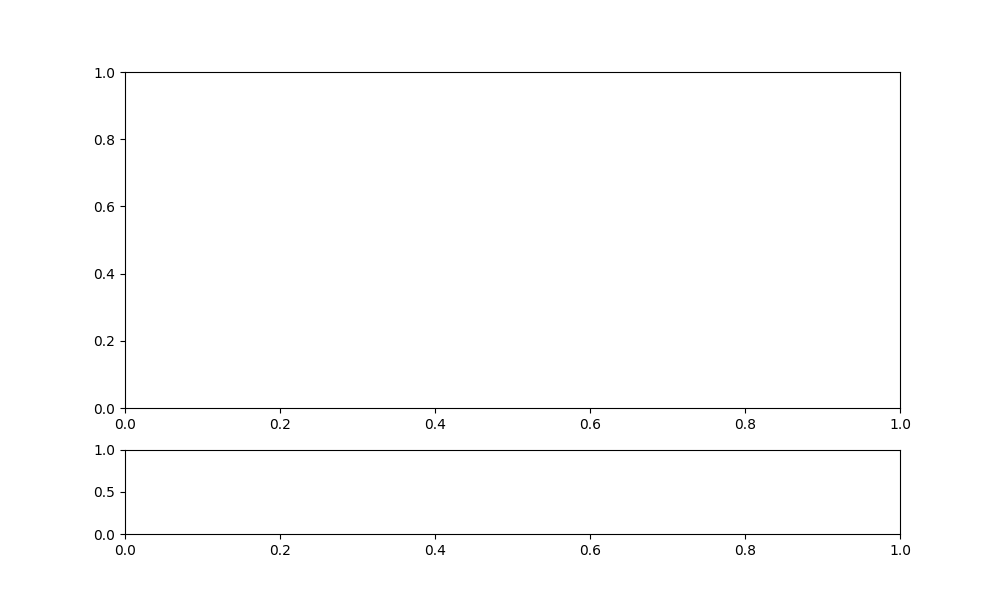

Connected successfully to MQTT Broker!


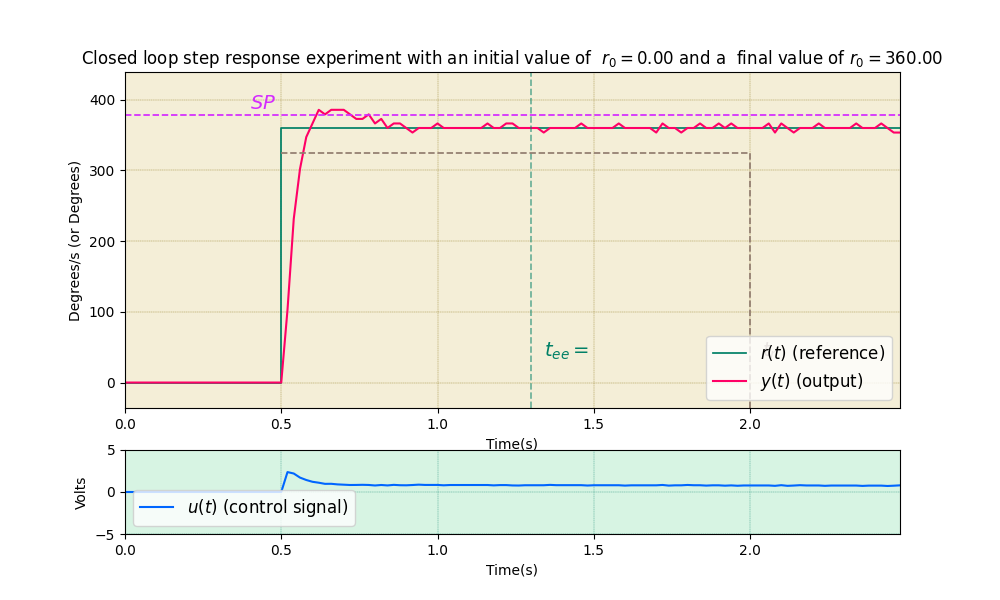

Zeta:  0.77408780657811
Sobre impulso:  7.142868041992187 %
Kp: 0.006588520650577692  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  170   (2,)


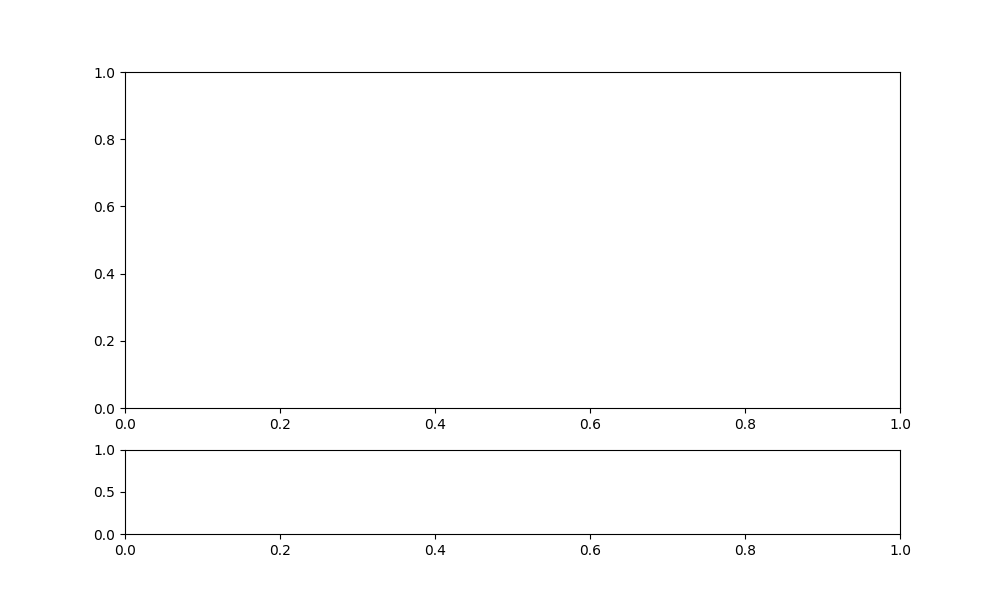

Connected successfully to MQTT Broker!


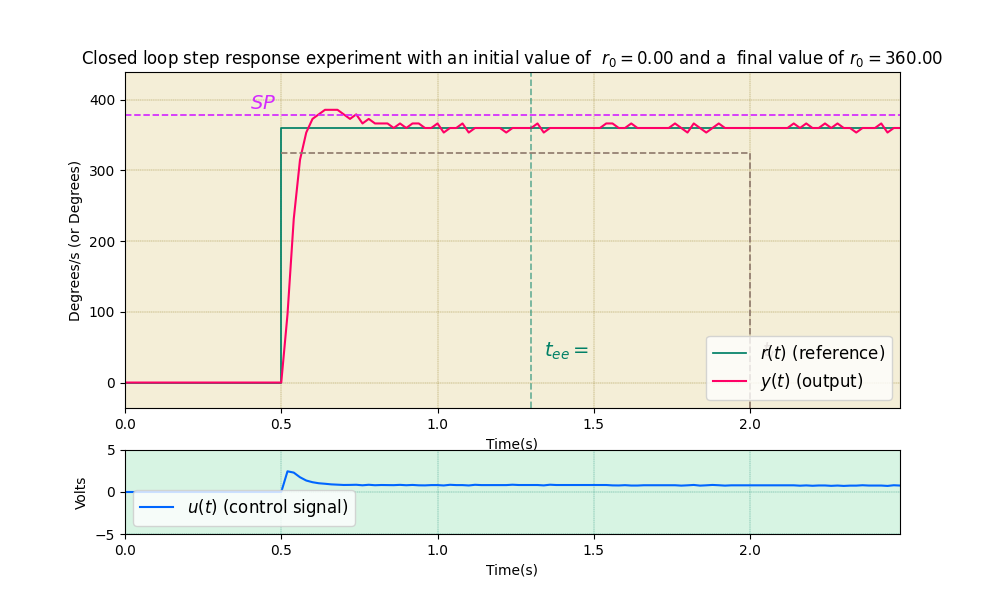

Zeta:  0.796679025920299
Sobre impulso:  7.142868041992187 %
Kp: 0.0068433893400957225  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  174   (2,)


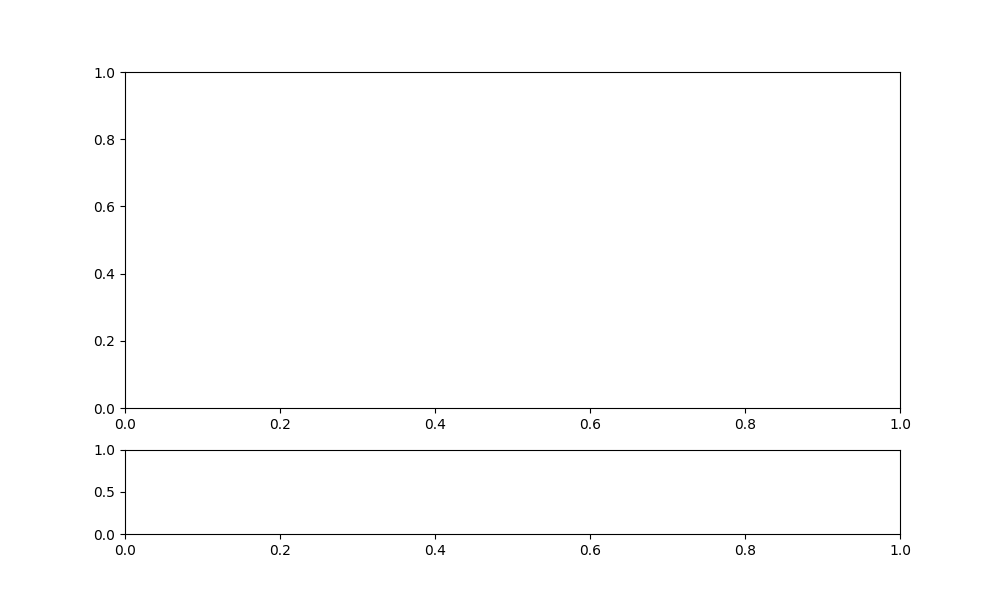

Connected successfully to MQTT Broker!


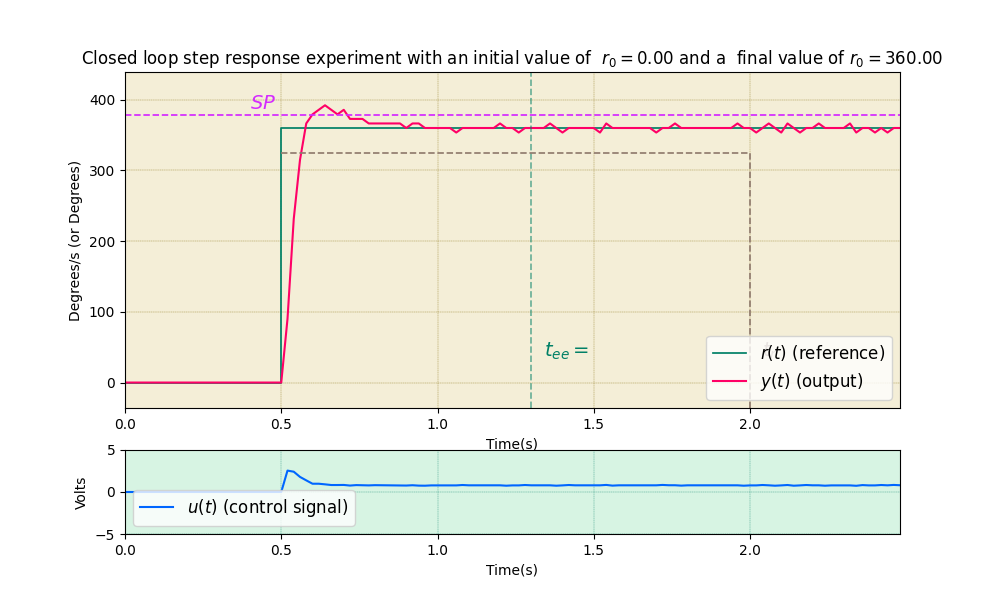

Zeta:  0.8170111233282691
Sobre impulso:  8.928578694661459 %
Kp: 0.007072771160661948  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  178   (2,)


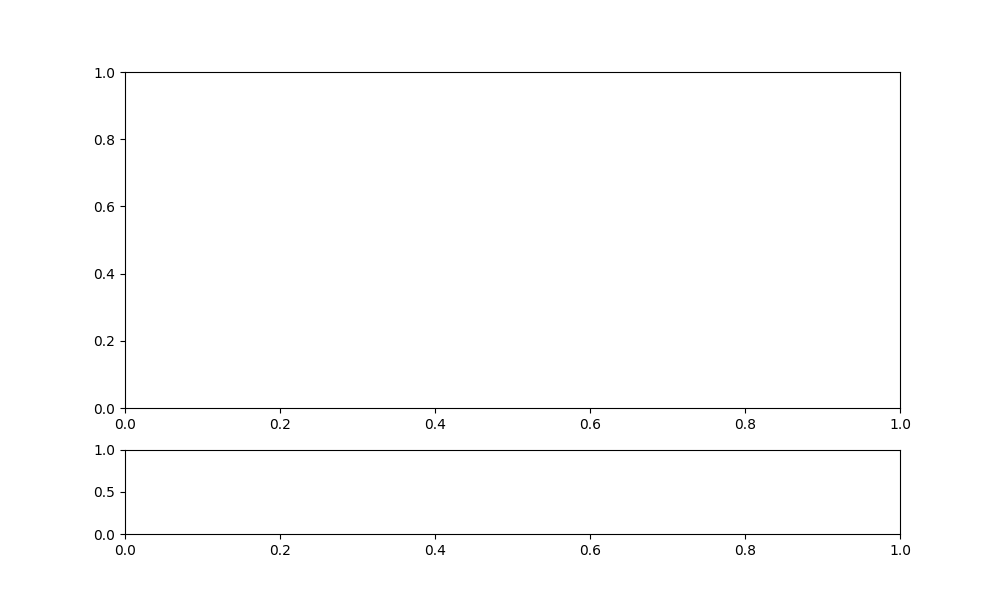

Connected successfully to MQTT Broker!


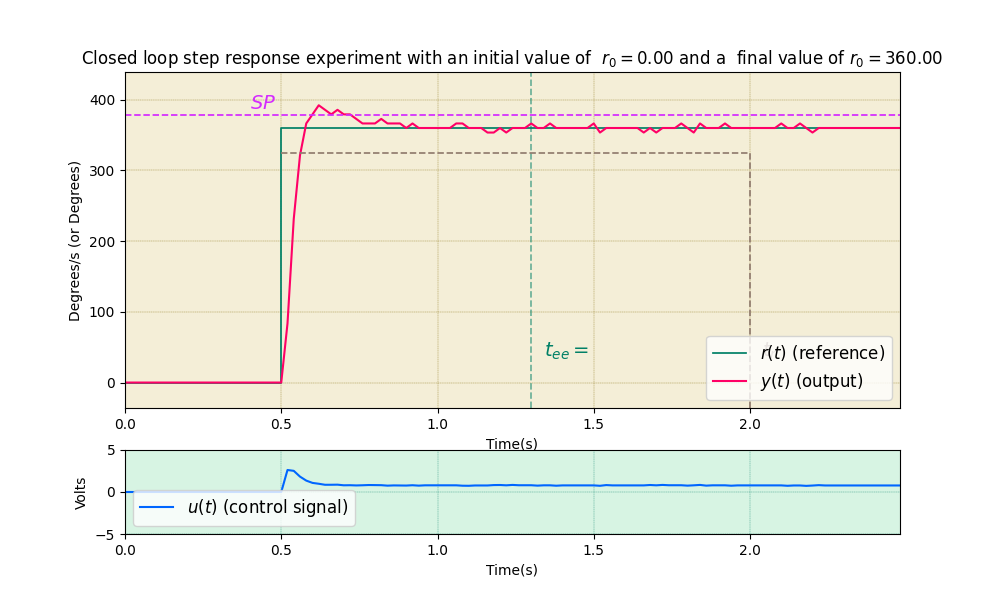

Zeta:  0.8353100109954422
Sobre impulso:  8.928578694661459 %
Kp: 0.007279214799171554  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  182   (2,)


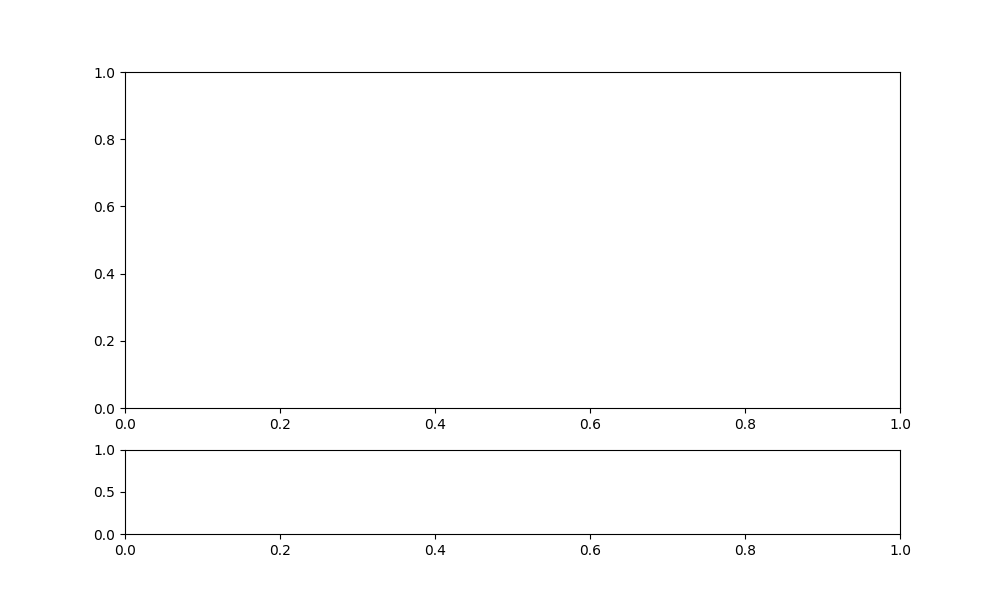

Connected successfully to MQTT Broker!


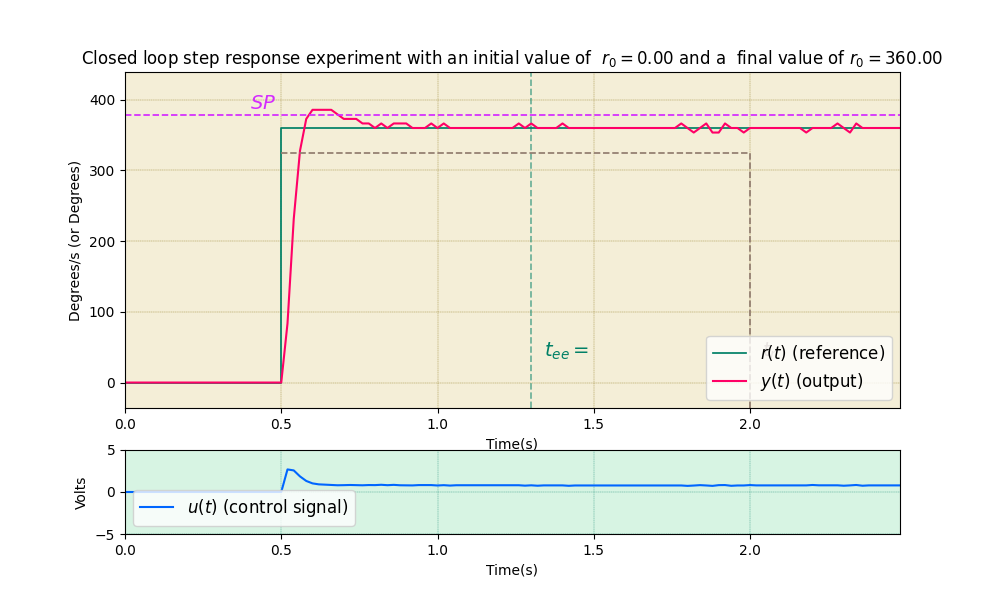

Zeta:  0.8517790098958979
Sobre impulso:  7.142868041992187 %
Kp: 0.007465014073830196  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  186   (2,)


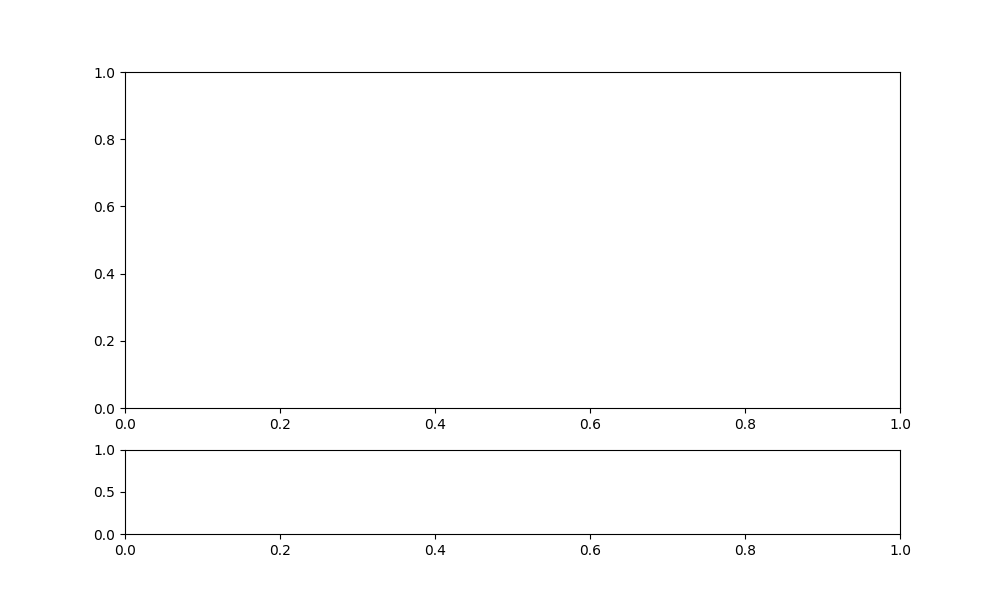

Connected successfully to MQTT Broker!


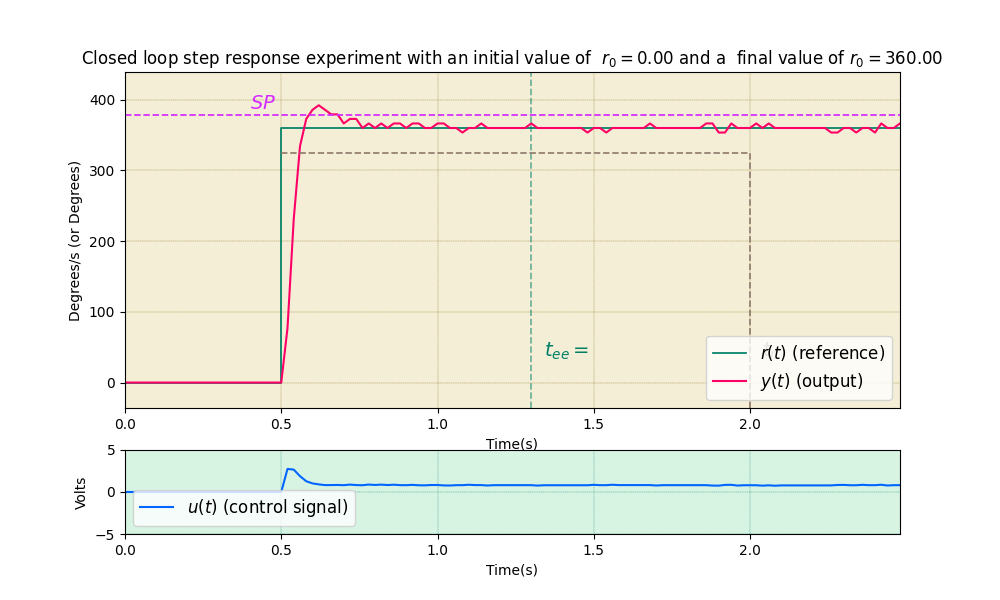

Zeta:  0.8666011089063081
Sobre impulso:  8.928578694661459 %
Kp: 0.007632233421022976  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  190   (2,)


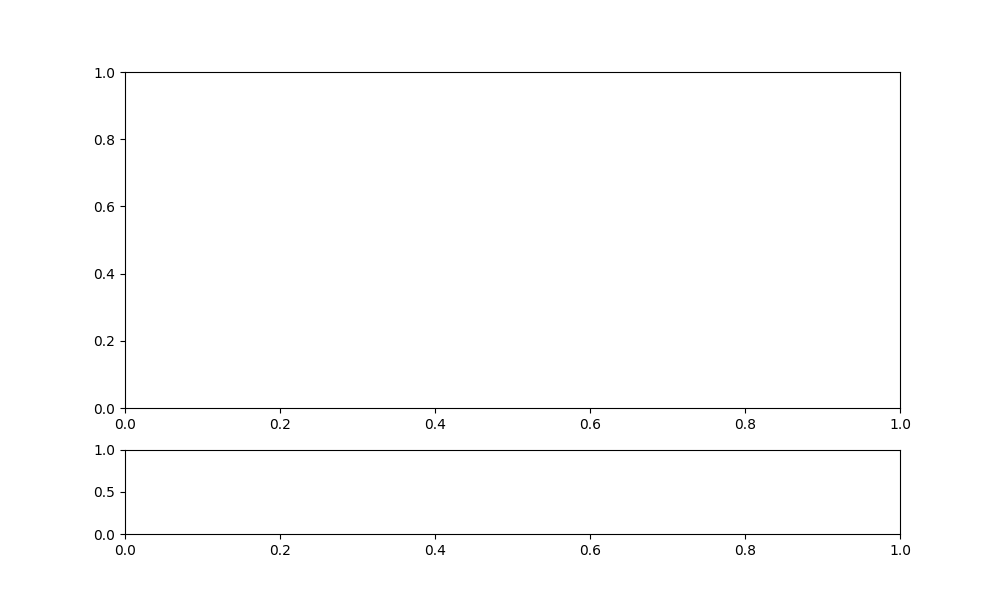

Connected successfully to MQTT Broker!


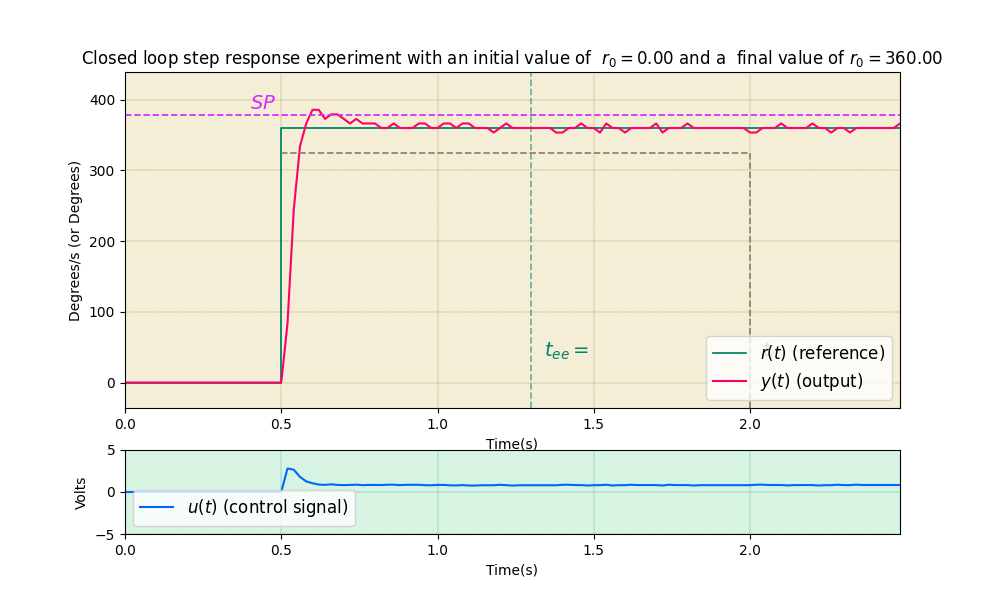

Zeta:  0.8799409980156774
Sobre impulso:  7.142868041992187 %
Kp: 0.007782730833496478  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  194   (2,)


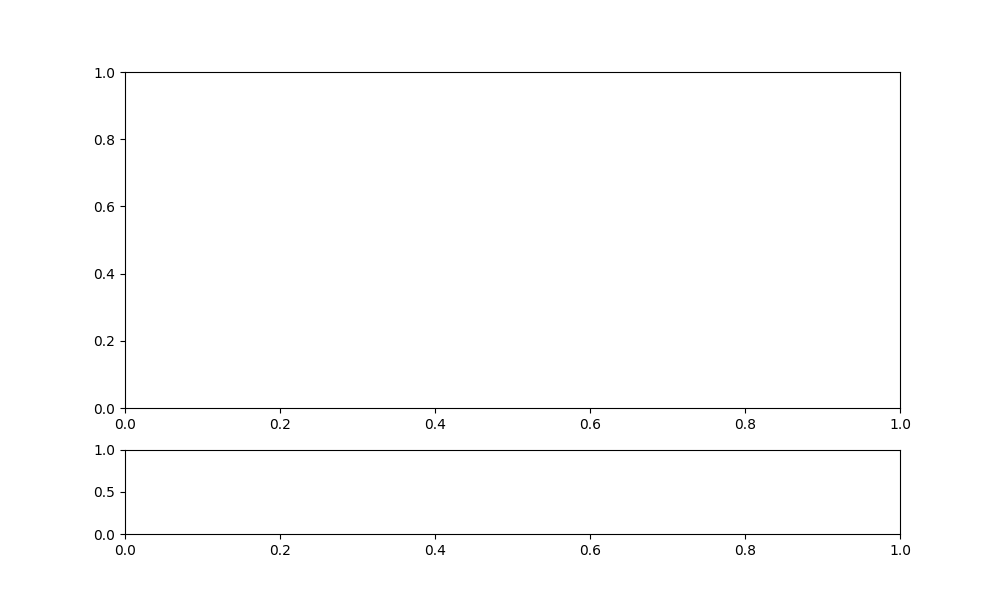

Connected successfully to MQTT Broker!


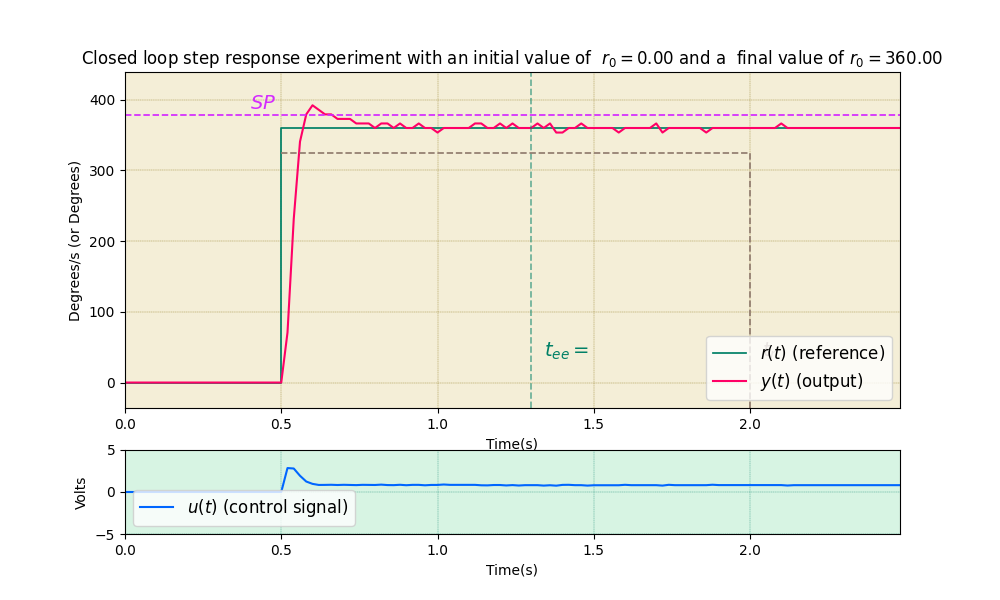

Zeta:  0.8919468982141097
Sobre impulso:  8.928578694661459 %
Kp: 0.00791817850472263  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  198   (2,)


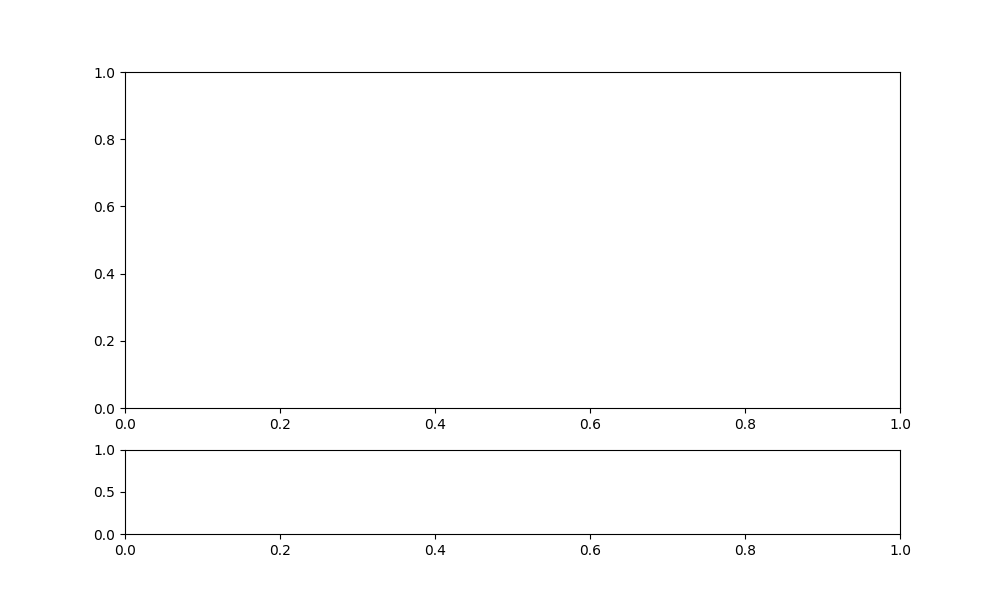

Connected successfully to MQTT Broker!


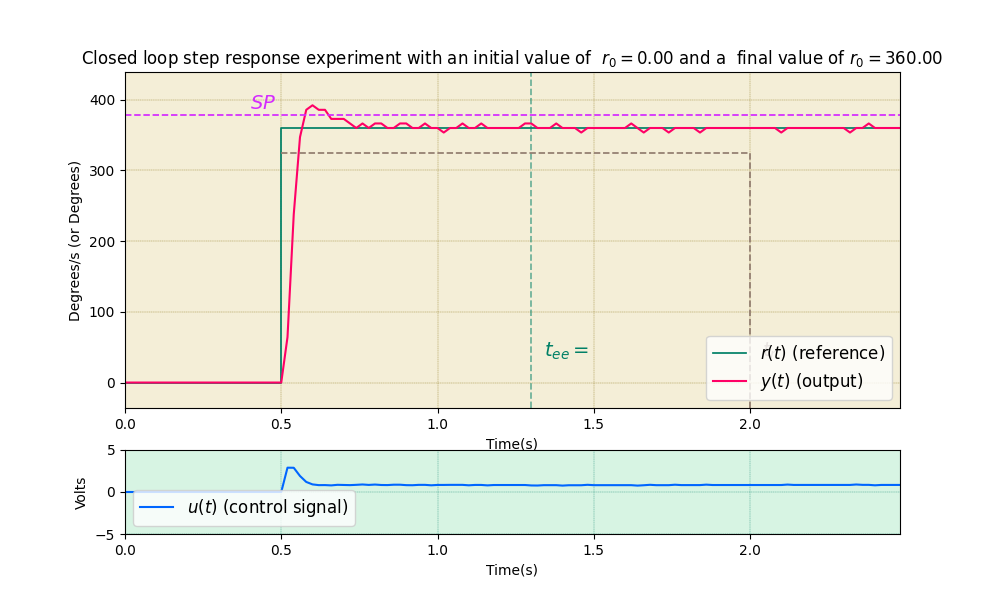

Zeta:  0.9027522083926987
Sobre impulso:  8.928578694661459 %
Kp: 0.008040081408826167  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  202   (2,)


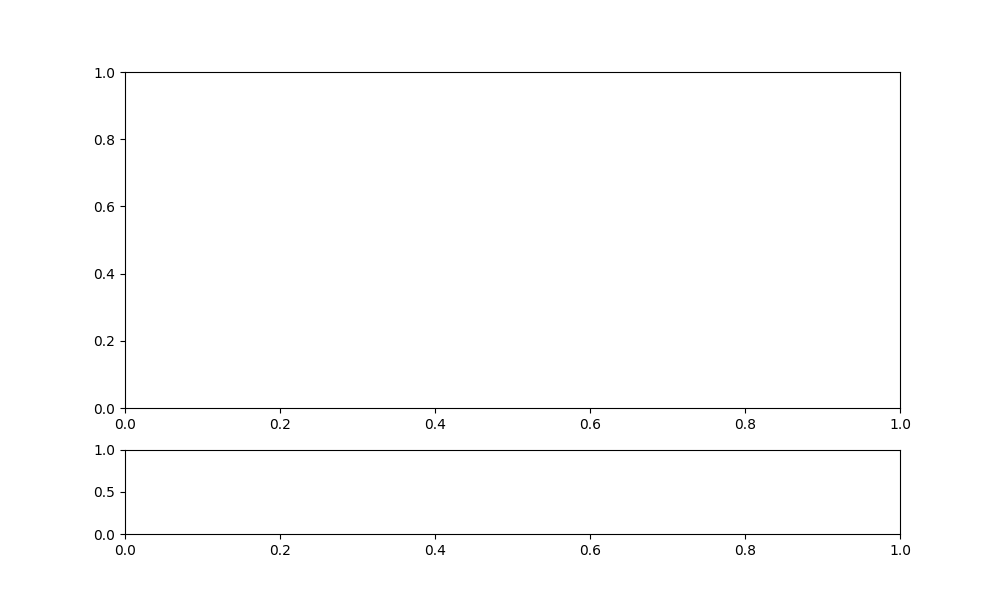

Connected successfully to MQTT Broker!


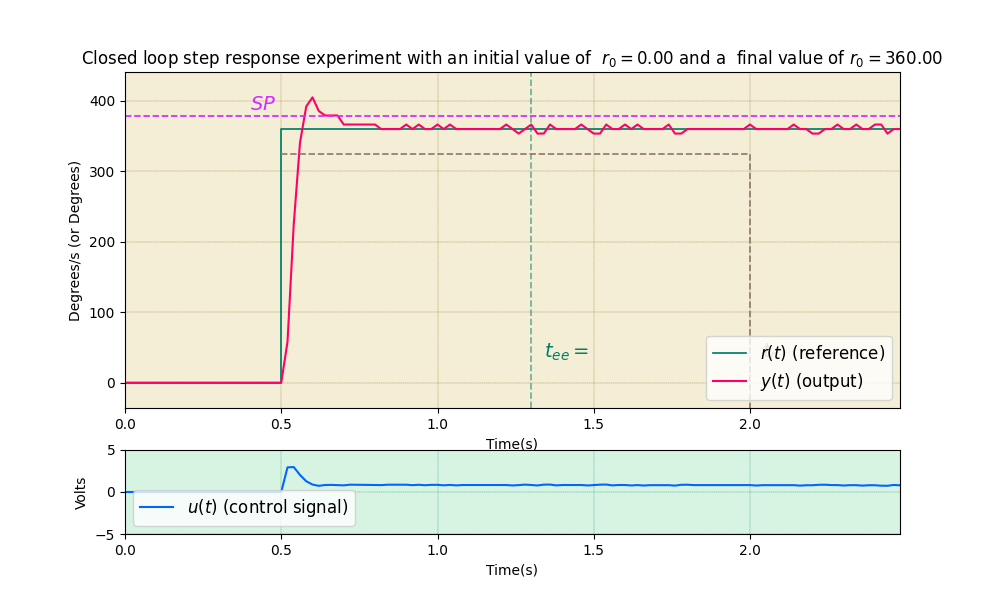

Zeta:  0.9124769875534288
Sobre impulso:  12.500008477105034 %
Kp: 0.008149794022519348  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  206   (2,)


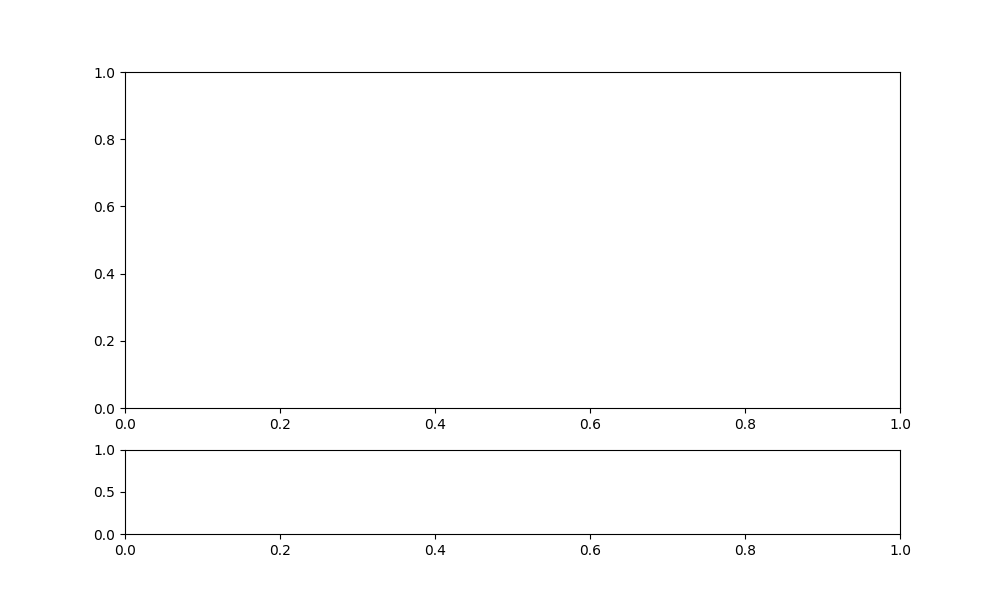

Connected successfully to MQTT Broker!


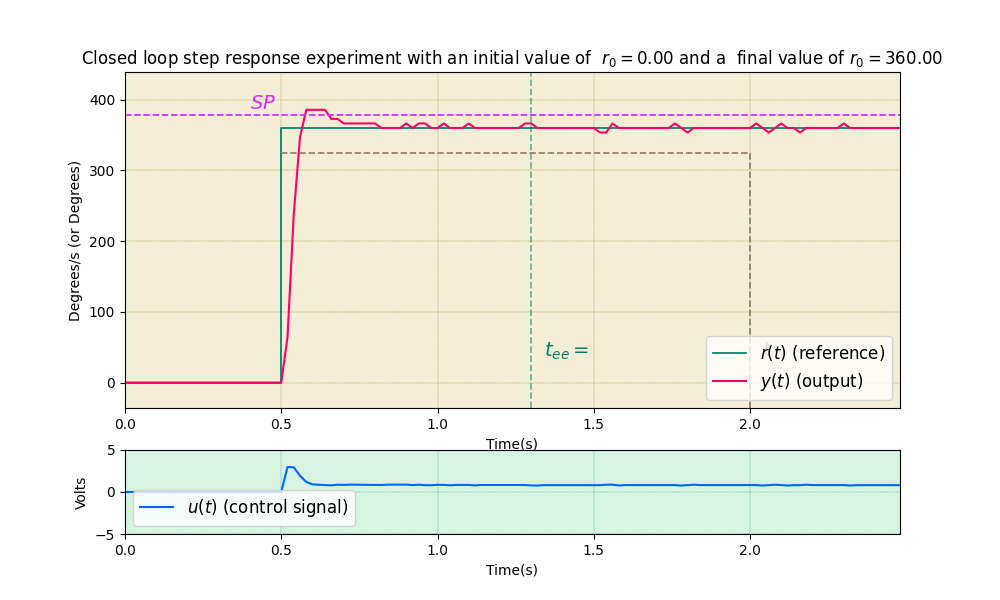

Zeta:  0.9212292887980859
Sobre impulso:  7.142868041992187 %
Kp: 0.008248535374843212  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  210   (2,)


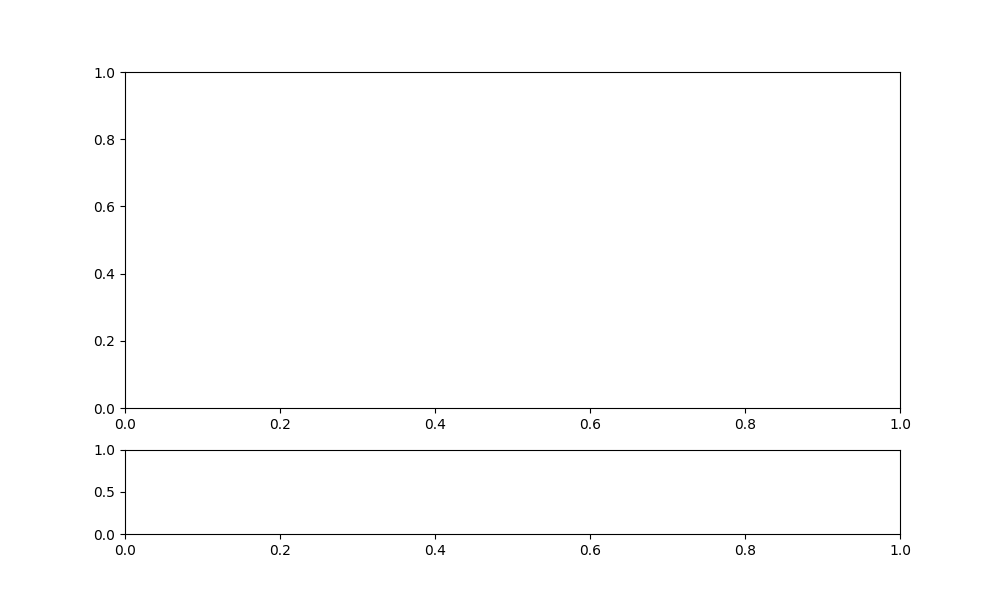

Connected successfully to MQTT Broker!


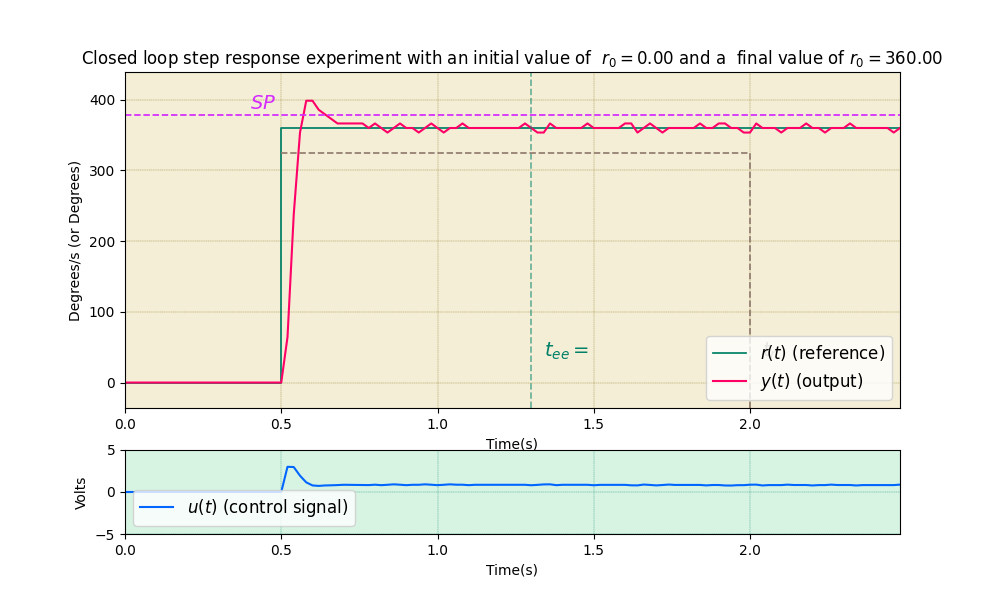

Zeta:  0.9291063599182773
Sobre impulso:  10.714289347330729 %
Kp: 0.008337402591934691  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  214   (2,)


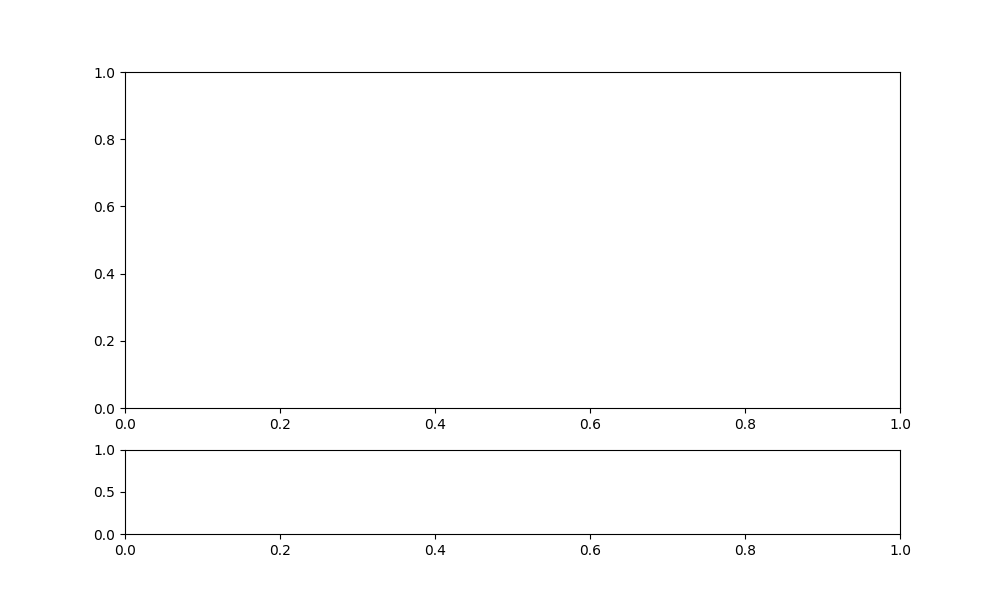

Connected successfully to MQTT Broker!


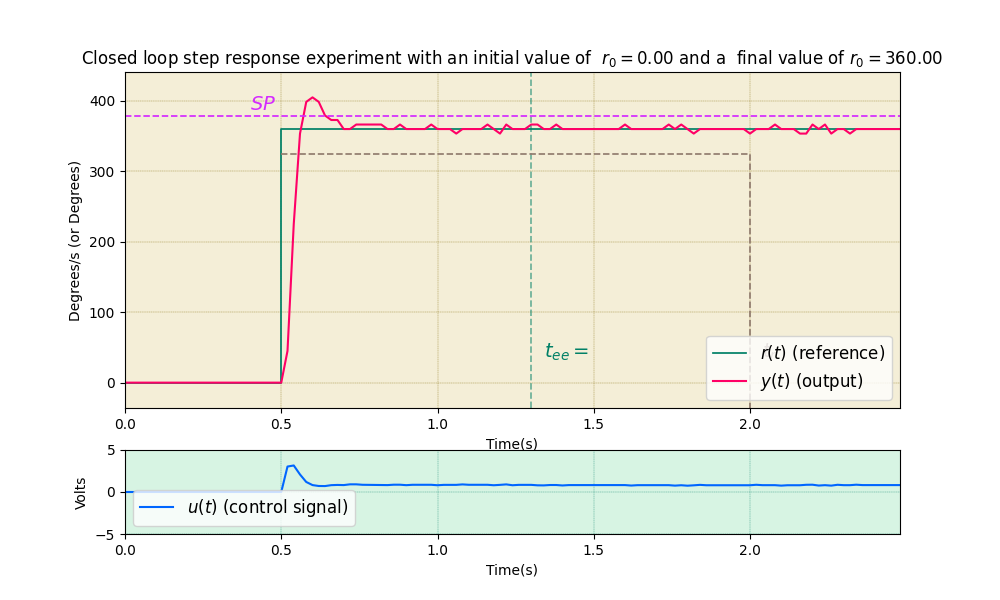

Zeta:  0.9361957239264496
Sobre impulso:  12.500008477105034 %
Kp: 0.00841738308731702  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  218   (2,)


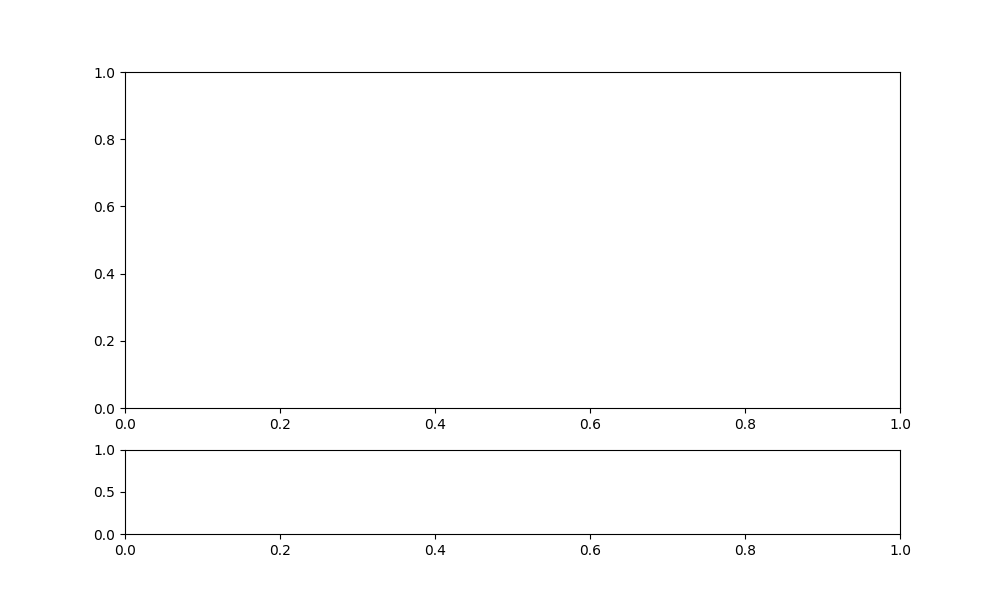

Connected successfully to MQTT Broker!


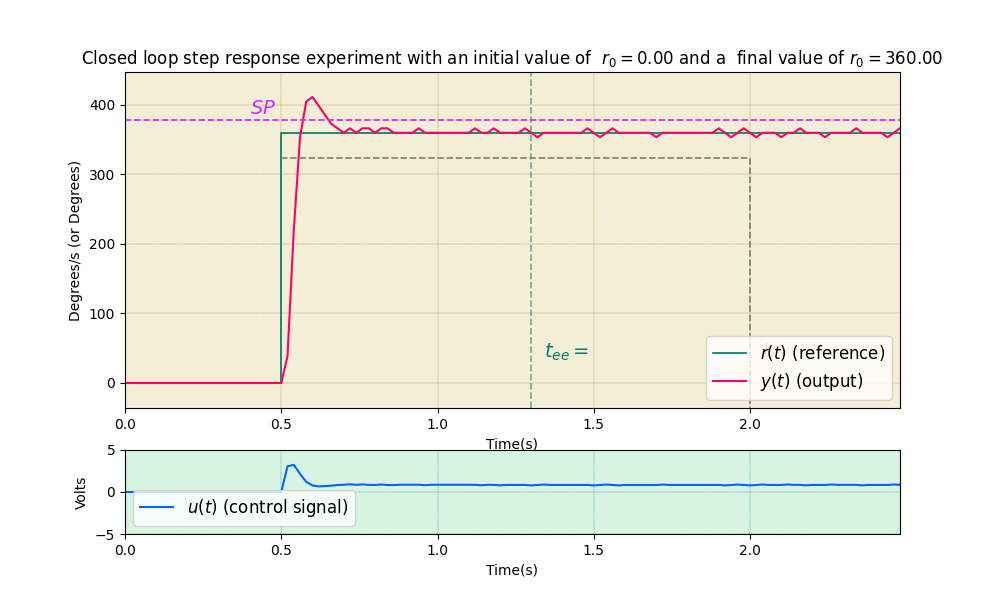

Zeta:  0.9425761515338046
Sobre impulso:  14.285719129774305 %
Kp: 0.008489365533161116  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  222   (2,)


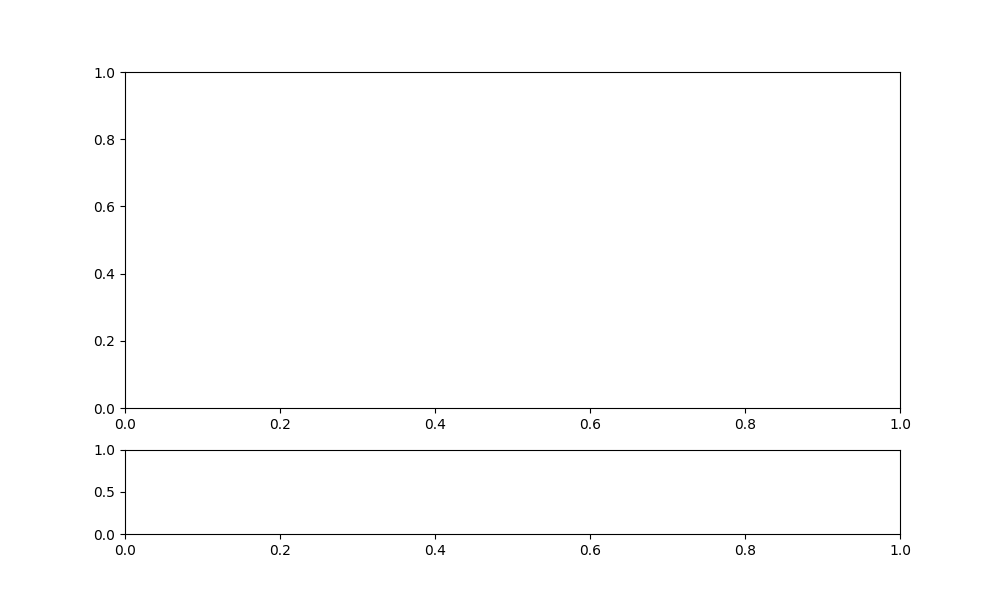

Connected successfully to MQTT Broker!


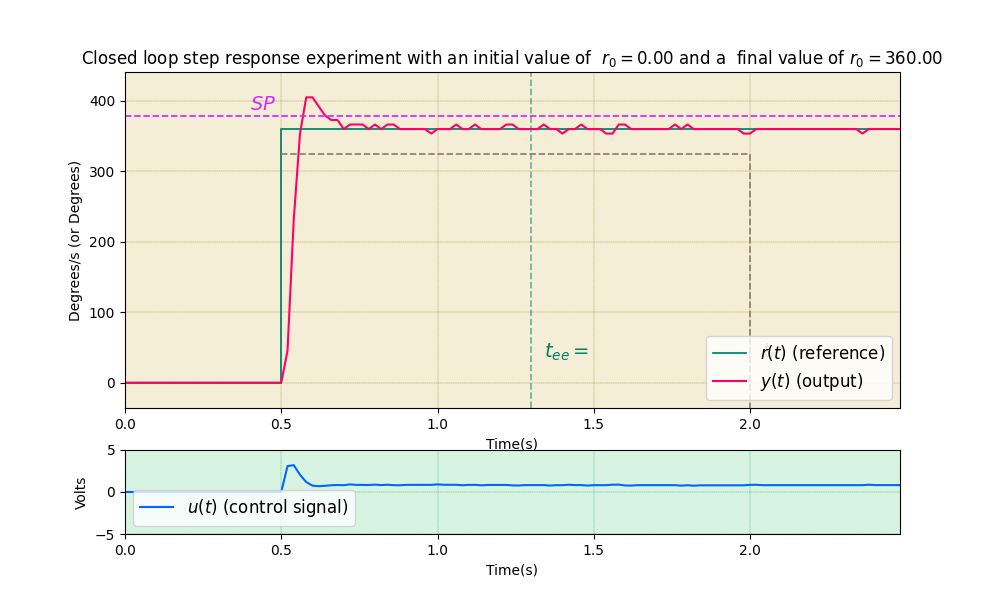

Zeta:  0.9483185363804241
Sobre impulso:  12.500008477105034 %
Kp: 0.008554149734420804  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  226   (2,)


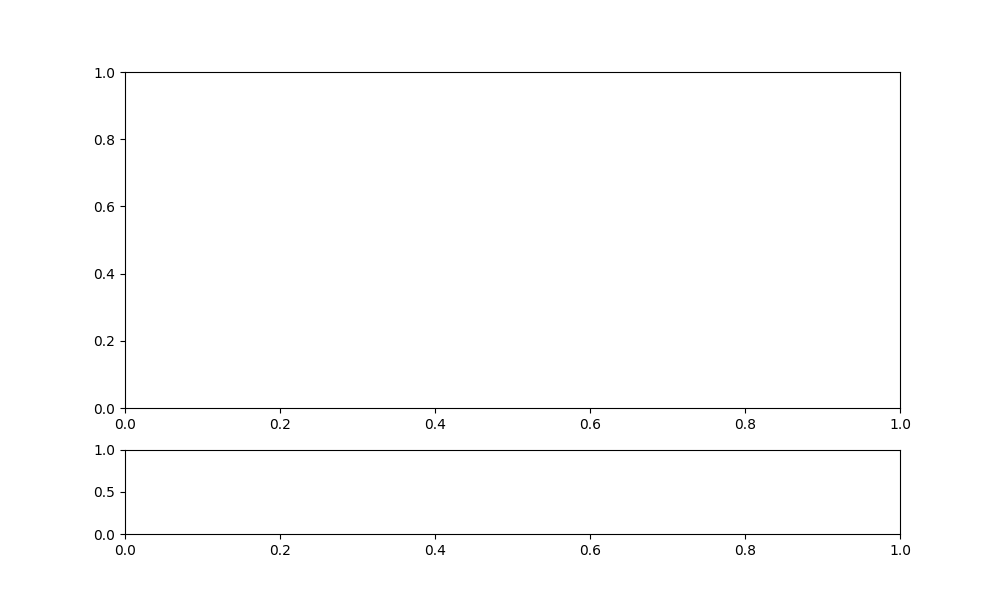

Connected successfully to MQTT Broker!


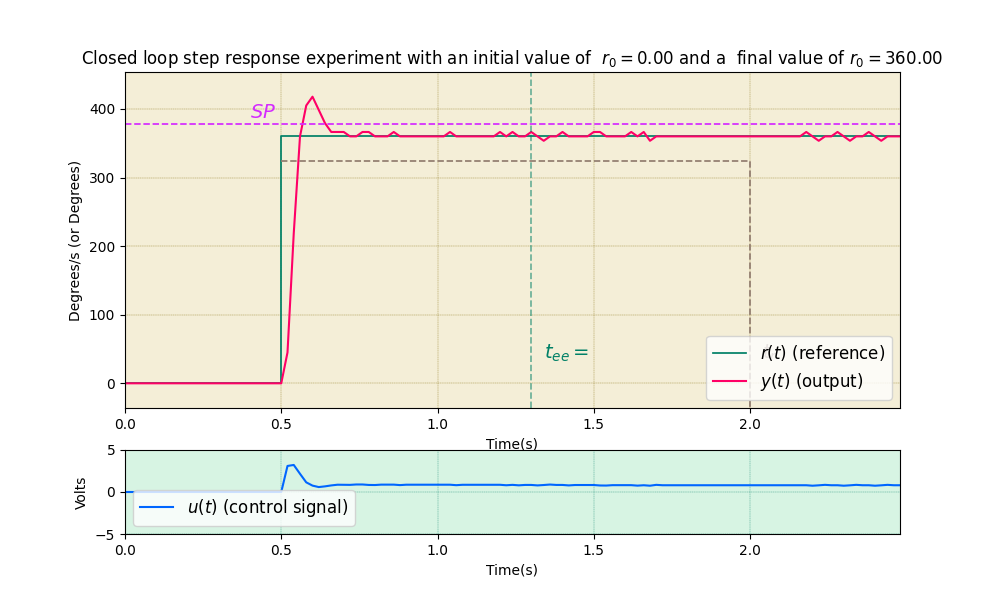

Zeta:  0.9534866827423817
Sobre impulso:  16.07143825954861 %
Kp: 0.008612455515554522  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  230   (2,)


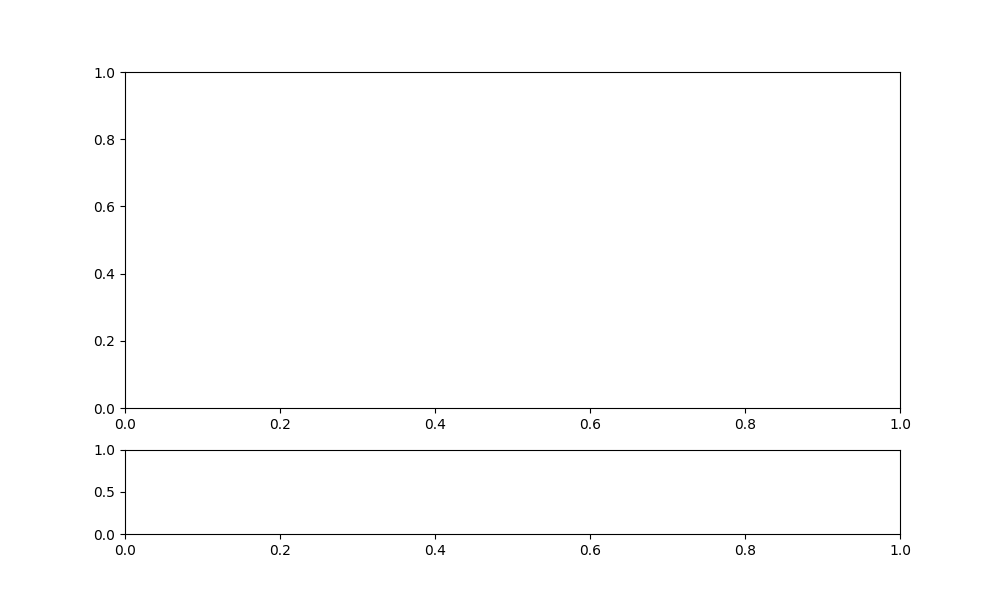

Connected successfully to MQTT Broker!


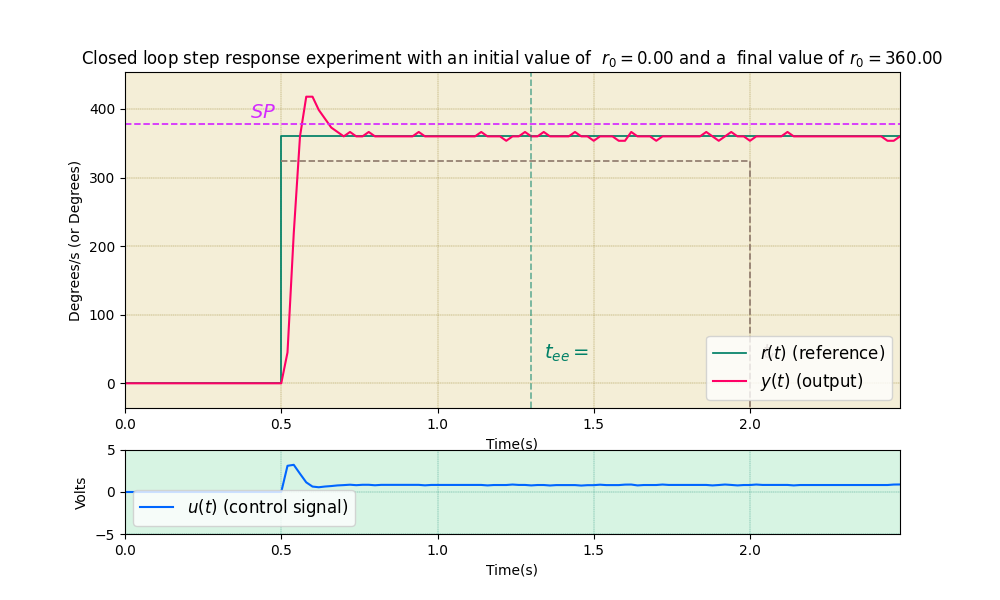

Zeta:  0.9581380144681435
Sobre impulso:  16.07143825954861 %
Kp: 0.00866493071857487  Ki: 0.07031933150413619
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  234   (2,)


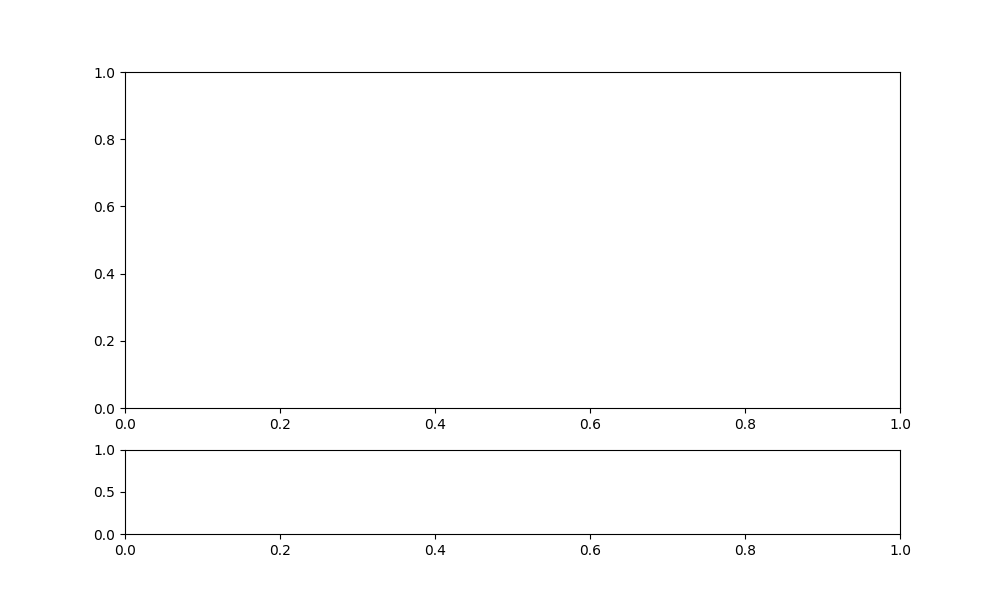

Connected successfully to MQTT Broker!


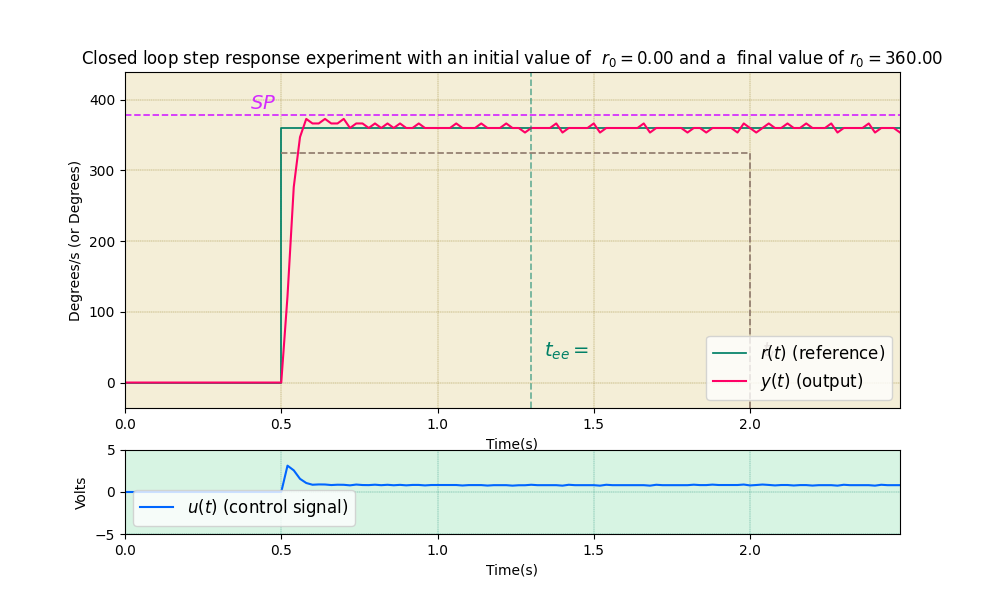

Zeta:  0.9623242130213292
Sobre impulso:  3.5714382595486107 %
Kp: 0.008712158401293182  Ki: 0.07031933150413619


In [49]:
i = 1
while SPreal > SP:
    zeta , kp , ki = retirativoZeta(wn, zeta, alpha, tau)
    velf1 = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velf1.kp,ki=velf1.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)
    plt.savefig(f"SintoniaVel_2_DelZeta_{i}.png", format="png", bbox_inches="tight") # para salvar la figura
    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Zeta: ",zeta)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velf1.kp," Ki:", velf1.ki)

    i = i+1

## CASO 3

In [68]:
###Caso Vel3
SP =0.01
tee = 0.8
tr = 1.5
zeta, wn, kp, ki = Medio(SP, tee, tr, tau, alpha)
vel3 = Vel(zeta, wn, kp, ki)

### Primera pruebas sin iteracion 

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  250   (2,)


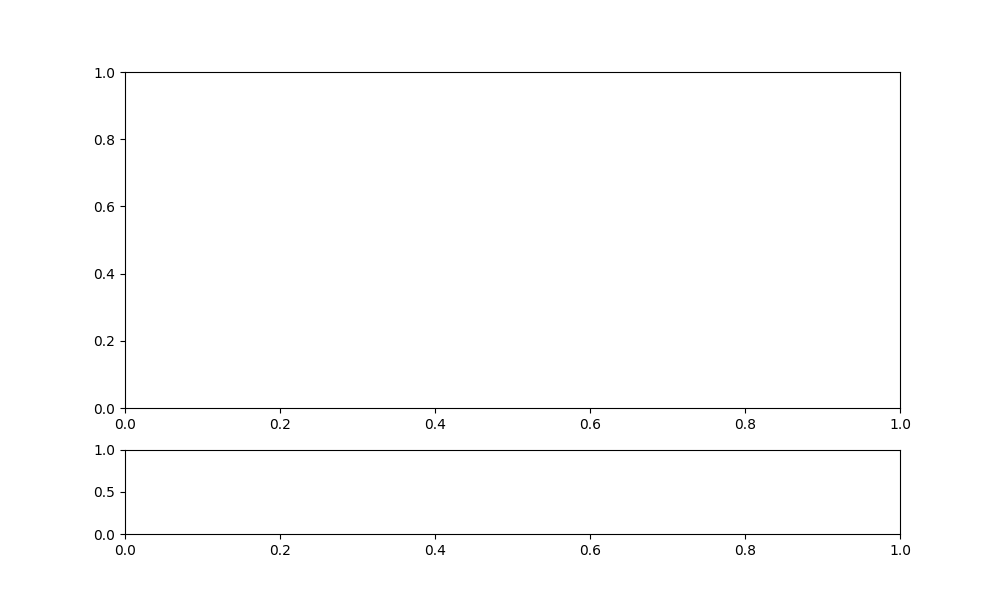

Connected successfully to MQTT Broker!


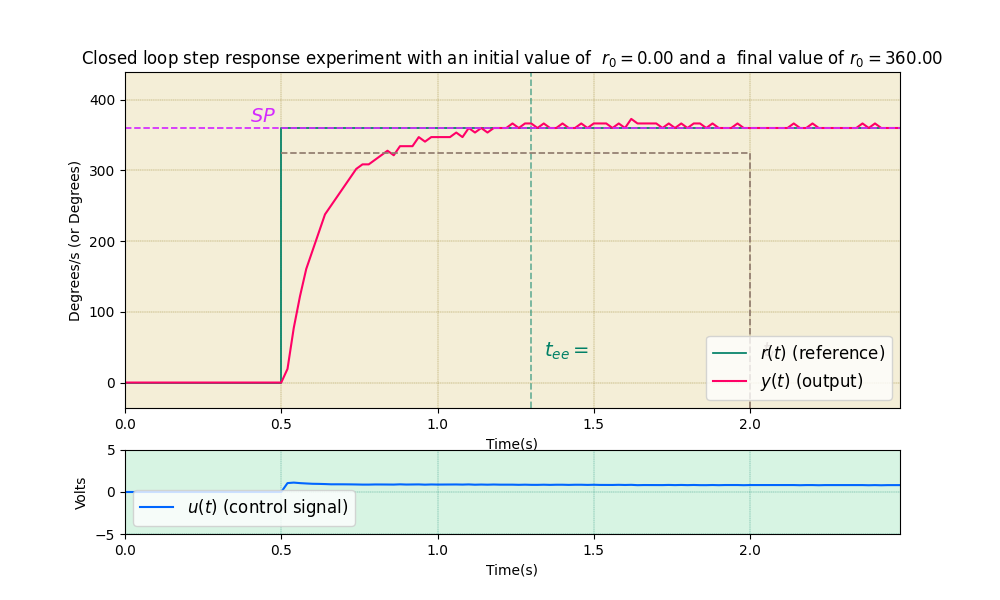

3.5714382595486107
0.9464566995518346


In [69]:
motor.set_pid(mi_motor,kp=vel3.kp,ki=vel3.ki,kd=0,beta=1, output="speed")
t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
motor.set_reference(mi_motor,0)
draw_specifications(tee, tr, SP)

plt.savefig("SintoniaAlgbraica_vel_3.png", format="png", bbox_inches="tight") # para salvar la figura
plt.show() # para congelarla en el notebook

SPreal = ((max(y)-r1)/(r1-r0)*100)
print(SPreal)
print(zeta)


In [70]:
resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]
print(resultado)

contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

print(f"Valores mayores que 10: {contador}")



[-100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -94.64285691579182, -78.57142766316731, -66.07142554389107, -55.35714043511285, -48.21428087022569, -41.07142130533854, -33.928565979003906, -30.35713619656033, -26.785702175564236, -23.214280870225696, -19.642851087782116, -16.071421305338543, -14.28571065266927, -14.28571065266927, -12.499991522894966, -10.714280870225695, -8.92856174045139, -10.714280870225695, -7.142851087782118, -7.142851087782118, -7.142851087782118, -3.5714213053385415, -5.3571319580078125, -3.5714213053385415, -3.5714213053385415, -3.5714213053385415, -3.5714213053385415, -1.7857106526692708, -3.5714213053385415, 8.477105034722223e-06, -1.7857106526692708, 8.477105034722223e-06, -1.7857106526692708, 8.477105034722223e-06, 8.477105034722223e-06, 8.477105034722223e-06, 1.7857191297743054, 8.477105034722223e-

### Pruebas con iteracion

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  254   (2,)


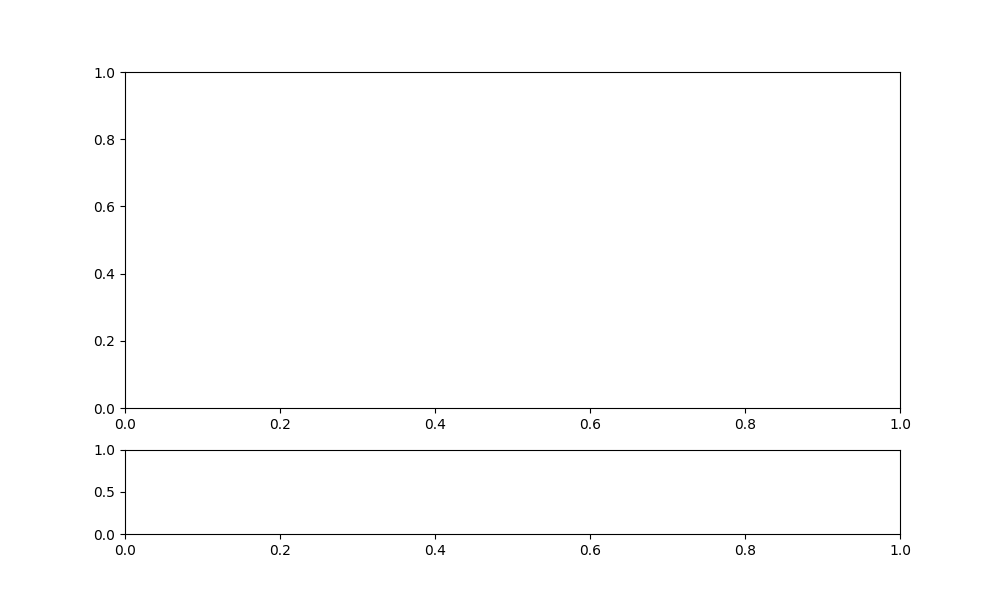

Connected successfully to MQTT Broker!


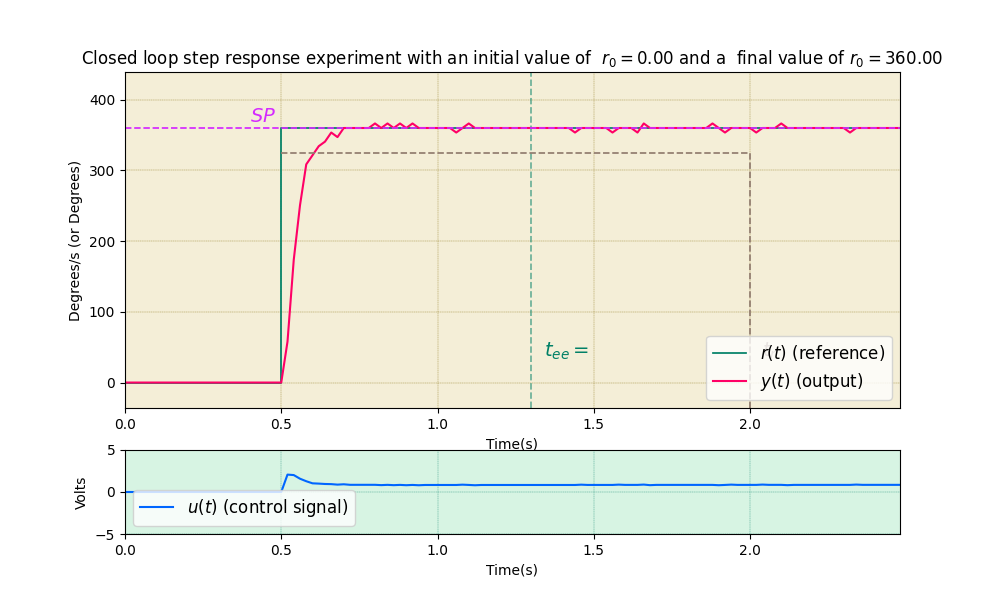

Sobre impulso:  1.7857191297743054 %
Kp: 0.005754162670798426  Ki: 0.03847976273963114  wn: 9.221609796128838
Valores mayores que son SP estable: 8


In [71]:
Te = 0.02
i = 1
while contador <= 5 | i <= 8 :
    wn, zeta , kp , ki,  = reiterativoWn(wn, zeta, alpha, tau,Te)
    velwn = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velwn.kp,ki=velwn.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)

    
    plt.savefig(f"SintoniaVel_3_DelWn_{i}.png", format="png", bbox_inches="tight") # para salvar la figura

    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velwn.kp," Ki:", velwn.ki," wn:" , velwn.wn)
    resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]

    contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

    print(f"Valores mayores que son SP estable: {contador}")
    i = i+1



Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  258   (2,)


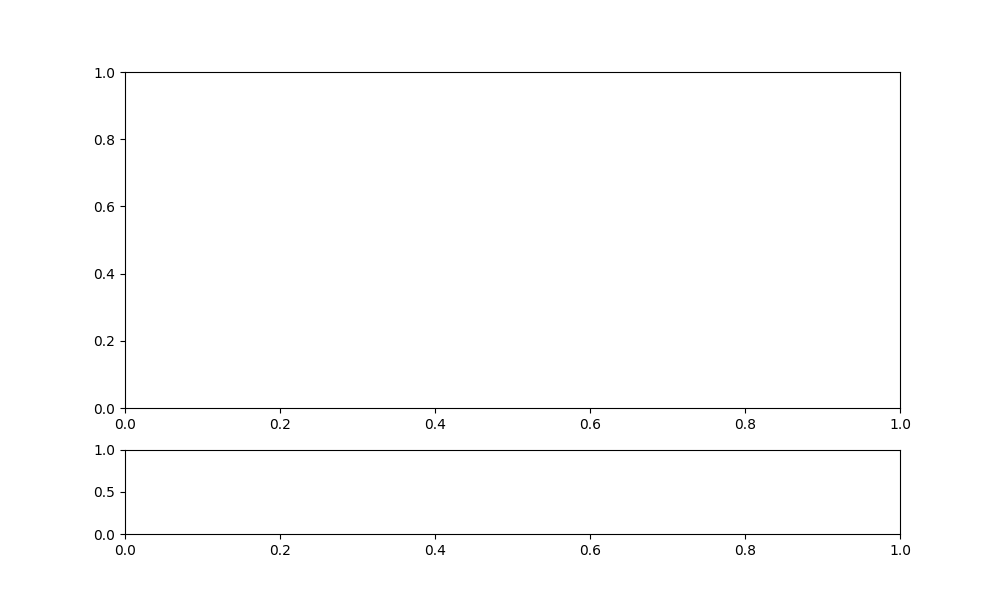

Connected successfully to MQTT Broker!


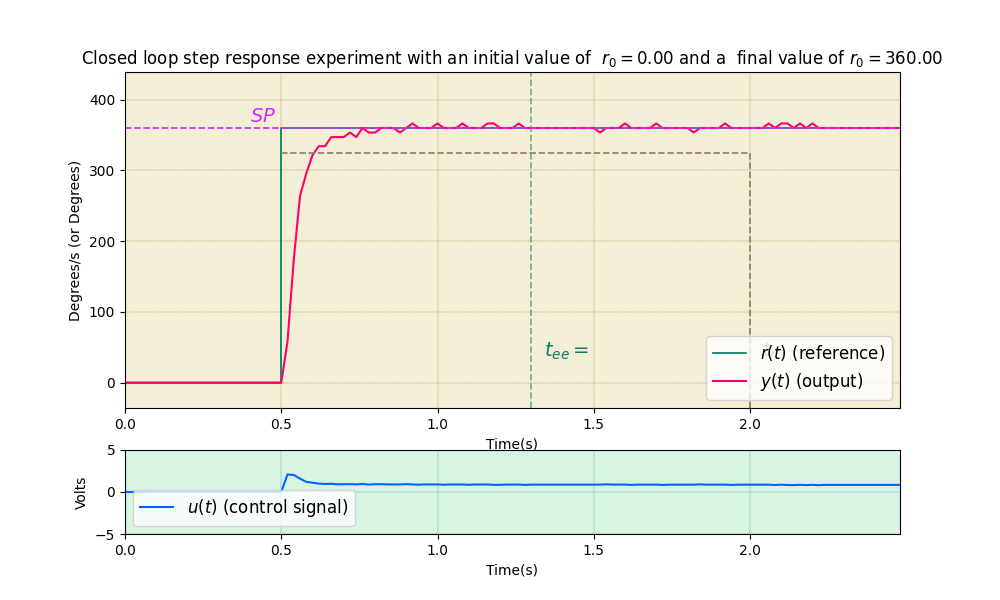

Zeta:  0.9518110295966512
Sobre impulso:  1.7857191297743054 %
Kp: 0.005798847569489478  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  262   (2,)


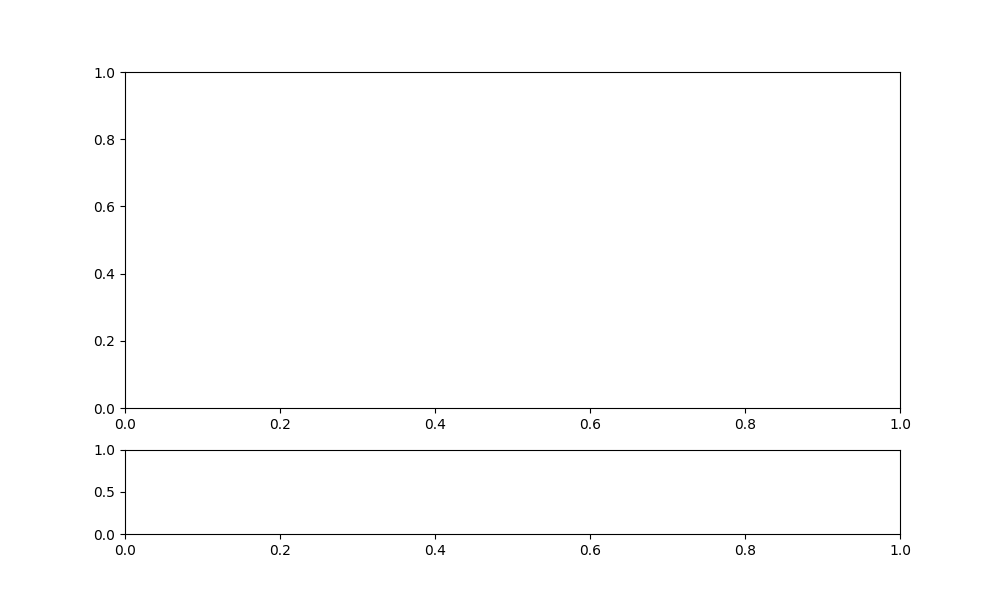

Connected successfully to MQTT Broker!


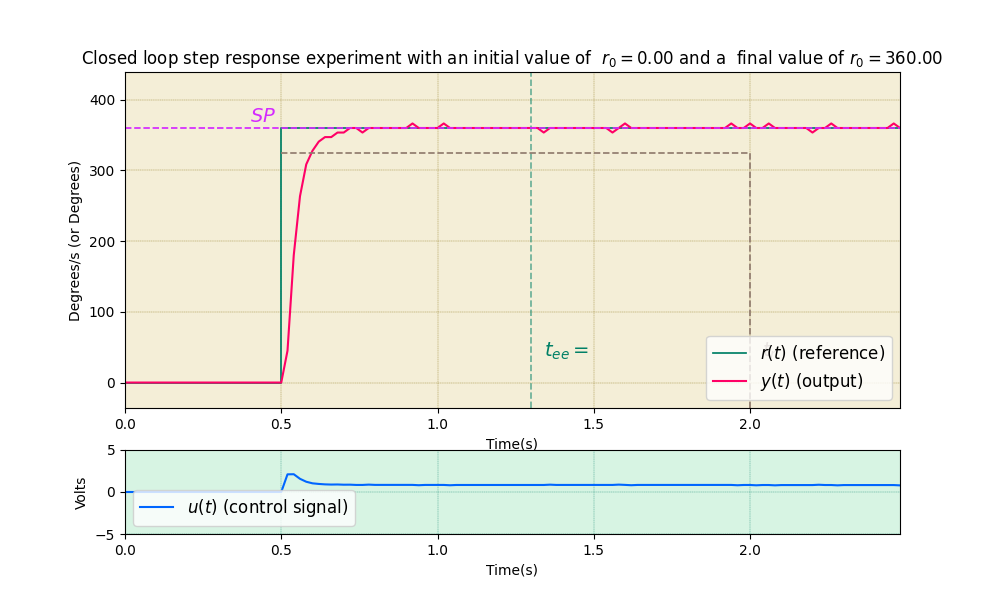

Zeta:  0.9566299266369861
Sobre impulso:  1.7857191297743054 %
Kp: 0.005839063978311427  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  266   (2,)


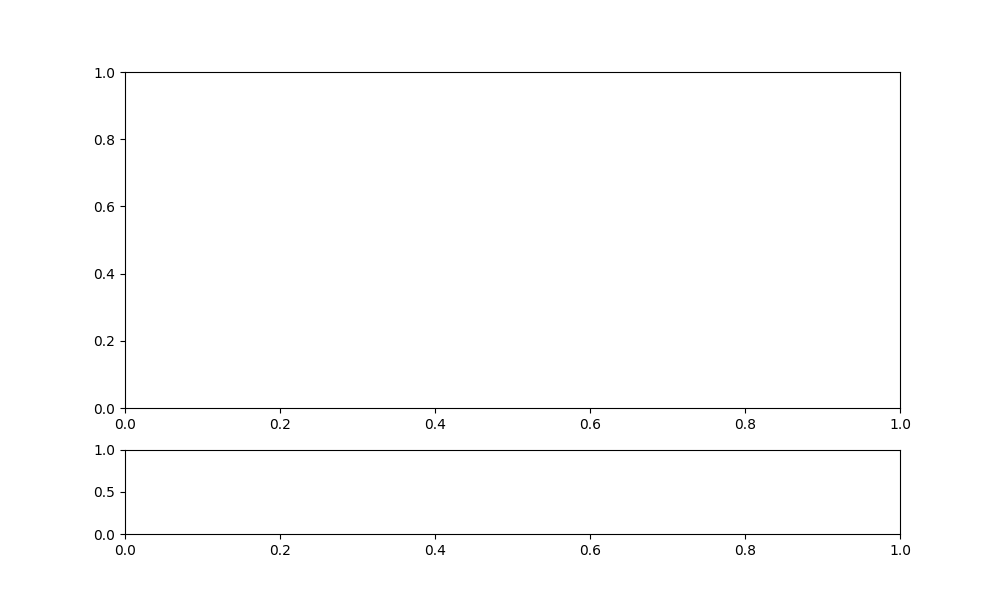

Connected successfully to MQTT Broker!


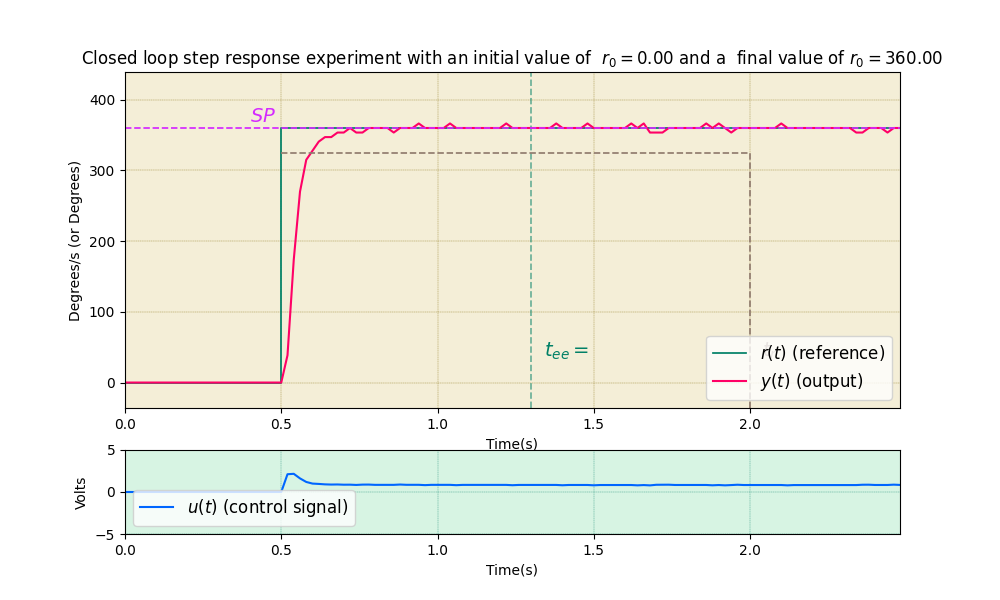

Zeta:  0.9609669339732875
Sobre impulso:  1.7857191297743054 %
Kp: 0.005875258746251178  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  270   (2,)


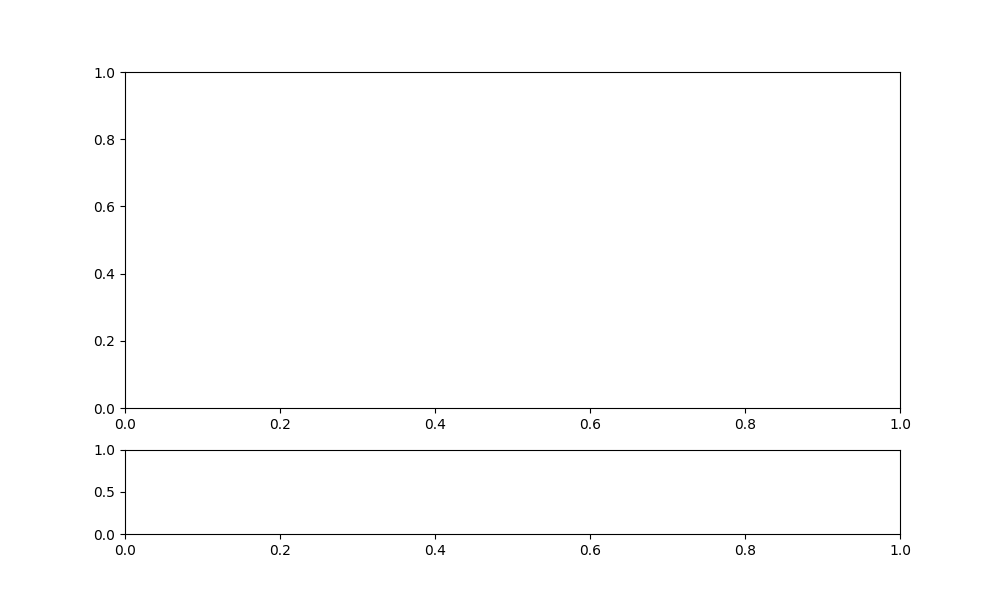

Connected successfully to MQTT Broker!


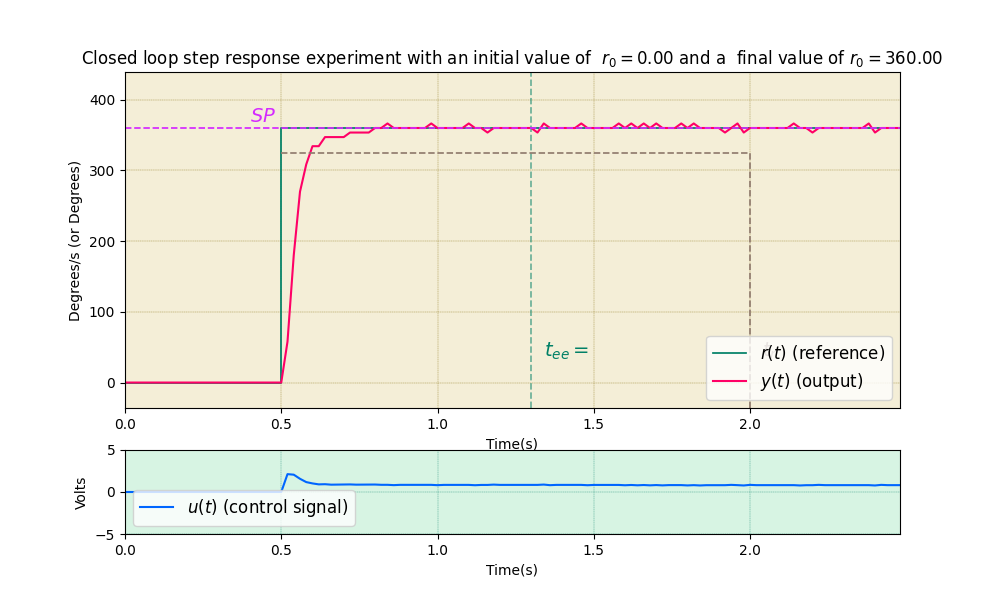

Zeta:  0.9648702405759587
Sobre impulso:  1.7857191297743054 %
Kp: 0.005907834037396957  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  274   (2,)


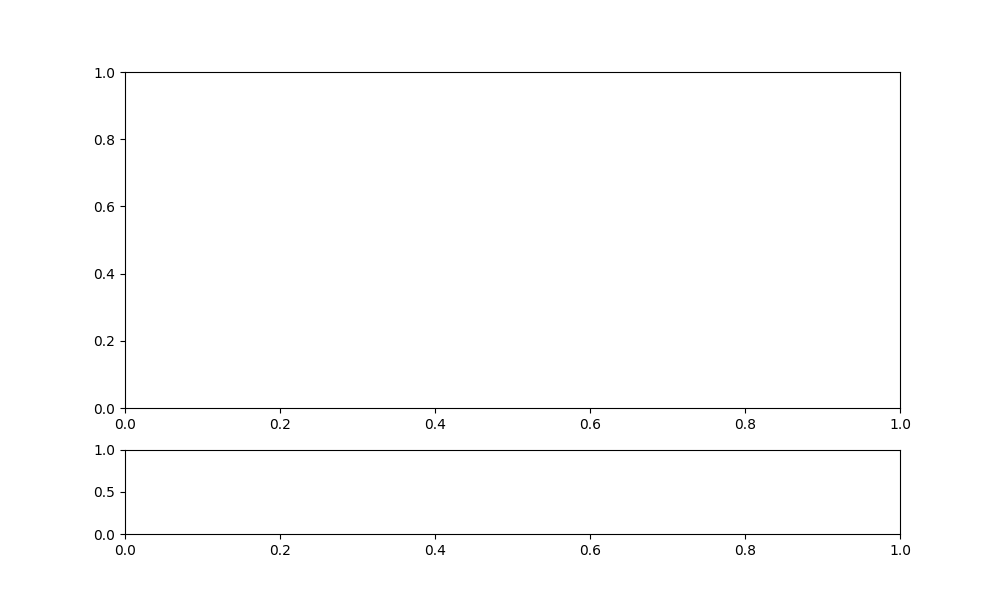

Connected successfully to MQTT Broker!


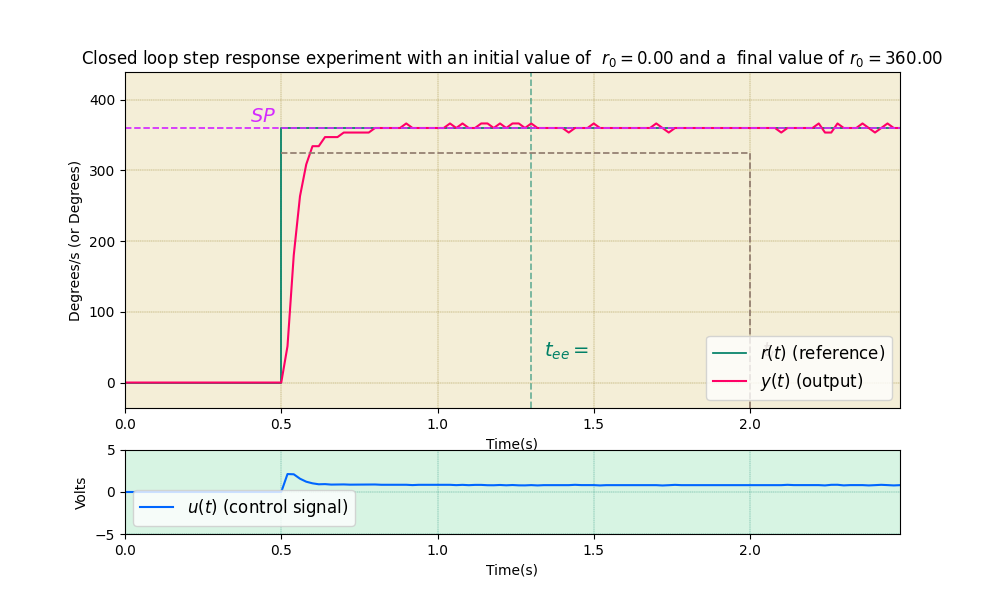

Zeta:  0.9683832165183628
Sobre impulso:  1.7857191297743054 %
Kp: 0.0059371517994281555  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  278   (2,)


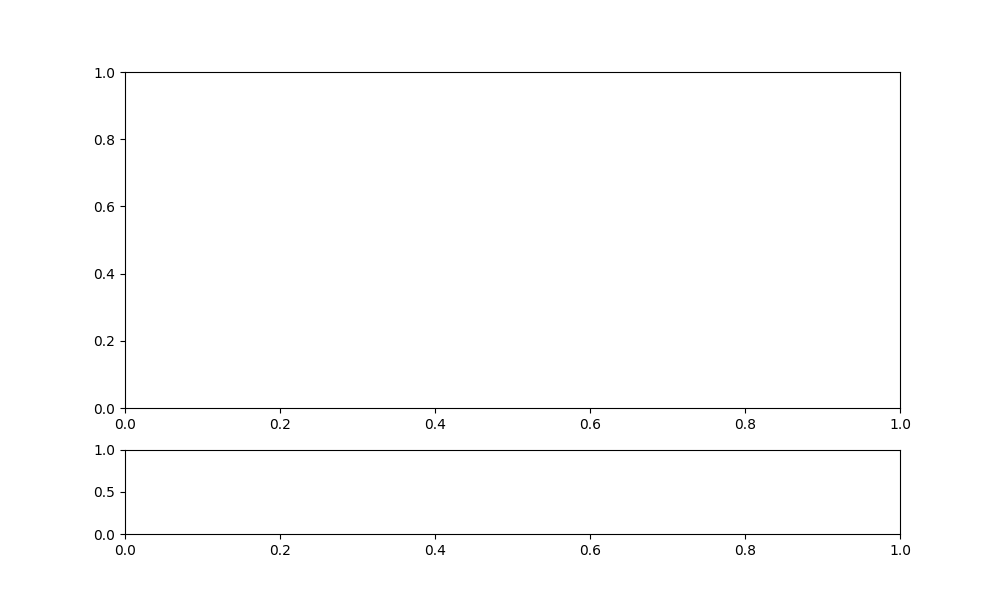

Connected successfully to MQTT Broker!


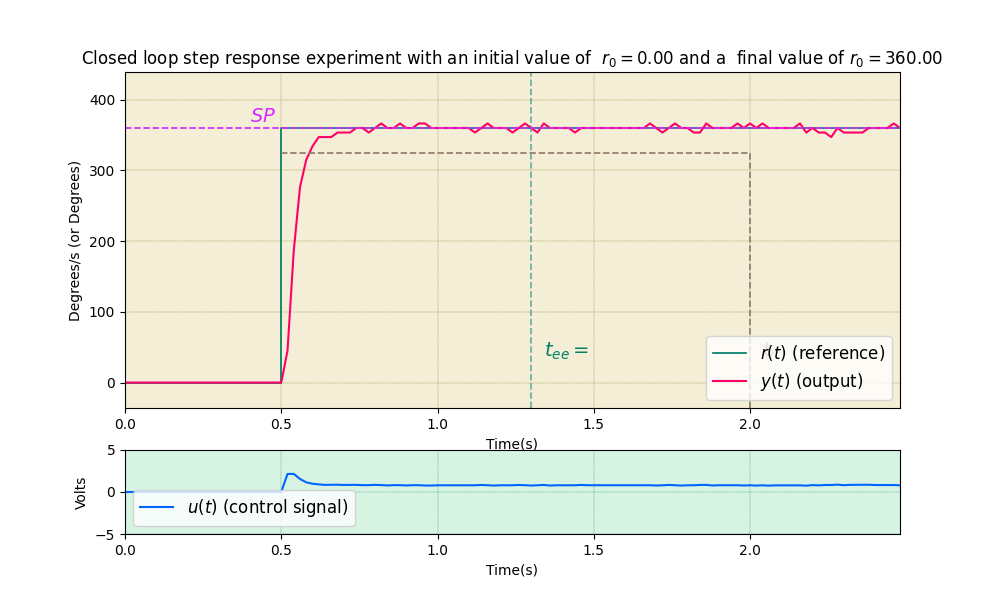

Zeta:  0.9715448948665265
Sobre impulso:  1.7857191297743054 %
Kp: 0.0059635377852562356  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  282   (2,)


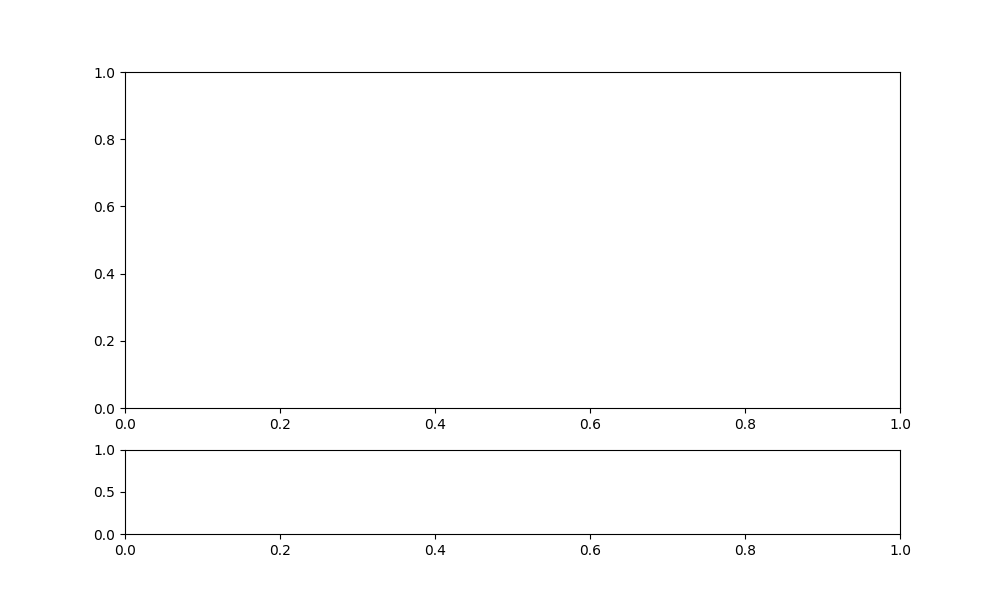

Connected successfully to MQTT Broker!


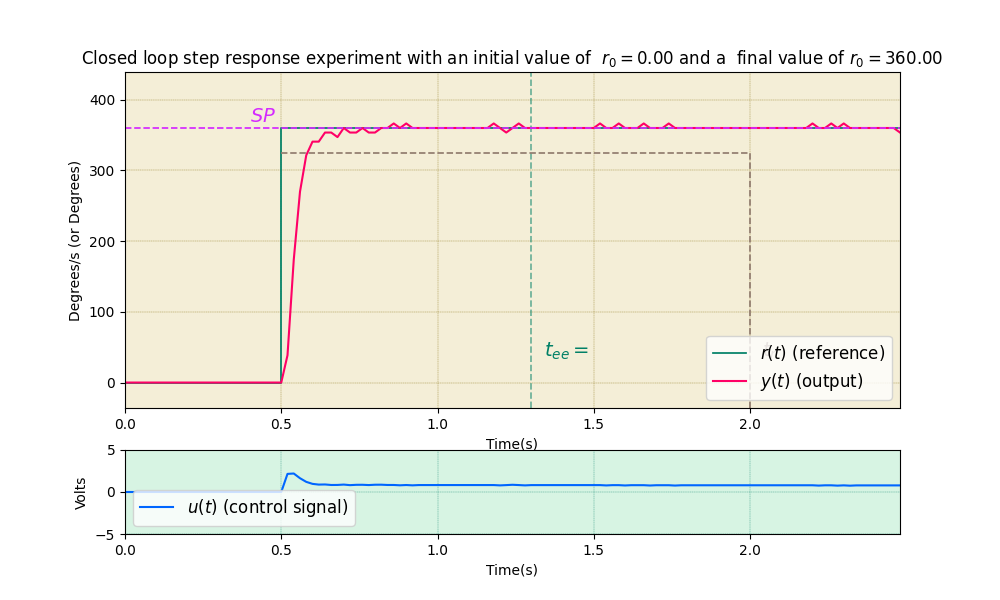

Zeta:  0.9743904053798739
Sobre impulso:  1.7857191297743054 %
Kp: 0.005987285172501507  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  286   (2,)


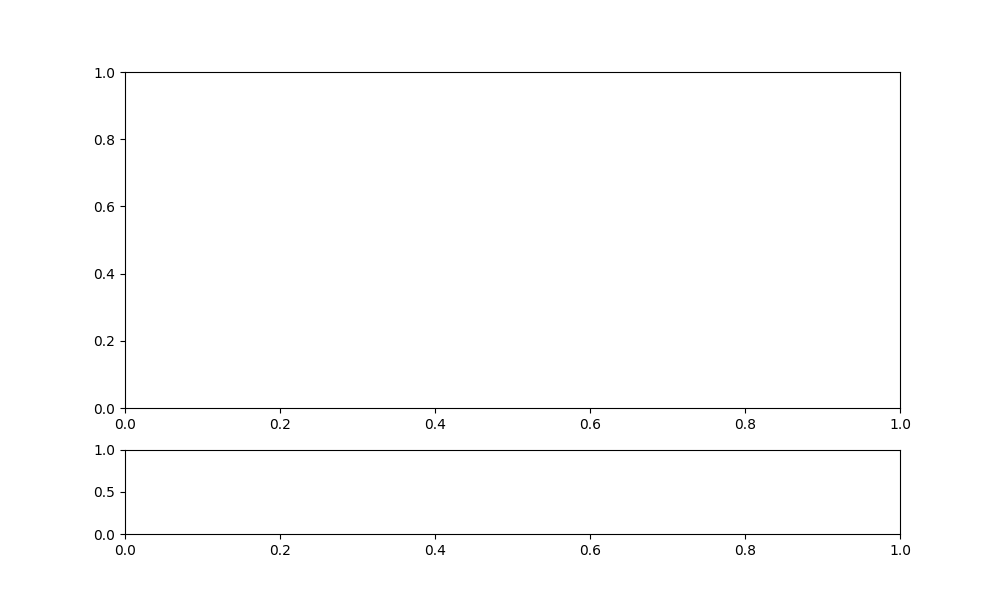

Connected successfully to MQTT Broker!


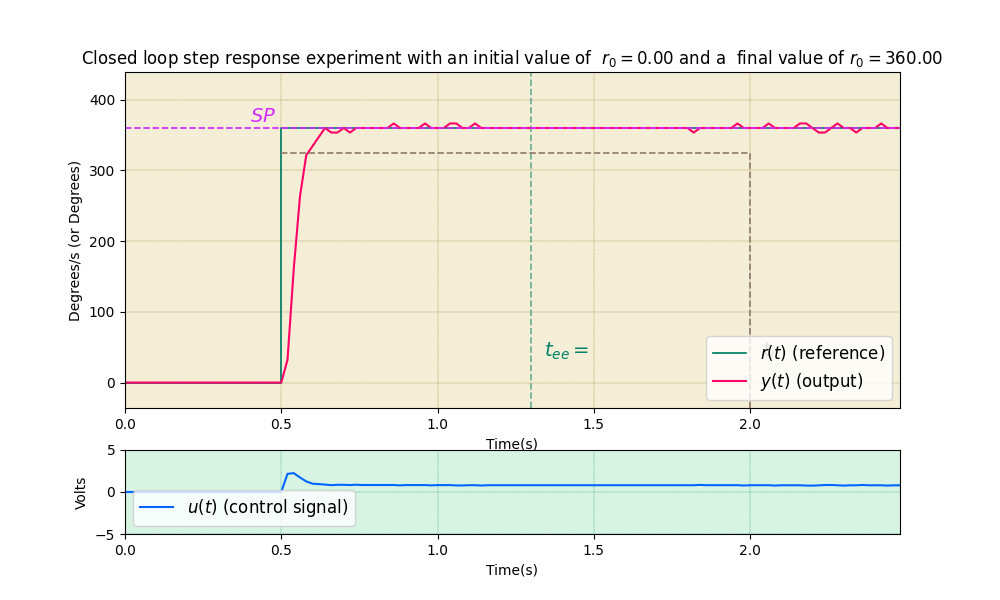

Zeta:  0.9769513648418865
Sobre impulso:  1.7857191297743054 %
Kp: 0.006008657821022252  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  290   (2,)


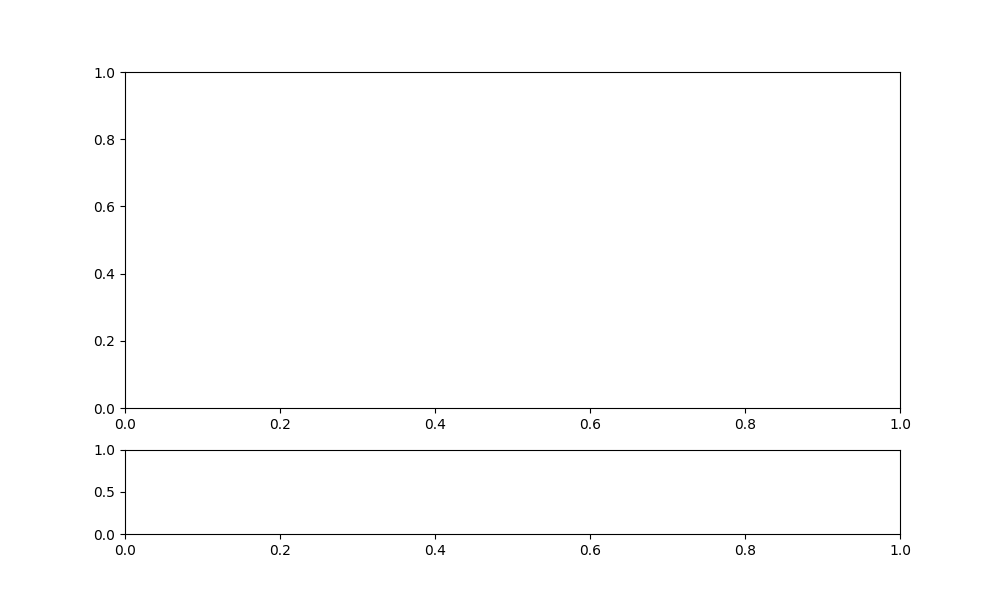

Connected successfully to MQTT Broker!


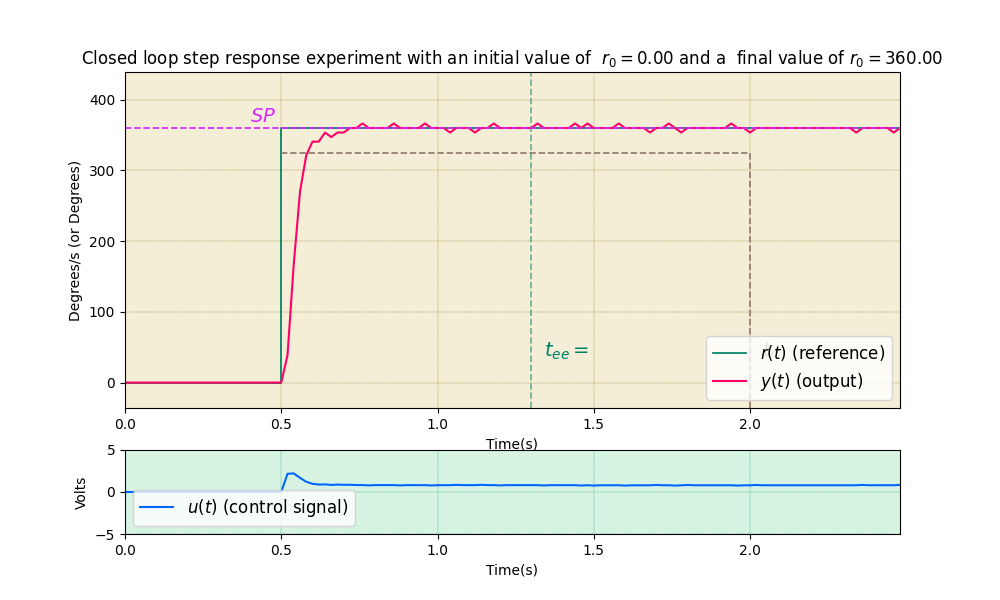

Zeta:  0.9792562283576979
Sobre impulso:  1.7857191297743054 %
Kp: 0.0060278932046909225  Ki: 0.03847976273963114
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  294   (2,)


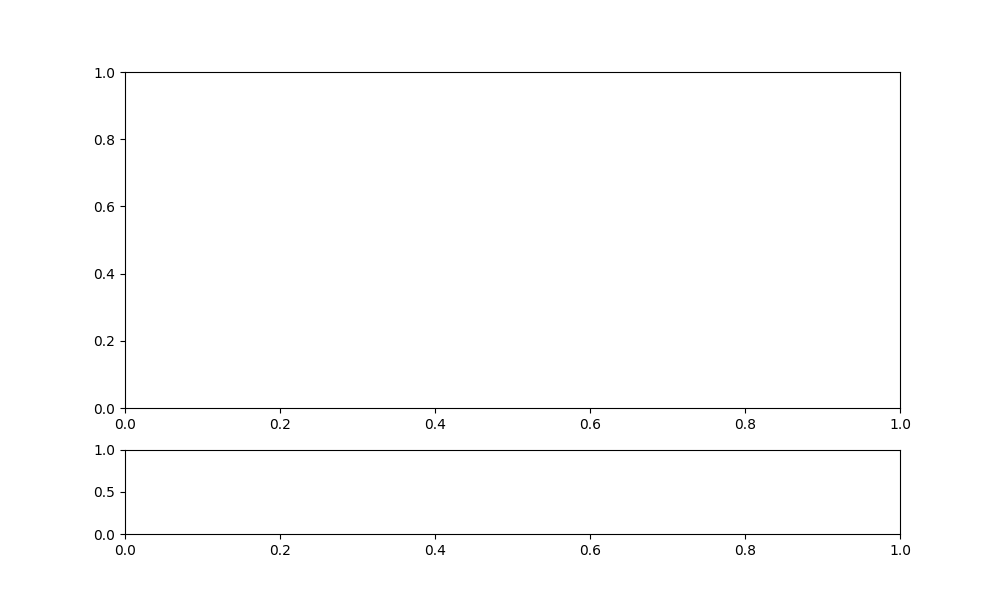

ValueError: zero-size array to reduction operation maximum which has no identity

Connected successfully to MQTT Broker!


In [72]:
i = 1
while SPreal > SP:
    zeta , kp , ki = retirativoZeta(wn, zeta, alpha, tau)
    velf1 = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velf1.kp,ki=velf1.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)

    plt.savefig(f"SintoniaVel_3_DelZeta_{i}.png", format="png", bbox_inches="tight") # para salvar la figura
    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Zeta: ",zeta)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velf1.kp," Ki:", velf1.ki)

    i = i+1

## CASO 4

In [73]:
###Caso Vel4
SP=10
tee = 0.2
tr = 0.1
zeta, wn, kp, ki = Medio(10, 0.8, 1.5, tau, alpha)
vel4 = Vel(zeta, wn, kp, ki)

### Primera pruebas sin iteracion 

succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  297   (2,)


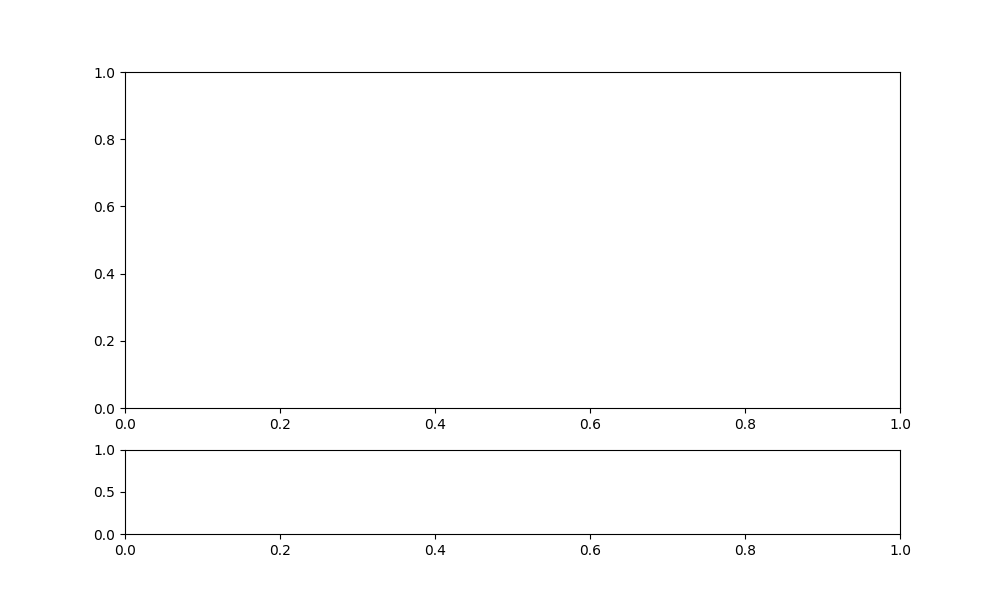

Connected successfully to MQTT Broker!


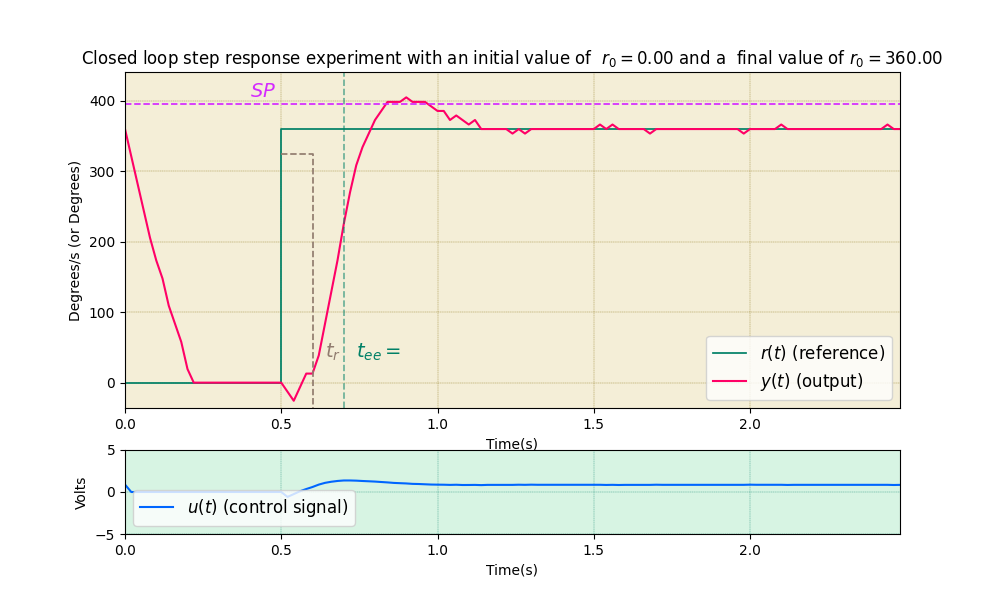

12.500008477105034
0.5911550337988976


In [74]:
motor.set_pid(mi_motor,kp=vel4.kp,ki=vel4.ki,kd=0,beta=1, output="speed")
t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
motor.set_reference(mi_motor,0)
draw_specifications(tee, tr, SP)
plt.savefig("SintoniaAlgbraica_vel_4.png", format="png", bbox_inches="tight") # para salvar la figura
plt.show() # para congelarla en el notebook

SPreal = ((max(y)-r1)/(r1-r0)*100)
print(SPreal)
print(zeta)

In [75]:
resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]
print(resultado)

contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

print(f"Valores mayores que 10: {contador}")



[8.477105034722223e-06, -10.714280870225695, -21.428570217556423, -32.14285108778212, -42.857140435112846, -51.78571065266927, -58.92856597900391, -69.64285320705838, -76.78571277194553, -83.92857127719455, -94.64285691579182, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -100.0, -103.57142872280545, -107.1428574456109, -101.78571436140271, -96.42857127719455, -96.42857127719455, -89.28571383158366, -76.78571277194553, -64.28571065266927, -51.78571065266927, -37.499991522894966, -25.0, -14.28571065266927, -7.142851087782118, -1.7857106526692708, 3.5714382595486107, 7.142868041992187, 10.714289347330729, 10.714289347330729, 10.714289347330729, 12.500008477105034, 10.714289347330729, 10.714289347330729, 10.714289347330729, 8.928578694661459, 7.142868041992187, 7.142868041992187, 3.5714382595486107, 5.357148912217882, 3.5714382595486107, 1.7857191297743054, 3.5714382595486107, 8.477105034722223e-06, 8.477105034722223e-06, 8

### Pruebas con iteracion

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  301   (2,)


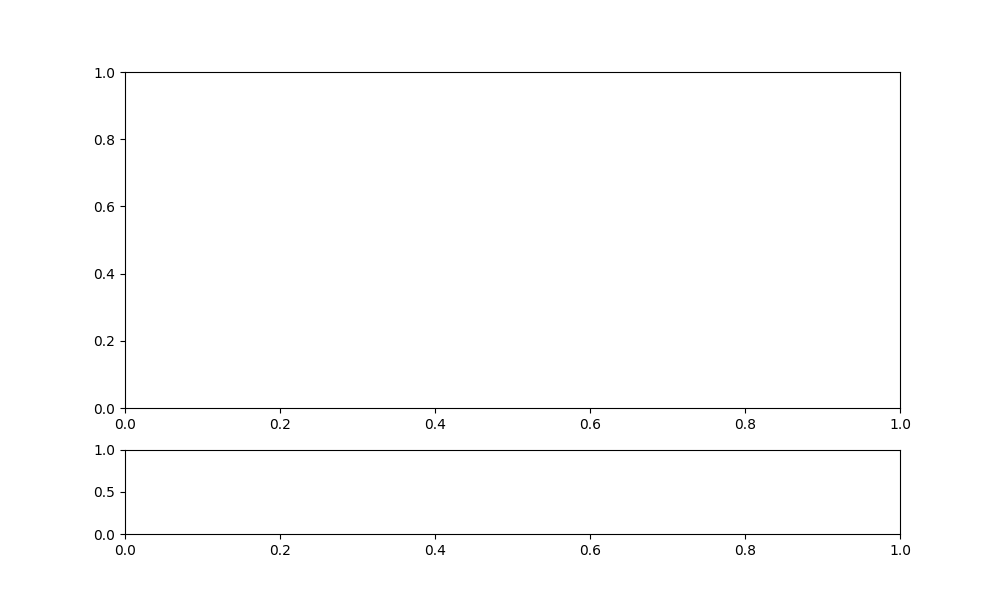

Connected successfully to MQTT Broker!


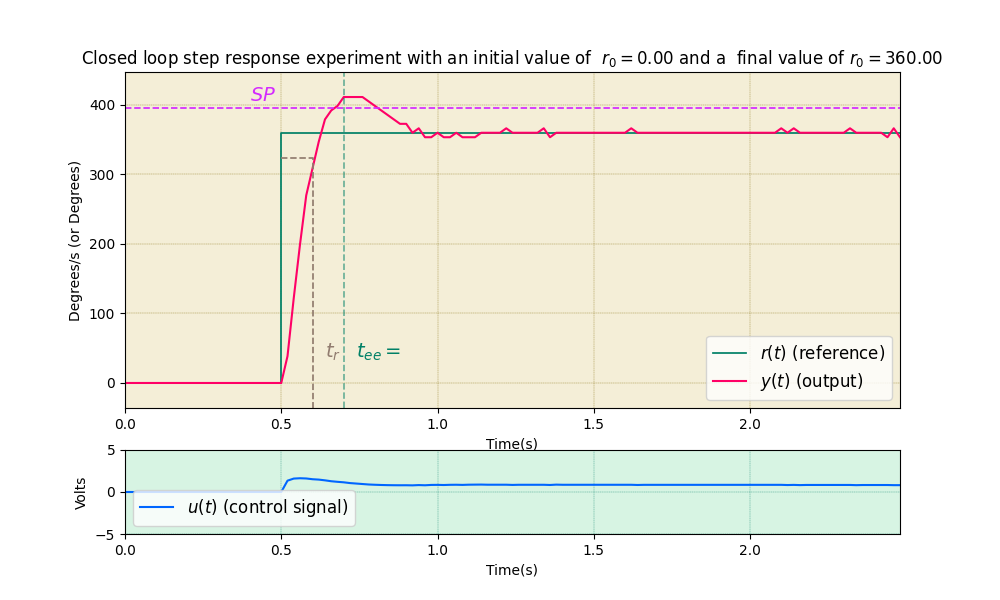

Sobre impulso:  14.285719129774305 %
Kp: 0.0037444861475807154  Ki: 0.05482857511480452  wn: 11.007635204298662
Valores mayores que son SP estable: 4
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  305   (2,)


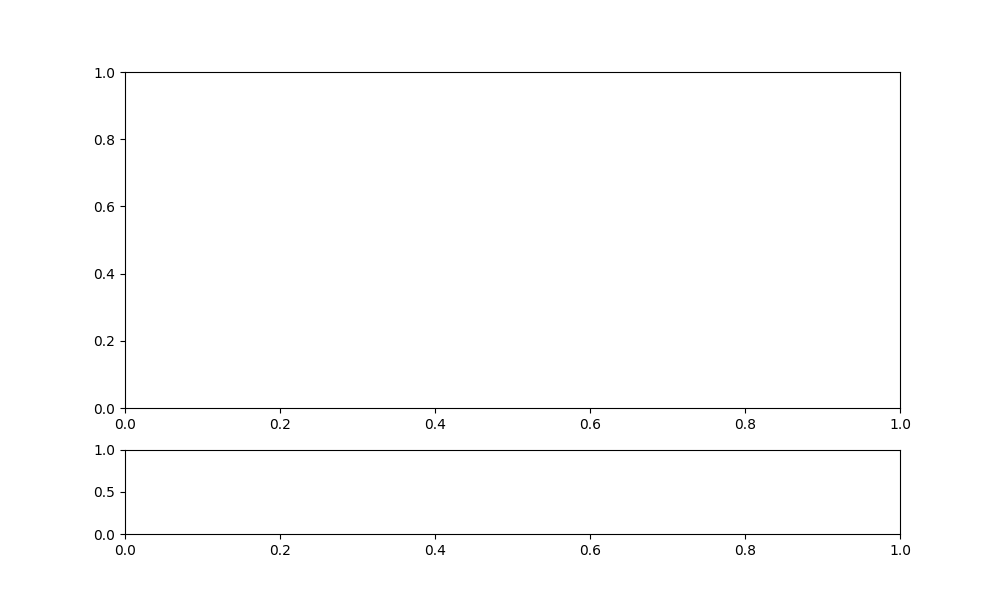

Connected successfully to MQTT Broker!


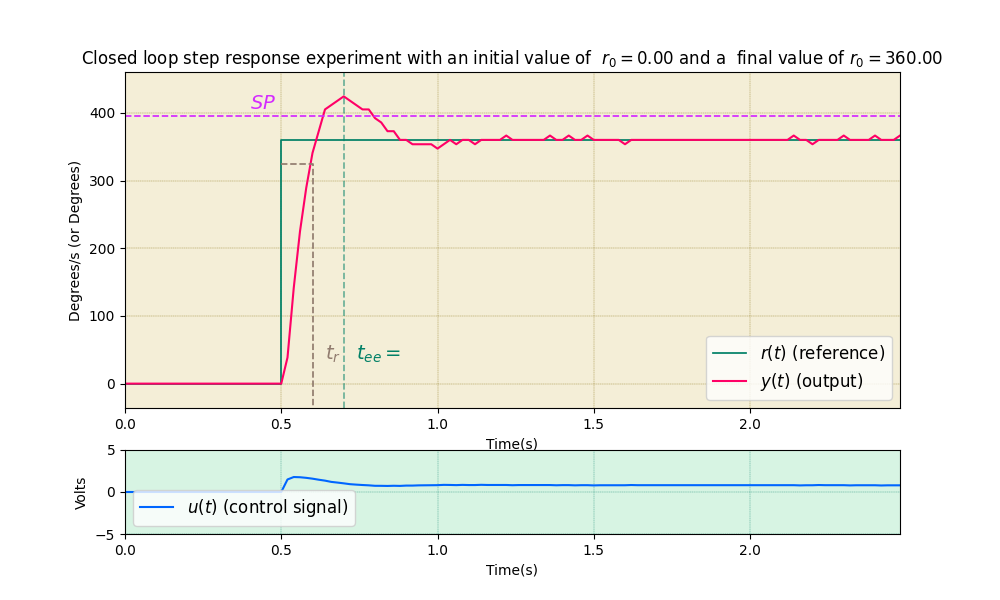

Sobre impulso:  17.857157389322918 %
Kp: 0.00414369052079762  Ki: 0.06251392919418407  wn: 11.753817602149331
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  309   (2,)


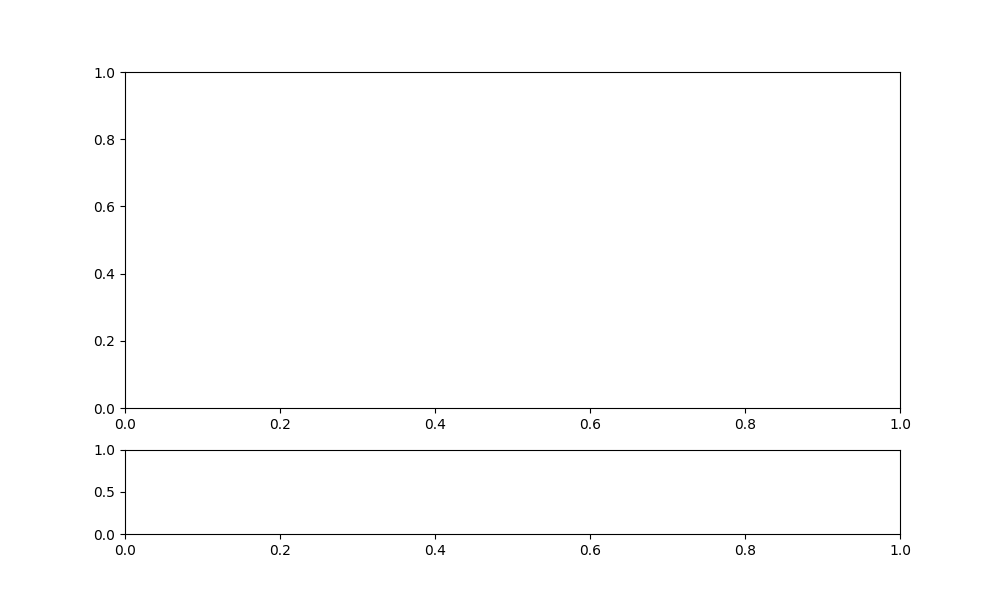

Connected successfully to MQTT Broker!


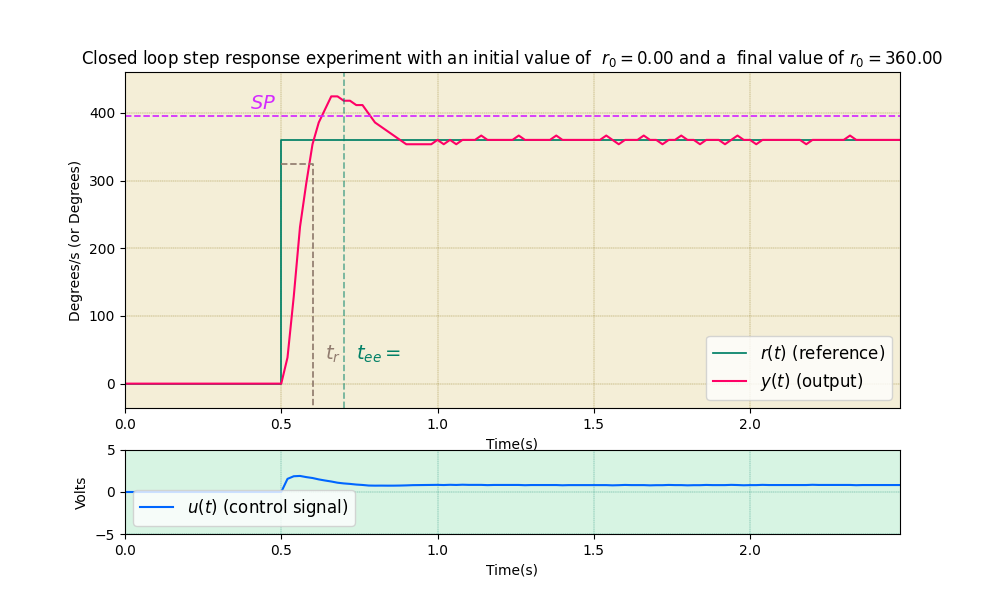

Sobre impulso:  17.857157389322918 %
Kp: 0.004343292707406072  Ki: 0.06654556635816976  wn: 12.126908801074666
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  313   (2,)


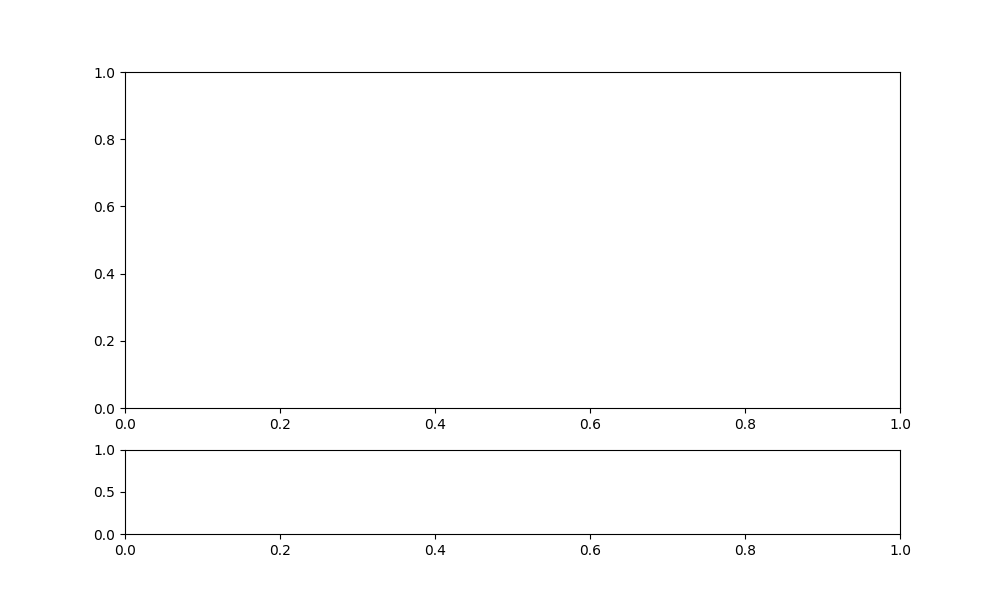

Connected successfully to MQTT Broker!


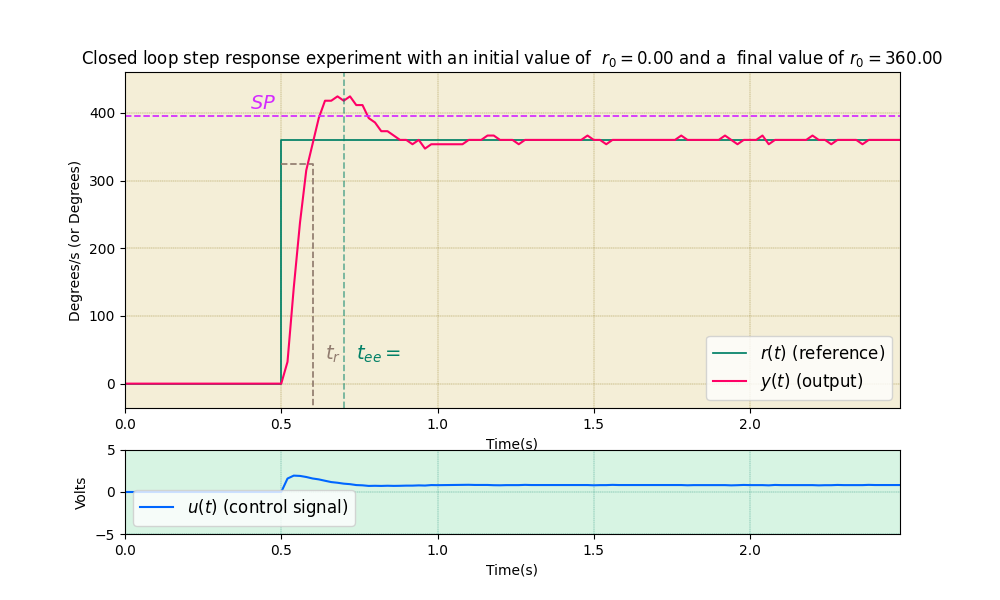

Sobre impulso:  17.857157389322918 %
Kp: 0.004443093800710298  Ki: 0.06860862497123658  wn: 12.313454400537333
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  317   (2,)


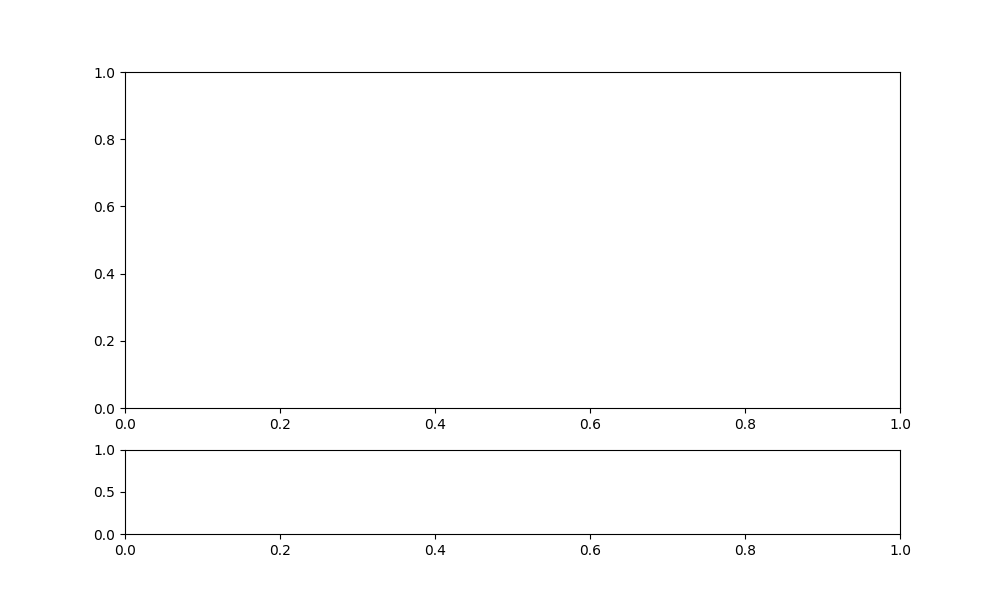

Connected successfully to MQTT Broker!


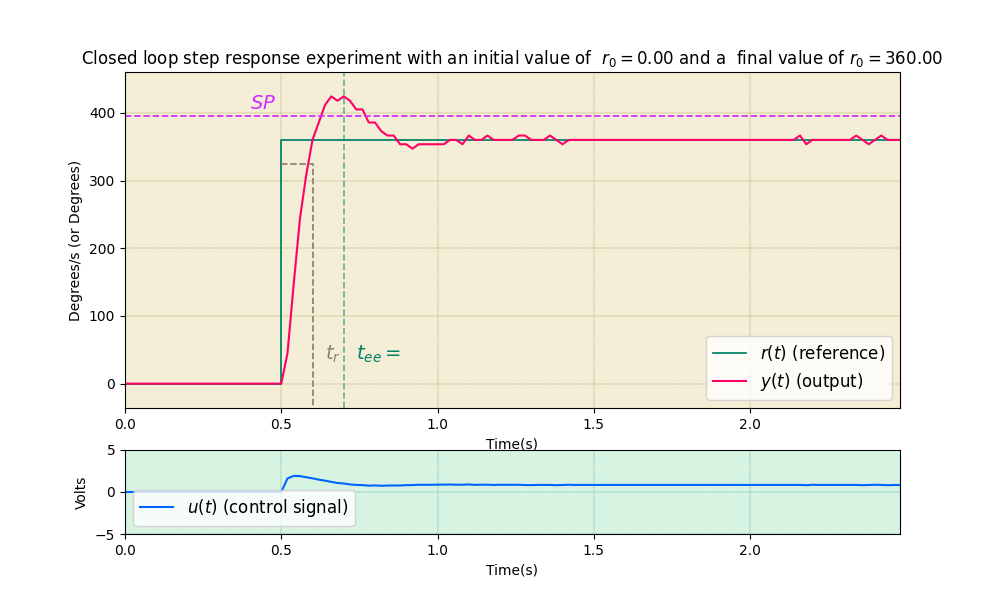

Sobre impulso:  17.857157389322918 %
Kp: 0.004492994347362411  Ki: 0.06965196428553846  wn: 12.406727200268666
Valores mayores que son SP estable: 2
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  321   (2,)


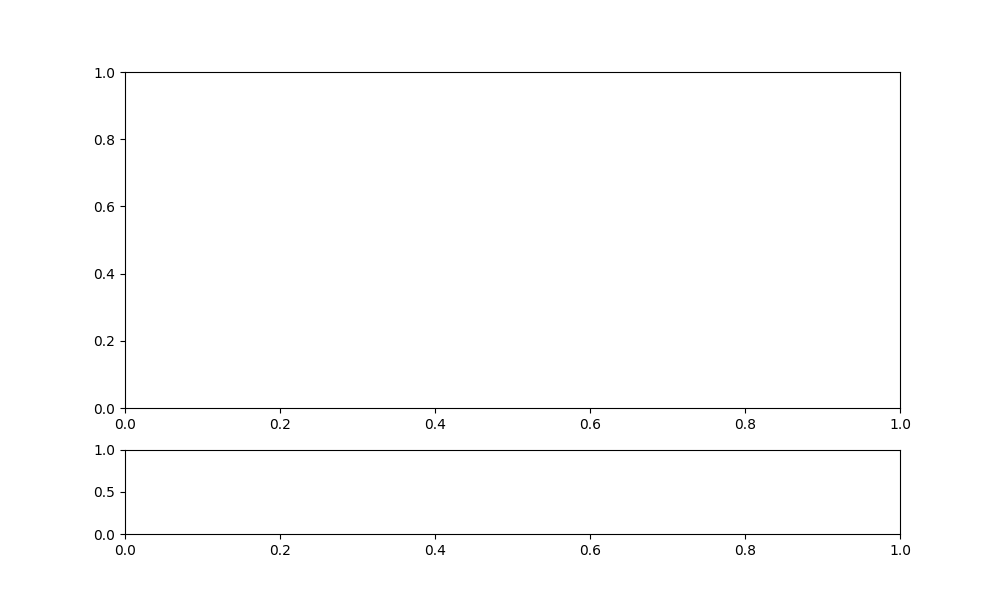

Connected successfully to MQTT Broker!


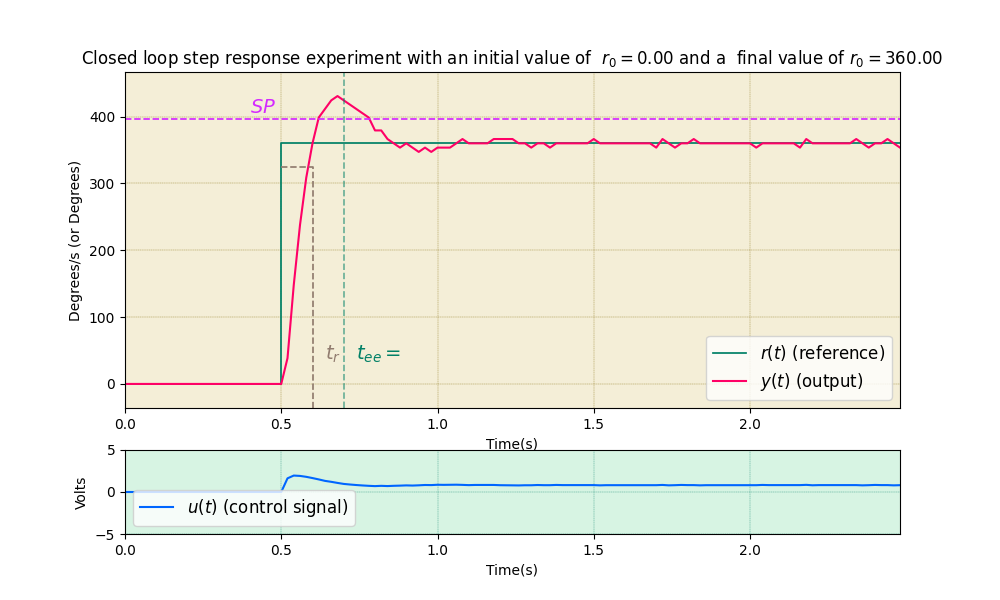

Sobre impulso:  19.642868041992188 %
Kp: 0.004517944620688467  Ki: 0.07017658644463157  wn: 12.453363600134333
Valores mayores que son SP estable: 1
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  325   (2,)


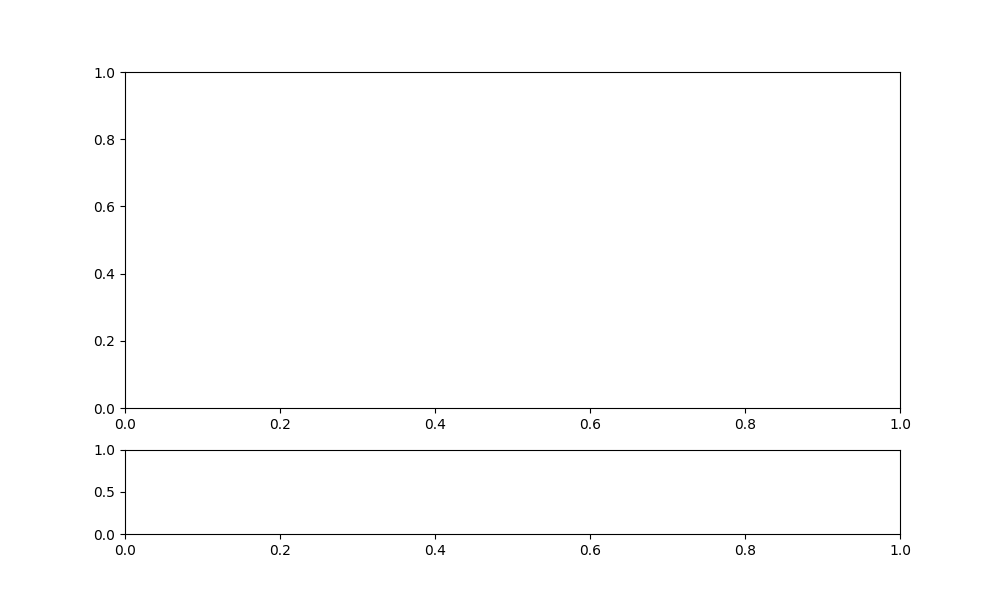

Connected successfully to MQTT Broker!


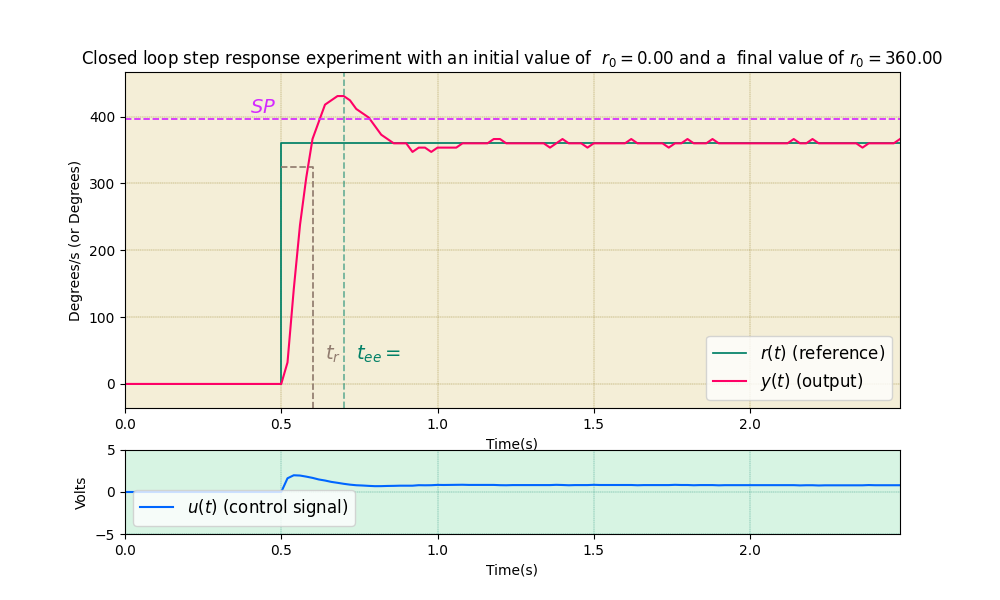

Sobre impulso:  19.642868041992188 %
Kp: 0.004530419757351495  Ki: 0.07043963564966363  wn: 12.476681800067166
Valores mayores que son SP estable: 2


In [76]:
Te = 0.02
i = 1
while contador <= 5 | i <= 8 :
    wn, zeta , kp , ki,  = reiterativoWn(wn, zeta, alpha, tau,Te)
    velwn = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velwn.kp,ki=velwn.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)
    
    plt.savefig(f"SintoniaVel_4_DelWn_{i}.png", format="png", bbox_inches="tight") # para salvar la figura

    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velwn.kp," Ki:", velwn.ki," wn:" , velwn.wn)
    resultado = [((yi - r1) / (r1 - r0)) * 100 for yi in y]

    contador = sum(1 for r in resultado if r > (SPreal- SPreal*0.001))

    print(f"Valores mayores que son SP estable: {contador}")
    i = i+1



Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  329   (2,)


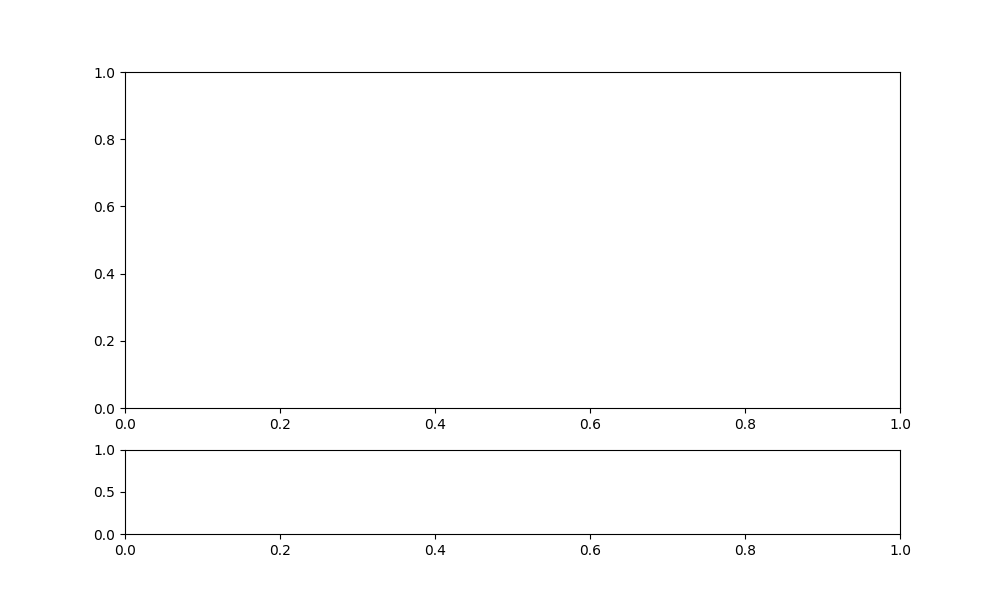

Connected successfully to MQTT Broker!


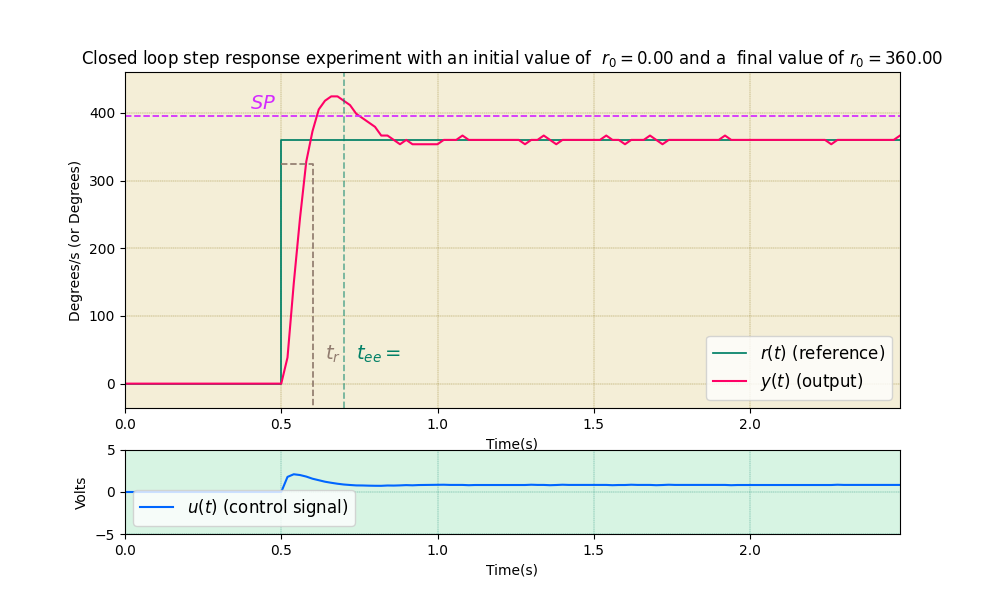

Zeta:  0.6320395304190078
Sobre impulso:  17.857157389322918 %
Kp: 0.004992063180144399  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  333   (2,)


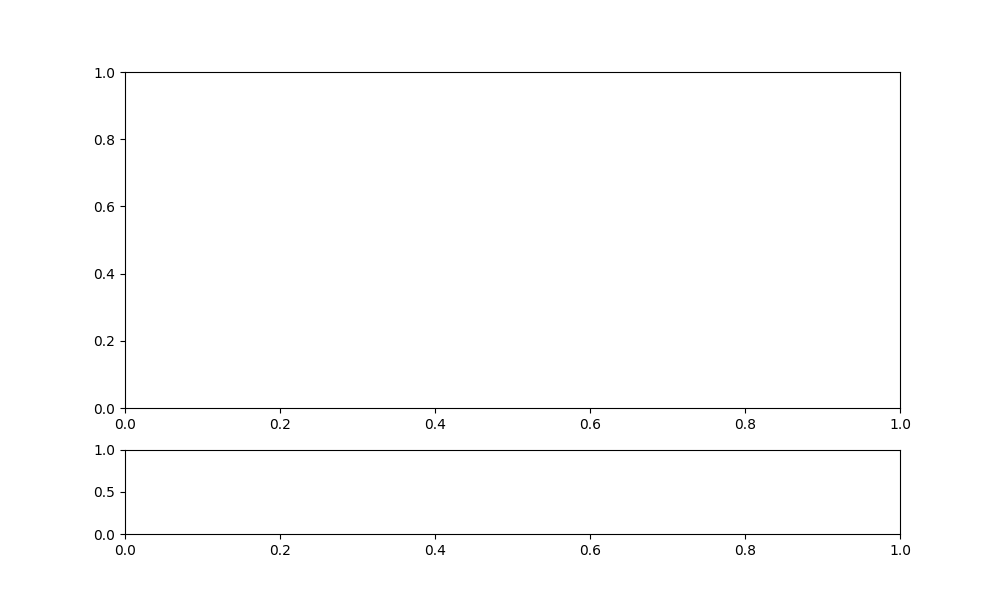

Connected successfully to MQTT Broker!


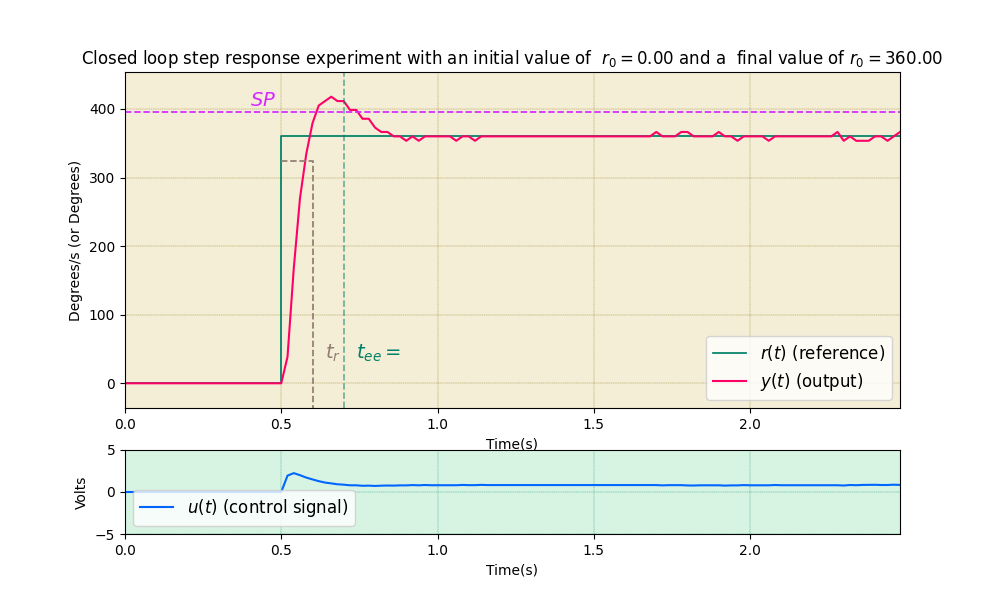

Zeta:  0.6688355773771071
Sobre impulso:  16.07143825954861 %
Kp: 0.005407542260658013  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  337   (2,)


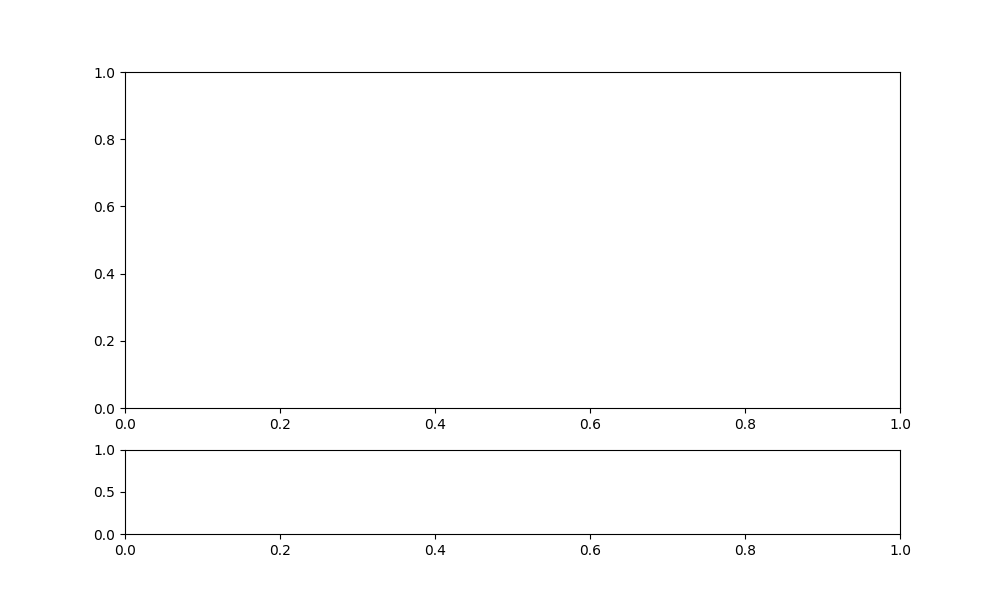

Connected successfully to MQTT Broker!


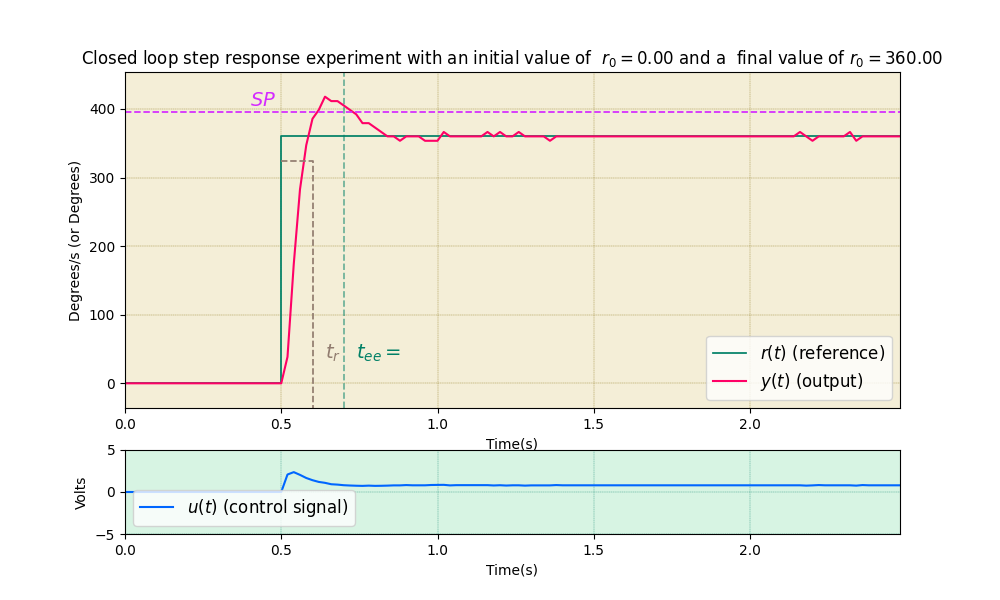

Zeta:  0.7019520196393964
Sobre impulso:  16.07143825954861 %
Kp: 0.005781473433120266  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  341   (2,)


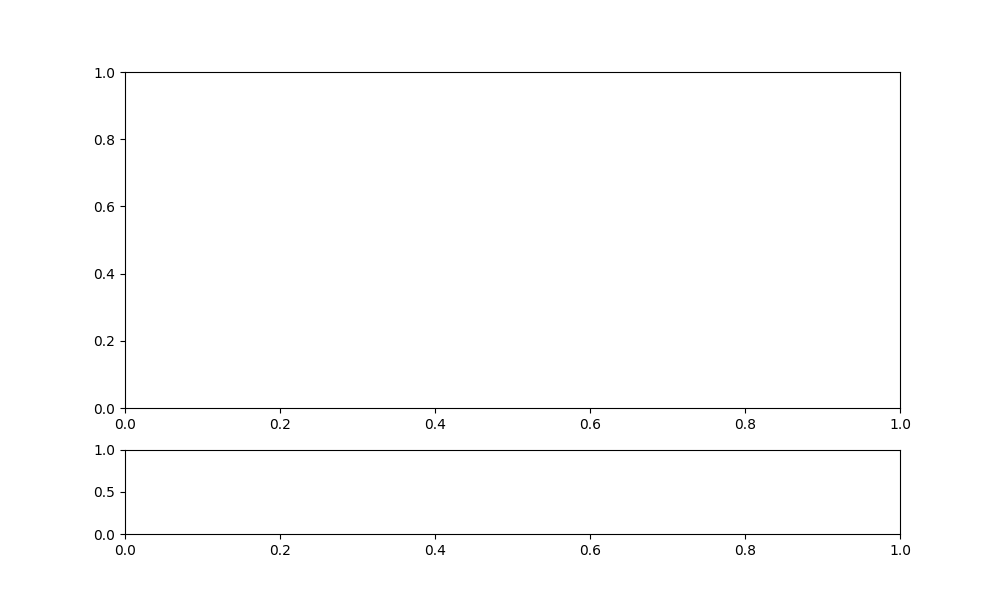

Connected successfully to MQTT Broker!


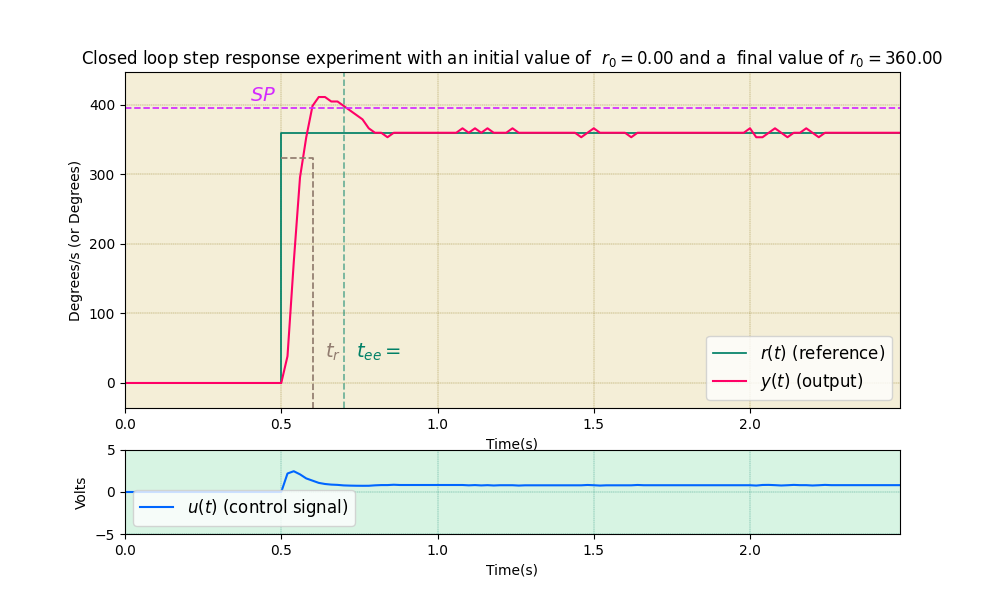

Zeta:  0.7317568176754567
Sobre impulso:  14.285719129774305 %
Kp: 0.006118011488336293  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  345   (2,)


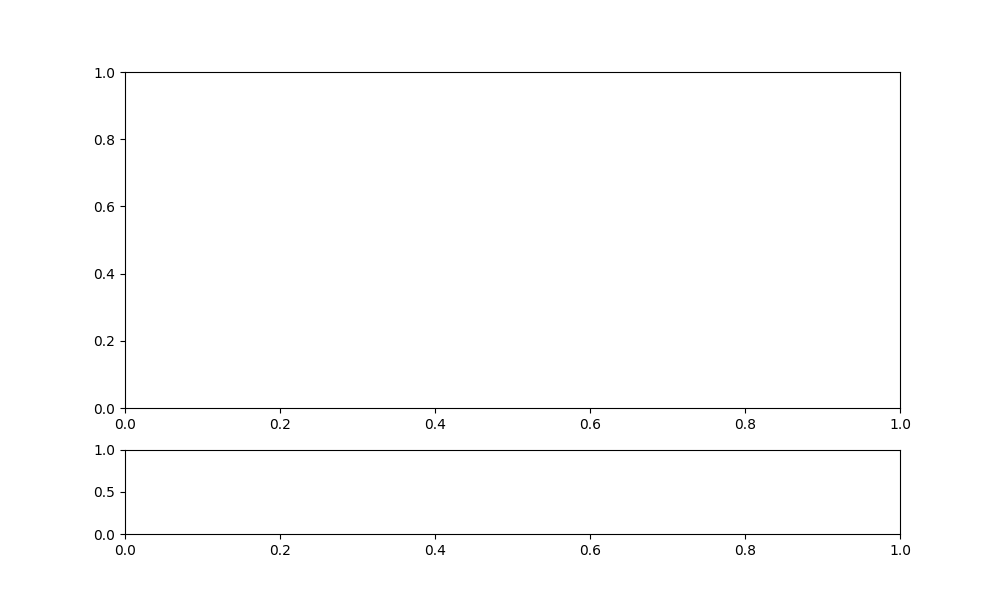

Connected successfully to MQTT Broker!


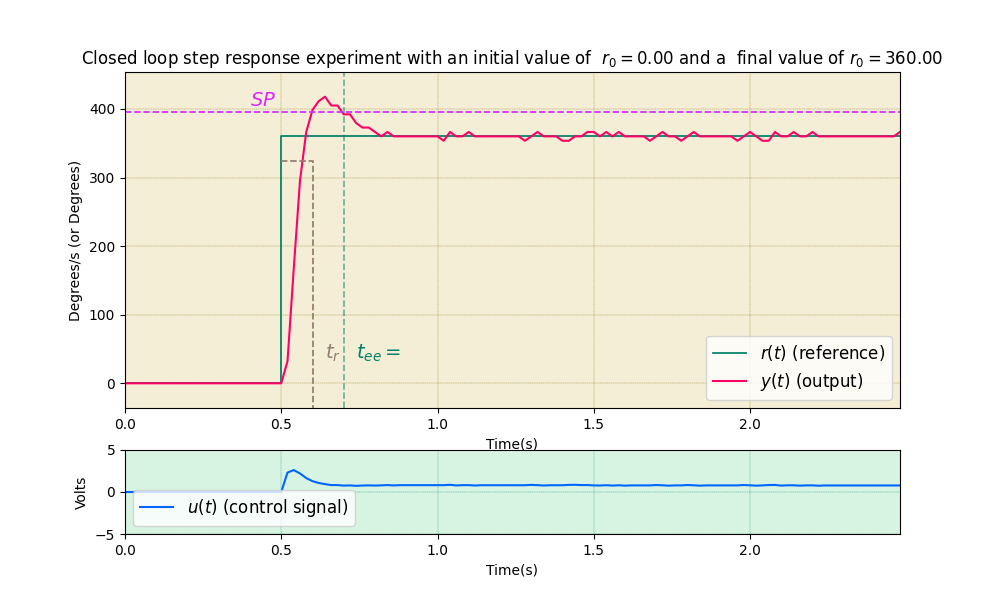

Zeta:  0.7585811359079111
Sobre impulso:  16.07143825954861 %
Kp: 0.0064208957380307175  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  349   (2,)


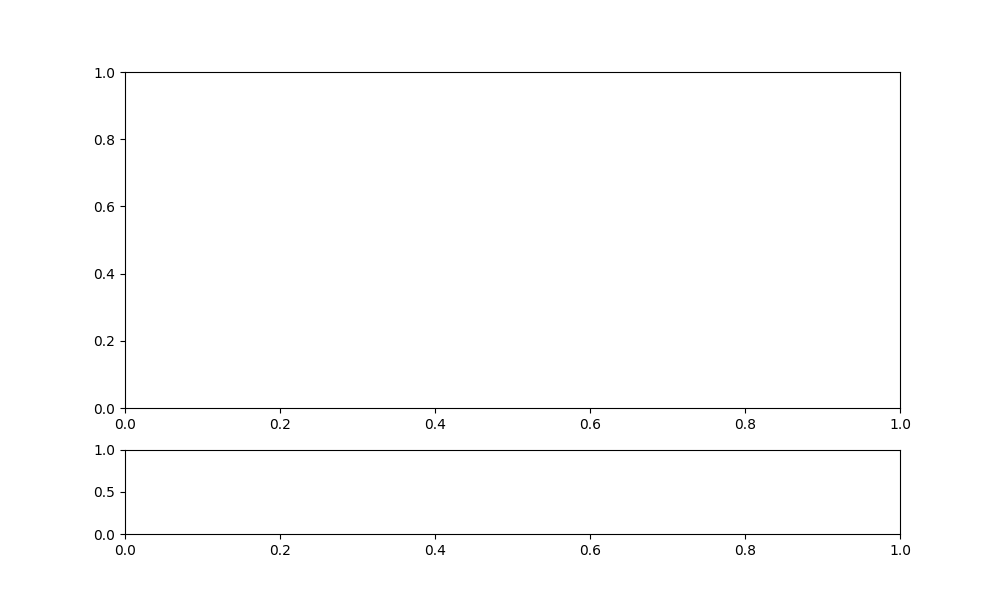

Connected successfully to MQTT Broker!


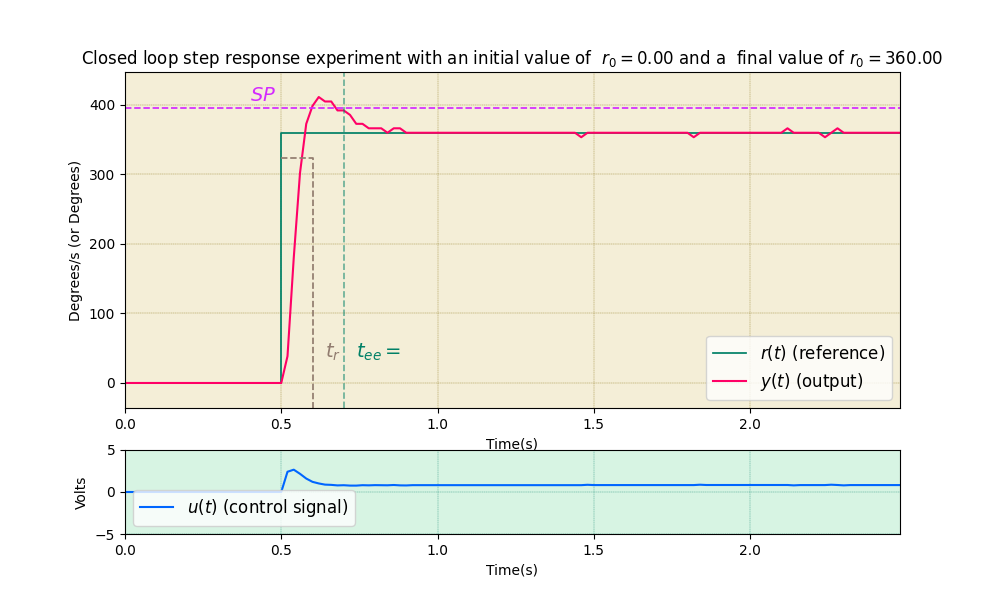

Zeta:  0.78272302231712
Sobre impulso:  14.285719129774305 %
Kp: 0.006693491562755699  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  353   (2,)


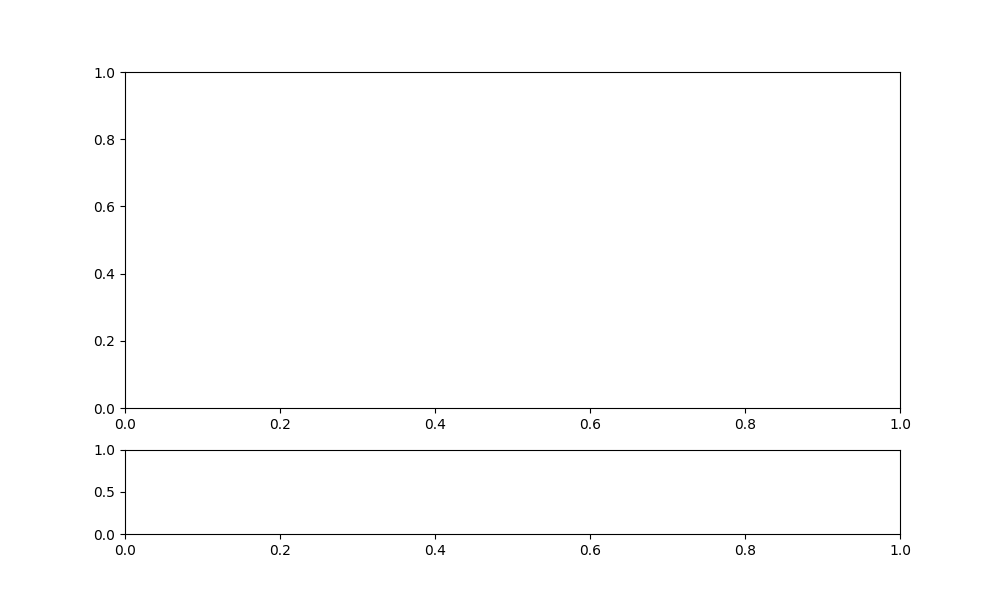

Connected successfully to MQTT Broker!


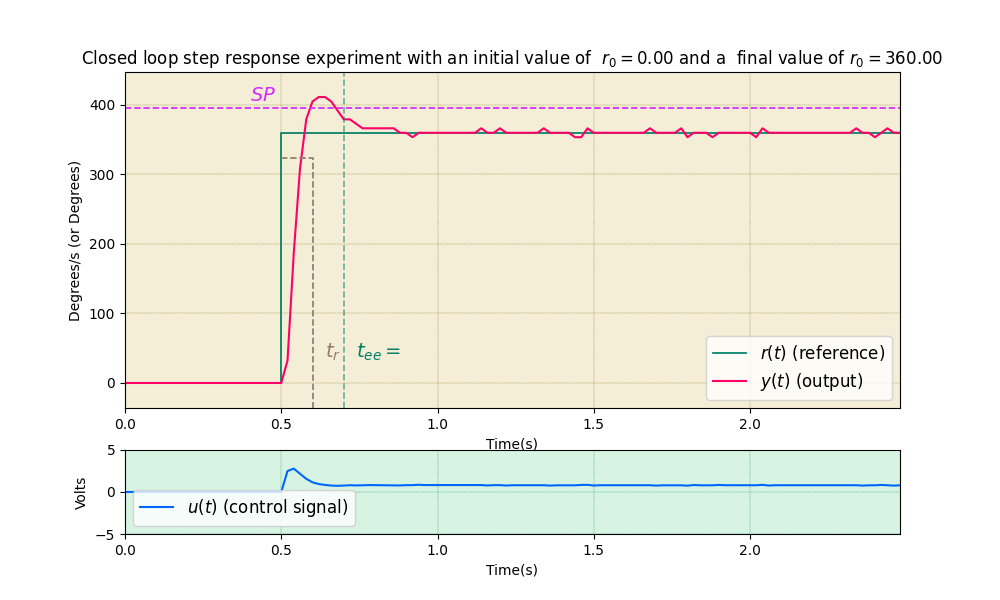

Zeta:  0.804450720085408
Sobre impulso:  14.285719129774305 %
Kp: 0.006938827805008183  Ki: 0.07043963564966363
Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  357   (2,)


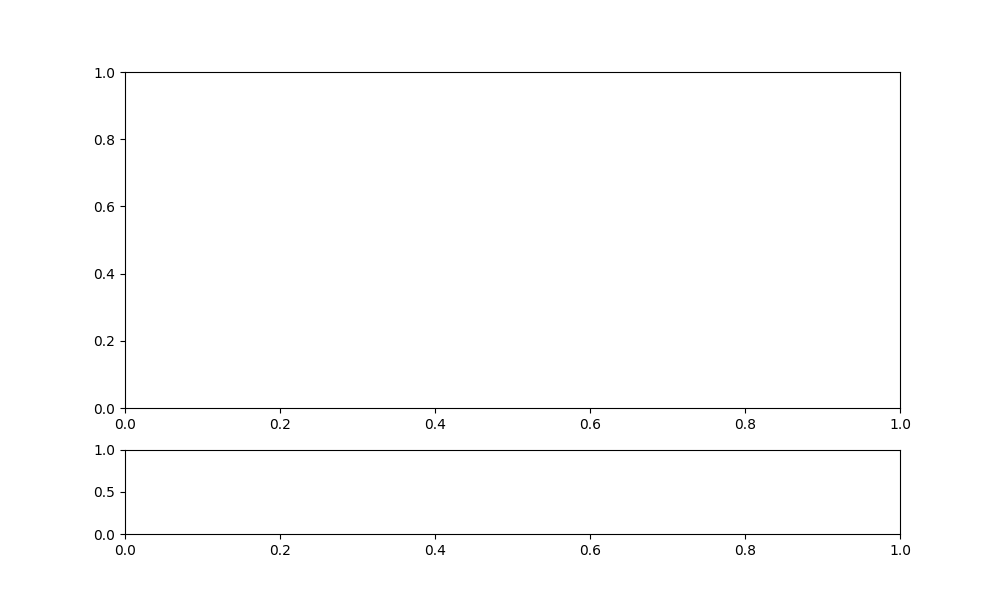

Connected successfully to MQTT Broker!


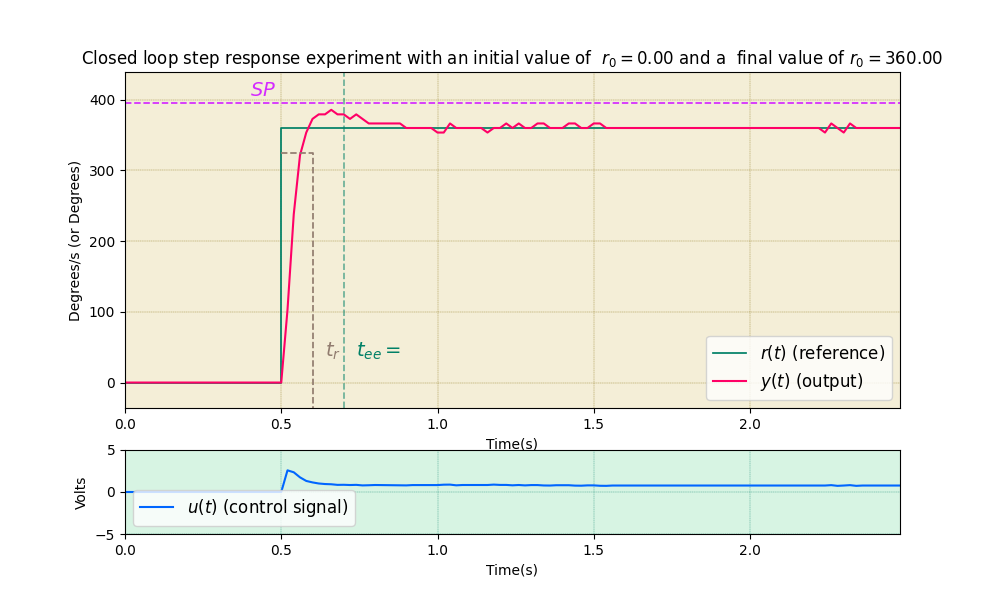

Zeta:  0.8240056480768672
Sobre impulso:  7.142868041992187 %
Kp: 0.007159630423035417  Ki: 0.07043963564966363


In [77]:
i = 1
while SPreal > SP:
    zeta , kp , ki = retirativoZeta(wn, zeta, alpha, tau)
    velf1 = Vel(zeta, wn, kp, ki)
    
    
    motor.set_pid(mi_motor,kp=velf1.kp,ki=velf1.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(tee, tr, SP)
    plt.savefig(f"SintoniaVel_4_DelZeta_{i}.png", format="png", bbox_inches="tight") # para salvar la figura
    plt.show() # para congelarla en el notebook
    SPreal = ((max(y)-r1)/(r1-r0)*100)
    print("Zeta: ",zeta)
    print("Sobre impulso: ",SPreal, "%")
    print("Kp:",velf1.kp," Ki:", velf1.ki)

    i = i+1

In [78]:
def draw_specifications(tee,tr, SP):
    import mplcursors
    fig=plt.gcf()
    ay, au = fig.get_axes()
    delta_r = r1 - r0

    # tee specification
    ay.axvline(tee+t0, color='#0080668F', linestyle='--', linewidth=1.25)
    ay.text(t0 +tee + t1/50 , r0 + 0.1*delta_r, "$t_{ee}=$", fontsize=14, color='#008066FF')

    # tr specification
    ay.plot([t0, t0+ tr, t0+ tr], [r0 + 0.9*delta_r, r0 + 0.9*delta_r, r0 - 0.1*delta_r],  color='#917c6fff', linestyle='--',linewidth=1.25)
    ay.text(t0 + tr + t1/50 , r0 + 0.1*delta_r, "$t_{r}$", fontsize=14,  color='#917c6fff')

    # SP specification
    ay.axhline(r1 + SP * delta_r /100, color='#d42affff', linestyle='--', linewidth=1.25)
    ay.text(0.8* t0 , r1 + (SP/100 + 0.025 ) * delta_r, "$SP$", fontsize=14, color='#d42affff')

    # pick in the graphic for returning values
    mplcursors.cursor(ay.lines) 
    return ay, au
    

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  361   (2,)


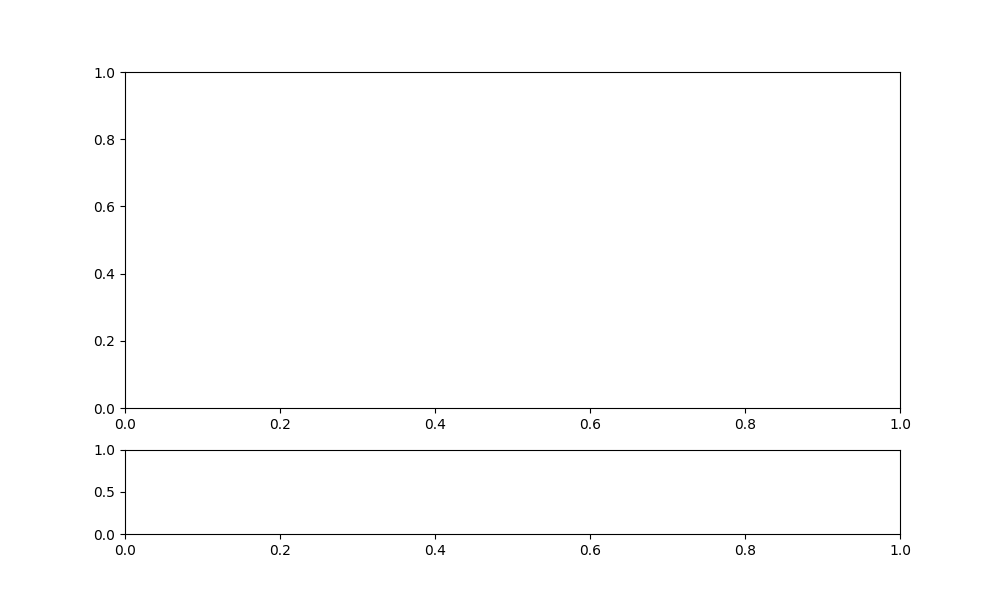

TimeoutError: The connection has been lost. Please try again

In [79]:
motor.set_pid(mi_motor,kp=vel1.kp,ki=vel1.ki,kd=0,beta=1, output="speed")
t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
plt.show() # para congelarla en el notebook

SPreal = (max(y)-r1)/(r1-r0)*100
print("SP real = ", SPreal)


z1, wn1 ,kp1, ki1  = medio(Vel1_SP,tau, Vel1_tee, Vel1_tr, alpha, Te,2)
velf1 = Vel(z1, wn1, kp1, ki1)

while SPreal > 10:


    motor.set_pid(mi_motor,kp=velf1.kp,ki=velf1.ki,kd=0,beta=1, output="speed")
    t, r, y, u  =motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
    motor.set_reference(mi_motor,0)
    draw_specifications(Vel1_tee, Vel1_tr, Vel1_SP)
    plt.savefig("SintoniaAlgbraica_velf1.png", format="png", bbox_inches="tight") # para salvar la figura
    plt.show() # para congelarla en el notebook

SPreal = (max(y)-r1)/(r1-r0)*100
print("SP real = ", SPreal)


#### Notas importantes:

1. El modelo usado para estos diseños es el modelo de primer orden obtenido con la función `get_models_prbs(.)` en el punto de operación de $360^o$.

2. Para el motor DC puede asumir que el tiempo de retraso no modelado es el tiempo de muestreo del controlador digital, esto es: 

$$T_{e}=0.02\,s$$

3. Se tiene también  la restricción de tensión que debemos (y podemos) aplicar al motor, dada por 
$$
|u(t)| \leq 5\,V
$$ 

4. Haga las iteraciones manualmente siguiendo el método, para ganar una comprensión intuitiva. Puede hacer los pasos 1-2 en una celda y en otra celda hacer los pasos 3-8, cambiando convenientemente los parámetros de diseño $\omega_n$ y $\zeta$. 

5. Use un cambio en la referencia de $0$ a $360^o/s$


6. Para todos los experimentos use la función `set_pid()` parametrizada con `beta=0` (para un PI de dos GDL) y con `output=speed` para el control de velocidad, como en el siguiente ejemplo. Puede usar la función `draw_specifications` dada a continuación para revisar los requerimientos de diseño. No tiene que definirla sino una vez.

Connected successfully to MQTT Broker!
succesfull change of PID parameters
Connected successfully to MQTT Broker!
Subscribed:  193   (2,)


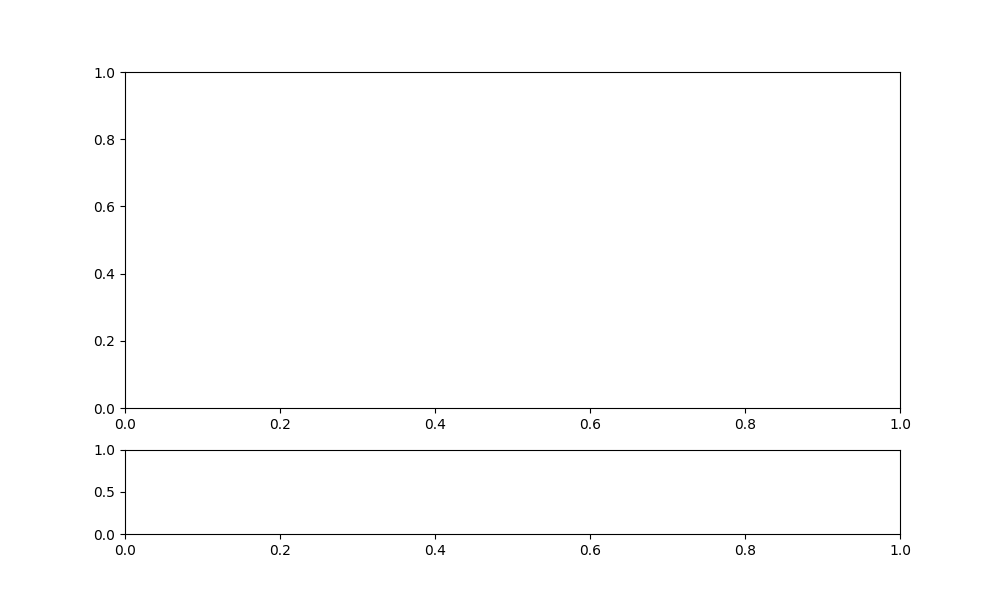

Connected successfully to MQTT Broker!


True

In [ ]:
def draw_specifications(tee,tr, SP):
    import mplcursors
    fig=plt.gcf()
    ay, au = fig.get_axes()
    delta_r = r1 - r0

    # tee specification
    ay.axvline(tee+t0, color='#0080668F', linestyle='--', linewidth=1.25)
    ay.text(t0 +tee + t1/50 , r0 + 0.1*delta_r, "$t_{ee}=$", fontsize=14, color='#008066FF')

    # tr specification
    ay.plot([t0, t0+ tr, t0+ tr], [r0 + 0.9*delta_r, r0 + 0.9*delta_r, r0 - 0.1*delta_r],  color='#917c6fff', linestyle='--',linewidth=1.25)
    ay.text(t0 + tr + t1/50 , r0 + 0.1*delta_r, "$t_{r}$", fontsize=14,  color='#917c6fff')

    # SP specification
    ay.axhline(r1 + SP * delta_r /100, color='#d42affff', linestyle='--', linewidth=1.25)
    ay.text(0.8* t0 , r1 + (SP/100 + 0.025 ) * delta_r, "$SP$", fontsize=14, color='#d42affff')

    # pick in the graphic for returning values
    mplcursors.cursor(ay.lines) 
    return ay, au


# ejemplo de configuración del PI para el motor con control de  velocidad

# especificaciones 
tee = 0.8
tr =  0.25
SP = 10

# programacion del PI y respuesta al escalón 
t0 = 0.5
t1 = 2
r0 = 0
r1 = 360
motor.set_pid(mi_motor,kp=0.001, ki=0.02, kd=0, beta=0, output="speed")
t, r, y, u = motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
draw_specifications(tee, tr, SP)

motor.set_reference(mi_motor,0)

#### Preguntas orientadoras

+ Al final de esta parte, además de los gráficos experimentales, presente una tabla con la siguiente información. 

| Controlador | $\zeta$ (final) | $\omega_n$ (final) |  $t_{ee}$ (real) | $t_r$ (real) | $SP$ (real) |

+ ¿Cual de estos controladores tiene la mejor respuesta a perturbaciones constantes, según la teoría y los resultados de la tabla?

### Experimento: Respuesta a perfiles de velocidad (rampas de aceleración programadas)


+ Obtenga el seguimiento a un perfil de velocidad usando la función  [`profile_closed()` (ver ayuda)](https://nebisman.github.io/UNThermal/profile_closed.html). para ***solo uno*** de los controladores PI diseñados para el motor controlado en velocidad.  . Use un perfil diseñado por usted y tenga en cuenta de generar rampas que el sistema alcance a seguir. 


+ Obtenga el seguimiento al perfil de velocidad con un controlador PI para el cual $\omega_n=0.8\omega_{max}$, siendo $\omega_{max}$ la frecuencia natural $\omega_n$ límite  a la cual sintonizó el el controlador. 


#### Preguntas orientadoras

+ Grafique la respuesta al perfil de velocidad de los dos controladores en una misma figura. El sintonizado con $\omega_{max}$ y el sintonizado con $\omega_n=0.8\omega_{max}$.


+ Compare el desempeño de los dos controladores ante el perfil de velocidad. 

### Sintonía algebraica de PI para el sistema térmico

Los principios generales son los mismos que usó en el motor DC  y que están en la guia [material sobre sintonía algebraica de un  PI para un sistema de primer orden.](https://github.com/nebisman/UNThermal/blob/main/docs/metodo_sintonia_algebraico_PI_PID.pdf).

#### Experimentos

 Use el método de sintonía algebraica descrito en el documento para obtener 4 controladores PI del sistema térmico,  de acuerdo con la siguiente tabla de especificaciones:

| Controlador | $t_{ee}$ (tiempo de establecimiento) | $t_r$ (tiempo de subida) | $SP$ (sobrepico) |
|-------------|-----------|-------|------|
| PI-TEMP-1        | $\leq\, 40\, s$     | $\leq\,20\, s$ | $=10\%$  |
| PI-TEMP-2        | $\leq\,40\, s$     | $\leq\,20\, s$ | $=5\%$  |
| PI-TEMP-3        | $\leq\,3\, s$     | $\leq\,1.5 s$ | $=10\%$  |
| PI-TEMP-4        | $\leq\,40\, s$     | $\leq 20 s$ | $=0\%$  |





#### Notas importantes:

1. El modelo usado para estos diseños es el modelo de primer orden de la figura siguiente, el cual fue obtenido con la función `get_models_prbs(.)`

<img src="https://github.com/nebisman/UNThermal/blob/main/code/python_code/notebooks_lab_2024_2/prbs_response.png?raw=true" alt="Gráfica de resultados" width="1000"/>

2. Note que para el sistema térmico, se puede asumir que el tiempo de retraso no modelado, es el tiempo de muestreo del controlador digital, esto es: 

$$T_{e}=0.8\,s$$

3. Se tiene también  la restricción de señal de control que podemos aplicar al sistema térmico es el porcentaje de potencia: 
$$
|u(t)| \leq 100\% 
$$ 

4. Haga las iteraciones manualmente siguiendo el método, para ganar una comprensión intuitiva. Puede hacer los pasos 1-2 en una celda y en otra celda hacer los pasos 3-8, cambiando convenientemente los parámetros de diseño $\omega_n$ y $\zeta$. 


5. Use un cambio en la referencia de $60^o$ a $70^o$.  

6. Para todos los experimentos use la función `set_pid()` parametrizada con `beta=0` (para un PI de dos GDL), como en el siguiente ejemplo y puede usar la función `draw_specifications` para revisar los requerimientos de diseño. 


In [ ]:
def draw_specifications(tee,tr, SP):
    import mplcursors
    fig=plt.gcf()
    ay, au = fig.get_axes()
    delta_r = r1 - r0

    # tee specification
    ay.axvline(tee+t0, color='#0080668F', linestyle='--', linewidth=1.25)
    ay.text(t0 +tee + t1/50 , r0 + 0.1*delta_r, "$t_{ee}=$", fontsize=14, color='#008066FF')

    # tr specification
    ay.plot([t0, t0+ tr, t0+ tr], [r0 + 0.9*delta_r, r0 + 0.9*delta_r, r0 - 0.1*delta_r],  color='#917c6fff', linestyle='--',linewidth=1.25)
    ay.text(t0 + tr + t1/50 , r0 + 0.1*delta_r, "$t_{r}$", fontsize=14,  color='#917c6fff')

    # SP specification
    ay.axhline(r1 + SP * delta_r /100, color='#d42affff', linestyle='--', linewidth=1.25)
    ay.text(0.8* t0 , r1 + (SP/100 + 0.025 ) * delta_r, "$SP$", fontsize=14, color='#d42affff')

    # pick in the graphic for returning values
    mplcursors.cursor(ay.lines) 
    return ay, au


Successfully connected to MQTT Broker 192.168.1.100
Command send:  4
PID parameters changed
Successfully connected to MQTT Broker 192.168.1.100
Subscribed:  5   (2,)
Command send:  6


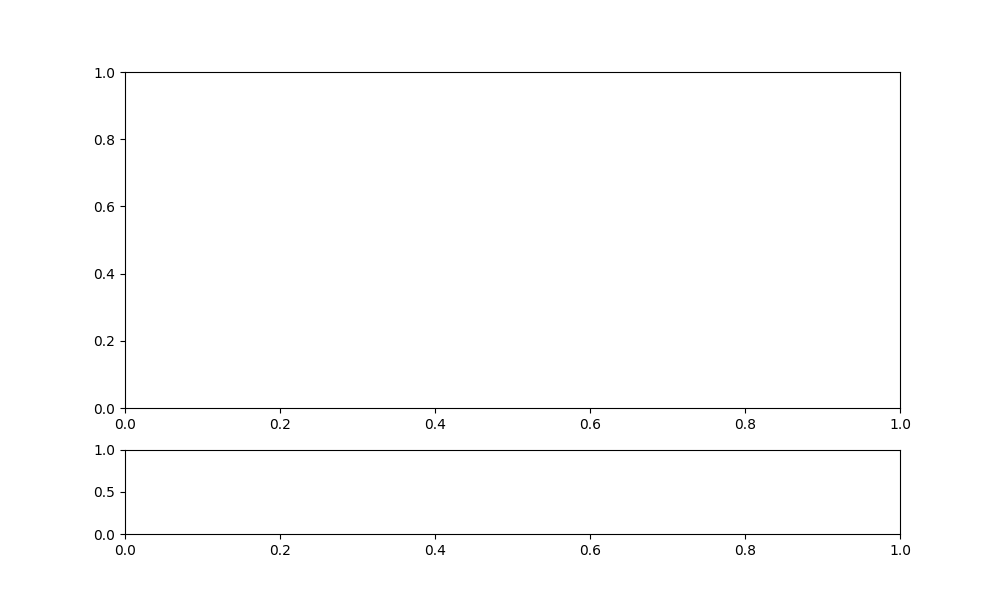

(<Axes: title={'center': 'Closed loop step response experiment with an initial value of  $r_0=$60.00 and a  final value of $r_0=$70.00'}, xlabel='Time (s)', ylabel='Power Input (%)'>,
 <Axes: xlabel='Time (s)'>)

In [ ]:
# ejemplo de configuración del PI para sistema térmico

# especificaciones 
tee = 45
tr =  15
SP =  27 

# programacion del PI y respuesta al escalon

t0 = 70
t1 = 70
r0 = 60
r1 = 70
temp.set_pid(mi_termico, kp=4, ki=1, kd=0, beta=0)
t, r, y, u = temp.step_closed(mi_termico, r0=r0, r1=r1, t0=t0, t1=t1);

# funcion para dibujar los requerimientos de diseno
draw_specifications(tee, tr, SP)

In [ ]:
# Controlador PI-Temp-1
import math
# especificaciones
SP = 10
tr = 20
tee = 40
Te = 0.8

tau = 32.20
alpha = 1.05
# Paso 1
zeta = math.fabs((math.log(SP/100)))/(math.sqrt(math.pi**2 + math.log(SP/100)**2))
print("zeta = ", zeta)
# Paso 2
wn = max(1/(2*zeta*tau), 4.5/(zeta*tee), 3.5/(tr))
print("wn = ", wn)

if 1/(2*zeta*tau) < wn < 0.25/Te:
    print(wn, " es un wn valido, y esta entre", 1/(2*zeta*tau), "y", 0.25/Te)
else :
    print(wn, " no es un wn valido")

zeta =  0.5911550337988976
wn =  0.19030540817194644
0.19030540817194644  es un wn valido, y esta entre 0.026267137083774525 y 0.3125


wn =  0.28
zeta =  0.5911550337988976
kp =  9.19972149472545
ki =  2.404266666666667
Successfully connected to MQTT Broker 192.168.1.100
Command send:  7
PID parameters changed
Successfully connected to MQTT Broker 192.168.1.100
Subscribed:  8   (2,)
Command send:  9


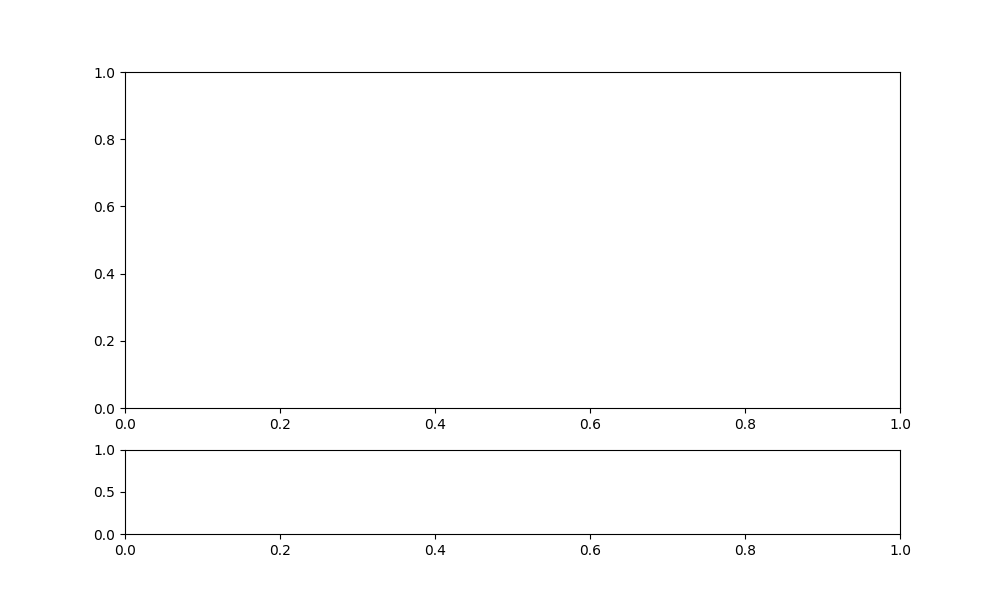

In [ ]:
# Paso 3
wn = 0.29
print("wn = ", wn)
zeta = zeta
print("zeta = ", zeta)

kp = (2*tau*zeta*wn-1)/alpha
print("kp = ", kp)
ki = (tau*wn**2)/alpha
print("ki = ", ki)

# Paso 4
t0 = 70
t1 = 70
r0 = 60
r1 = 70

temp.set_pid(mi_termico, kp=kp, ki=ki, kd=0, beta=0)
t, r, y, u = temp.step_closed(mi_termico, r0=r0, r1=r1, t0=t0, t1=t1);
draw_specifications(tee, tr, SP)

plt.savefig("Ctrl PI-Temp-1.png", format="png", bbox_inches="tight")

#### Preguntas orientadoras

+ Al final de esta parte, además de los gráficos experimentales, presente una tabla con la siguiente información. 

| Controlador | $\zeta$ (final) | $\omega_n$ (final) |  $t_{ee}$ (real) | $t_r$ (real) | $SP$ (real) |

+ ¿Cual de estos controladores tiene la mejor respuesta a perturbaciones, según la teoría y los resultados de la tabla anterior ?

## Control PID del ángulo del motor DC

___

Revise cuidadosamente y comprenda el  [material sobre sintonía algebraica de un  PID para control de ángulo en un motor DC de este documento.](https://github.com/nebisman/UNThermal/blob/main/docs/metodo_sintonia_algebraico_PI_PID.pdf) Una vez realizada esta revisión, realice el siguiente trabajo experimental.


### Experimentos


1. Use la función `get_models_prbs(.)` para obtener un modelo en baja velocidad, en el punto de operación $y_{OP}=100^o/s$.

2.  Use el método de sintonía algebraica descrito en el [documento](https://github.com/nebisman/UNThermal/blob/main/docs/metodo_sintonia_algebraico_PI_PID.pdf) para obtener 4 controladores PID para el control del ángulo $\theta$ del motor,  de acuerdo con la siguiente tabla de especificaciones:

| Controlador | $t_{ee}$ (tiempo de establecimiento) | $t_r$ (tiempo de subida) | $SP$ (sobrepico) |
|-------------|-----------|-------|------|
| PID-ANGULO-1        | $\leq\,0.2 s$     | $\leq\,0.1 s$ | $=10\%$  |
| PID-ANGULO-2        | $\leq\,1.5 s$     | $\leq\,0.8 s$ | $=10\%$  |
| PID-ANGULO-3        | $\leq\,1.5 s$     | $\leq\,0.8 s$ | $=5\%$  |
| PID-ANGULO-4        | $\leq\,1.5 s$     | $\leq\,0.8 s$ | $=0\%$  |



#### Notas importantes:

1. El modelo usado para estos diseños es el modelo de primer orden ontenido con la función `get_models_prbs(.)` a una velocidad de $100^o/s$.

2. Note que para el motor DC puede asumir que el tiempo de retraso no modelado, es el tiempo de muestreo del controlador digital, esto es: 

$$T_{e}=0.02\,s$$

3. Se tiene también  la restricción de tensión que debemos (y podemos) aplicar al motor, dada por 
$$
|u(t)| \leq 5\,V
$$ 

4. Haga las iteraciones manualmente siguiendo el método, para ganar una comprensión intuitiva. Puede hacer los pasos 1-2 en una celda y en otra celda hacer los pasos 3-9, cambiando convenientemente los parámetros de diseño $\omega_n$ y $\zeta$. 

5. Use un cambio en la referencia de $0$ a $100^o$.


6. Para todos los experimentos use la función `set_pid()` parametrizada con `beta=0` (para un PI de dos GDL) y con `output=angle` para control de ángulo, como en el siguiente ejemplo. Puede usar la función `draw_specifications` para revisar los requerimientos de diseño. 

In [ ]:
# ejemplo de configuración del PID para el motor con control de ángulo

# especificaciones 
tee = 0.8
tr =  0.25
SP = 10

# programacion del PID y respuesta al escalón 
t0 = 0.5
t1 = 2
r0 = 0
r1 = 100

motor.set_pid(mi_motor,kp=0.075, ki=1, kd=0.01, beta=0, output="angle", deadzone=0)
t, r, y, u = motor.step_closed(mi_motor,r0=r0, r1=r1, t0=t0, t1=t1);
draw_specifications(tee, tr, SP)

#### Preguntas orientadoras


+ Al final de esta parte, además de los gráficos experimentales, presente una tabla con la siguiente información. 

| Controlador | $\zeta$ (final) | $\omega_n$ (final) |  $t_{ee}$ (real) | $t_r$ (real) | $SP$ (real) | 

+ ¿Cuál de estos controladores tiene la mejor respuesta a perturbaciones, según la teoría y los resultados de la tabla ?

### Experimento con $\zeta<0$


+ Para el controlador PID-ANGULO-2 cambie el valor de $\zeta$ por $-\zeta$ y calcule las constantes del PID. Programe el PID y obtenga la respuesta al escalón.

#### Pregunta orientadora

Observe y explique el fenómeno del experimento anterior. 




#### Experimento respuesta a perfiles de ángulo (rampas de velocidad programadas)


+ Obtenga el seguimiento a un perfil de ángulo usando la función `profile_closed()` para ***solo uno*** de los controladores PID  diseñados para el control de ángulo del motor DC. Use un perfil diseñado por usted y tenga en cuenta de generar rampas que el motor pueda alcanzar. 


+ Obtenga el seguimiento a un perfil de ángulo con un controlador PID para el cual $\omega_n=0.8\omega_{max}$, siendo $\omega_{max}$ la frecuencia natural $\omega_n$ límite  a la cual sintonizó el controlador diseñado. 



#### Preguntas orientadoras

+ Grafique la respuesta al perfil de ángulo  de los dos controladores en la misma figura. El sintonizado con $\omega_{max}$ y el sintonizado con $\omega_n=0.8\omega_{max}$.

+ Compare el desempeño de los dos controladores.

## Reto para bonificación

Estos puntos son un reto para bonificación. Son completamente opcionales. 

+ Con base en el método de sintonía algebraica, programe una función de autosintonía que ajuste los parámetros PI para el control de velocidad del motor o para el sistema térmico, dado un determinado sobrepico, tiempo de establecimiento y tiempo de subida. 


+ Con base en el método de sintonía algebraica, programe una función de autosintonía que ajuste los parámetros PID para el control de ángulo del motor, dado un determinado sobrepico, tiempo de establecimiento y tiempo de subida.